In [1]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler
import category_encoders as ce
from pandas_profiling import ProfileReport
import datetime
import pandas_profiling
from datetime import datetime
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 200)

In [2]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from collections import Counter

In [3]:
from sklearn.neighbors import LocalOutlierFactor
from numpy import quantile, where, random

In [4]:
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram
import matplotlib.cm as cm
from yellowbrick.cluster import KElbowVisualizer

In [5]:
#pip install yellowbrick

In [6]:
import numpy as np

import matplotlib as mpl
from matplotlib import pyplot as plt
from matplotlib import cm

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer

from sklearn.datasets import fetch_california_housing


In [7]:
from scipy import stats
import seaborn as sns
from math import ceil

In [8]:
from os.path import join
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier

import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

In [9]:
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz

In [228]:
#DBSCAN
from sklearn.neighbors import NearestNeighbors

In [224]:
# GMM
from sklearn.mixture import GaussianMixture

* [QUEBRA](#quebra)


* [1. Data importation](#data_importation)
* [2. Data Preprocessing](#data_preprocessing)
    * [2.1. Initial variable exclusion](#initial_exclusion)
    * [2.2. Initial feature transformation](#initial_transformation)
    * [2.3. Feature exclusion by missing values](#exclud_missings)
    * [2.4. Boolean Transformation](#bool_transform)
    * [2.5. Excluding Variables Through Correlation](#exclud_corr)
    * [2.6. Feature Encoding](#feature_encode)
    * [2.7. Missing values imputation](#imput_missing)
    * [2.8. Scaling data](#data_scaling)
    * [2.9. Outlier removal](#out_remove)
        * [2.9.1. IQR](#out_iqr)
        * [2.9.2. Z-scores](#z_scores)
        * [2.9.3. Using PCA](#out_pca)
        * [2.9.4. DBSCAN](#out_dbscan)
        * [2.9.5. Local Outlier Factor](#out_lof)
* [3. Division of Features by Category](#categ_div)
    * [3.1. Additional Tranformations](#add_transform)
    * [3.2. Scaling data](#data_scaling2)
    * [3.3. Feature Correlations](#feat_corr)
    * [3.4. PCA for census category](#pca_census)
* [4. Clustering](#clustering)
    * [4.1. Dataframe sample](#sample)
    * [4.2. Optimal Clusterer](#opt_clust)
        * [4.2.1. Demographic Features](#oc_dem)
        * [4.2.2. Summary Features](#oc_sum)
        * [4.2.3. Census Features](#oc_cen)
    * [4.3. Defining the number of clusters](#num_clust)
        * [4.3.1. Demographic Features](#nc_dem)
        * [4.3.2. Summary Features](#nc_sum)
        * [4.3.3. Census Features with pca](#nc_cen_pca)
        * [4.3.4. Census Features](#nc_cen)
    * [4.4. Clustering with the most important features](#most_imp_cl)
    * [4.5. K-Means](#k_means)
         * [4.5.1. Demographic Features](#k_dem)
         * [4.5.2. Census Features](#k_cen)
         * [4.5.3. Summary Features](#k_sum)
         * [4.5.4. Visualize Category Final Dataframes](#final_cat)
         * [4.5.5. Merge Categories](#merge_cat)
    * [4.6. Decision Tree](#dt)
    * [4.7. Classification of Outliers](#out_class)
    * [4.8. Cluster visualization using t-SNE](#t_sne)
    * [4.9. DBSCAN](#dbscan_noise)
    * [4.10. GMM](#gmm)



<a class="anchor" id="none">

<hr>
<a class="anchor" id="data_importation">
    
<font size="8"><span style='color:DarkTurquoise'> **1. Data Importation**  </span></font>
    
</a>

In [10]:
data = pd.read_csv('donors.csv')
data.head(3)

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,

<hr>
<a class="anchor" id="data_preprocessing">
    
<font size="8"><span style='color:DarkTurquoise'> **2. Data Preprocessing**  </span></font>
    
</a>

In [11]:
data.drop(['Unnamed: 0'], axis=1, inplace=True)

In [12]:
data.shape[0]

95412

In [13]:
df = data.copy() 
any(df.duplicated())

False

<a class="anchor" id="initial_exclusion">
    
<font size="5"><span style='color:LightSkyBlue'> **2.1. Initial Variable Exclusion**  </span></font>
    
</a>

In [14]:
df.drop(df.loc[df['MAILCODE']=='B'].index, inplace=True)
df.drop(['MAILCODE'], axis = 1, inplace = True)
df.shape[0]/data.shape[0]

0.9853372741374251

In [15]:
df.drop(['DATASRCE', 'LIFESRC', 'NOEXCH', 'WEALTH1', ], axis = 1, inplace = True) 
df.drop(df.loc[df['SOLP3']=='00'].index, inplace=True)
df.drop(df.loc[df['SOLIH']=='00'].index, inplace=True)
df.shape[0]/data.shape[0]

0.9817737810757556

<a class="anchor" id="initial_transformation">
    
<font size="5"><span style='color:LightSkyBlue'> **2.2. Initial Feature Transformation**  </span></font>
    
</a>

In [16]:
df['DOB'] = 2017 - df['DOB'].str[:4].fillna(0).astype(int)
df['DOB'] = df['DOB'].replace(2017, np.nan)
df['DOB'].isna().sum()

NumExpr defaulting to 8 threads.


23292

In [17]:
df=df.rename(columns={'DOB':'AGE'}) 

In [18]:
df['ETH4']= df['ETH12']+ df['ETH4']
df['ETH5']= df['ETH5']+df['ETH13']+ df['ETH14']+ df['ETH15'] + df['ETH16']
df['ETH6']= df['ETH6']+df['ETH8']+ df['ETH9']+ df['ETH10'] + df['ETH11']
df.drop(['ETH12', 'ETH13', 'ETH14', 'ETH15','ETH16', 'ETH8', 'ETH9', 'ETH10', 'ETH11'], axis = 1, inplace = True)

df['IC7']= df['IC7']+df['IC8']
df['IC8']= df['IC9']+df['IC10']
df['IC9']= df['IC11']+df['IC12']
df.drop(['IC10', 'IC11', 'IC12'], axis = 1, inplace = True)

In [19]:
df = df[df.POP901 >0] #it must have at least someone 

In [20]:
df.shape[0]/data.shape[0]

0.9737139982392152

In [21]:
df.drop(['TPE4', 'TPE5', 'TPE6', 'TPE7', 'EIC2', 'OEDC7', 'AFC1', 'AFC2', 'AFC3','HC9','HC10','HC15'], axis=1, inplace=True) #large number of zeros
df.drop(['LFC8', 'LFC9'], axis=1, inplace=True) #many extreme percentages 0 and 100% 
df.drop('GEOCODE2', axis=1, inplace=True) #we have no information of what the codes mean
df.drop(['RECINHSE', 'RECP3', 'RECPGVG', 'RECSWEEP', 'PVASTATE','SOLP3', 'SOLIH', 'GEOCODE'], axis=1, inplace=True) #too many null values (not defined as nan by default)
df.drop(['RFA_2R'], axis=1, inplace=True) #RFA_2R - constant value
df.drop(['MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV'], axis=1, inplace=True) #not related to the census, can't really understand to each population it refers to 
df=df.reset_index(drop=True)
for index in range(len(df)):
    if pd.isna(df['NUMCHLD'][index]):
        if ((df['CHILD03'][index]==' ' and df['CHILD07'][index]==' ') and (df['CHILD12'][index]==' ' and df['CHILD18'][index]==' ')):
            df['NUMCHLD'][index] = 0
            
df.drop(['CHILD03', 'CHILD07','CHILD12','CHILD18'], axis=1, inplace=True)
df[['ZIP','null']] = df.ZIP.str.split("-",1, expand=True)
df.drop(['null'], axis=1, inplace=True)
df.ZIP = df.ZIP.astype('int')

In [22]:
df.NUMCHLD.isna().sum()

1525

<a class="anchor" id="exclud_missings">
    
<font size="6"><span style='color:LightSkyBlue'> **2.3. Feature exclusion by missing values**  </span></font>
    
</a>


In [23]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
for index in range(len(missing_value_df)):
    if missing_value_df['percent_missing'][index]>=45:
        df.drop(missing_value_df['column_name'][index], axis=1, inplace=True)


<a class="anchor" id="bool_transform">
    
<font size="6"><span style='color:LightSkyBlue'> **2.4. Boolean Transformation**  </span></font>
    
</a>


In [24]:
#find which columns represent booleans
def get_bools(data):
    bools=[]
    for col in data:
        if len(data[col].unique()) == 2:
            bools.append(col)
    return bools
bools = get_bools(df)

#find wich columns are dates
dates = df.filter(like='DATE').columns

#tranform those dates into datetime and then into days
df[dates] = df[dates].apply(pd.to_datetime)
df[dates] = (datetime(2017, 12, 31) - df[dates]) #CONFIRMAR ESTE DIA
df[dates]= df[dates].astype('timedelta64[D]')

#transform booleans to binary
df[bools]=df[bools].replace([' ','U'],0)
df[bools]=df[bools].replace(['X','Y','H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,H,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,13,28,2,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,96,0,4,0,0,99,0

In [25]:
#turn variables into binary
bols = ['HOMEOWNR']
df[bols]=df[bols].replace([' ','U'],0)
df[bols]=df[bols].replace(['H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,13,28,2,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,96,0,4,0,0,99,

In [26]:
df_ = df.replace(' ', np.nan)

In [27]:
df_.GENDER.value_counts()

F    50000
M    38052
U     1673
J      357
C        2
A        2
Name: GENDER, dtype: int64

In [28]:
df_.GENDER.fillna('U', inplace = True)  

df_.drop(df_[df_.GENDER == 'C'].index, inplace=True)  #in metadata there is no reference to these two values
df_.drop(df_[df_.GENDER == 'A'].index, inplace=True)

df_.GENDER = df_.GENDER.replace(['F'],0)
df_.GENDER = df_.GENDER.replace(['M'],1)
df_.GENDER = df_.GENDER.replace(['U','J'],2)

<a class="anchor" id="exclud_corr">
    
<font size="6"><span style='color:LightSkyBlue'> **2.5. Excluding Variables Through Correlation**  </span></font>
    
</a>



<a class="anchor" id="corr">

In [29]:
blacklist=[]
corr_matrix=df_.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[j, i]) > 0.85:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            
            if colname in blacklist or rowname in blacklist:
                continue
            list1 = []
            list2 = []
            for k, index in enumerate(corr_matrix[colname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list1.append(1-abs(index)) 
            for k, index in enumerate(corr_matrix[rowname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list2.append(1-abs(index))
            if sum(list1)>sum(list2):
                blacklist.append(colname)
                df_.drop(colname, axis=1, inplace=True)

            else:
                blacklist.append(rowname)
                df_.drop(rowname, axis=1, inplace=True)
                
for column in corr_matrix.columns:
    if (corr_matrix[column]< 0.1).all() is True:
        corr_matrix.drop(column, axis=1, inplace=True)
        df_.drop(column, axis=1, inplace=True)

In [30]:
df_.drop(df_.loc[:,'ADATE_2':'RFA_24'], axis=1, inplace =True)   
#RFA has a high degree of cardinality
#we have other more important dates than to know for each gift

df_.drop(['OSOURCE', 'DOMAIN', 'MDMAUD'], axis=1, inplace=True) #high cardinality
#Domain has other variables that explain this, is redundant 
#MDMAUD we have other values that contain this information (the other MDMAUD_)

df_.drop(['HVP5',  # we already have the median home value, it's skewed
         'IC7','IC8', 'IC16', 'IC17', 'IC18', 'IC19','IC20','IC21','IC23','IC22',  #we have the income per capita and other values that explain this
         'TPE11'], axis=1, inplace=True)  #drop the average bc we have the median and it's slightly skewed

df_.drop(['HHD11',  #we have hhd10 and hhd3, redundant
         'ETHC1','ETHC2','ETHC3','ETHC5','ETHC6'], axis=1, inplace=True)   #we have other variables that explain this information

df_.drop(['TCODE', 'HPHONE_D'], axis=1, inplace=True)
df_.drop(['MSA', 'ADI', 'DMA'], axis=1,inplace=True) #codes
df_.drop(['MDMAUD_F', 'MDMAUD_R', 'MDMAUD_A'], axis=1, inplace=True)   

In [31]:
df_

,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A
0,IL,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,E
1,CA,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,G
2,NC,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,E
3,CA,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,E
4,FL,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,10,25,254.0,8,3.0,1552.0,15.0,730.0,15.0,730.0,6453.0,14.0,6.864865,7112,2,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [32]:
corr_matrix=df_.corr()
corr_features =[]
for i in range(len(corr_matrix .columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= 0.80:
            colname1 = corr_matrix.columns[i]
            colname2 = corr_matrix.columns[j]
            corr_features.append((colname1, colname2))
corr_features

[('HHD3', 'HU2'), ('HUPA6', 'HU2'), ('VOC2', 'HHD3'), ('VOC3', 'VOC2')]

In [33]:
def get_numeric(data,bools):
    data = data.drop(columns= bools)
    numeric_data = data.select_dtypes(include=[np.number]).columns.to_list()
    return numeric_data


def get_categorical(data,numeric,bools):
    categorical_data = data.columns.drop(numeric+bools).to_list()
    return categorical_data

def update_dtypes(data):
    bools = get_bools(data)
    numeric_data = get_numeric(data,bools)
    categorical_data = get_categorical(data,numeric_data,bools)
    return bools,numeric_data,categorical_data

bools,numeric_data,categorical_data = update_dtypes(df_)

<a class="anchor" id="feature_encode">
    
<font size="6"><span style='color:LightSkyBlue'> **2.6. Feature Encoding**  </span></font>
    
</a>


In [34]:
df_.RFA_2A.value_counts()

F    45838
E    21083
G    18743
D     7236
Name: RFA_2A, dtype: int64

In [35]:
 # create object of Ordinalencoding to deal with the variable education level
encoder= ce.OrdinalEncoder(cols=['RFA_2A'],return_df=True,
                           mapping=[{'col':'RFA_2A',
'mapping':{'D':0, 'E':1, 'F':2, 'G':3}}])

#fit and transform train data 
df_transformed = encoder.fit_transform(df_)
#check
df_transformed.RFA_2A.value_counts() 

2    45838
1    21083
3    18743
0     7236
Name: RFA_2A, dtype: int64

In [36]:
#keep only the top 5 states
df_transformed.STATE = df_transformed.STATE.replace(['NC', 'AL', 'IN', 'LA', 'IA', 'TN', 'KS', 'MN',
       'UT', 'MO', 'OR', 'WA', 'WI', 'GA', 'OK', 'KY', 'MD',
       'SD', 'NV', 'NE', 'AZ', 'VA', 'SC', 'ND', 'AK', 'AR', 'NM', 'MT',
       'MS', 'CO', 'HI', 'ME', 'WY', 'ID', 'OH', 'NJ', 'MA', 'VT', 'NY',
       'PA', 'DC', 'CT', 'DE', 'WV', 'RI', 'AA', 'NH'],'Others')

#'IL', 'CA', 'FL', 'TX', 'MI'

In [37]:
df_transformed.STATE.value_counts()

Others    48646
CA        16991
FL         8154
TX         7284
IL         6293
MI         5532
Name: STATE, dtype: int64

In [38]:
df_ohc= df_transformed.copy()

one_hot_feat= ["STATE"]
ohc= OneHotEncoder(sparse=False)
ohc_feat= ohc.fit_transform(df_ohc[one_hot_feat])
ohc_feat_names= ohc.get_feature_names(["STATE"])
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
df_ohc = pd.concat([df_ohc.drop(columns=one_hot_feat), ohc_df], axis=1)
df_ohc

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,

In [39]:
df_=df_ohc.copy()



<a class="anchor" id="imput_missing">
    
<font size="6"><span style='color:LightSkyBlue'> **2.7. Missing values imputation**  </span></font>
    
</a>


In [40]:
bools,numeric_data,categorical_data = update_dtypes(df_)
df_[numeric_data]

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A
0,60.0,0.0,NaN,0,0,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1
1,45.0,1.0,6.0,1,16,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3
2,NaN,0.0,3.0,1,2,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1
3,69.0,0.0,1.0,0,2,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1
4,77.0,1.0,3.0,0,60,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,10,25,254.0,8,3.0,1552.0,15.0,730.0,15.0,730.0,6453.0,14.0,6.864865,7112,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [41]:
df_[numeric_data].isna().sum().tail(200)

AGE         22915
NUMCHLD      1525
INCOME      20304
GENDER          0
HIT             0
POP903          0
POP90C1         0
POP90C2         0
POP90C3         0
POP90C5         0
ETH1            0
ETH3            0
ETH7            0
CHIL2           0
CHIL3           0
AGEC1           0
AGEC2           0
AGEC3           0
AGEC4           0
AGEC5           0
CHILC1          0
CHILC2          0
CHILC3          0
CHILC4          0
CHILC5          0
HHN2            0
HHN6            0
MARR2           0
MARR3           0
MARR4           0
DW2             0
DW3             0
DW7             0
DW8             0
DW9             0
HU2             0
HU4             0
HU5             0
HHD3            0
HHD6            0
HHD8            0
HHD9            0
HHD10           0
HHD12           0
HVP6            0
HUR1            0
RHP2            0
RHP3            0
RHP4            0
HUPA3           0
HUPA4           0
HUPA5           0
HUPA6           0
HUPA7           0
RP4             0
IC5       

In [42]:
df_imput = df_.apply(lambda x: x.fillna(x.median()),axis=0)
df_imput

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,59.0,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0

In [43]:
std_data=df_imput.copy()

df_.set_index(['CONTROLN'],inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3

The reason why we decided to use robust scaler.
1st scale the data
2nd eliminate outliers. 
Depois no report explicar que este é o mais indicado para se tratar dos outliers.

<a class="anchor" id="scal_norm">
https://www.kaggle.com/mikalaichaly/compare-different-scalers-on-data-with-outliers

<a class="anchor" id="data_scaling">
    
<font size="6"><span style='color:LightSkyBlue'> **2.8. Scaling data**  </span></font>
    
</a>


In [44]:
numeric_data.remove('CONTROLN')
std_data.reset_index(drop=True, inplace=True)


In [45]:
dataset = std_data
X_full= dataset.to_numpy()
X = X_full[:, [201, 26]]
y_full = X_full[:, [202]].flatten()

distributions = [
    ('Unscaled data', X),
    ('Data after standard scaling',
        StandardScaler().fit_transform(X)),
    ('Data after min-max scaling',
        MinMaxScaler().fit_transform(X)),
    ('Data after robust scaling',
        RobustScaler(quantile_range=(25, 75)).fit_transform(X)),
    ('Data after power transformation (Yeo-Johnson)',
     PowerTransformer(method='yeo-johnson').fit_transform(X)),
    ('Data after quantile transformation (gaussian pdf)',
        QuantileTransformer(output_distribution='normal')
        .fit_transform(X)),
    ('Data after sample-wise L2 normalizing',
        Normalizer().fit_transform(X)),
]

# scale the output between 0 and 1 for the colorbar
y = minmax_scale(y_full)

# plasma does not exist in matplotlib < 1.5
cmap = getattr(cm, 'plasma_r', cm.hot_r)

def create_axes(title, figsize=(16, 6)):
    fig = plt.figure(figsize=figsize)
    fig.suptitle(title)

    # define the axis for the first plot
    left, width = 0.1, 0.22
    bottom, height = 0.1, 0.7
    bottom_h = height + 0.15
    left_h = left + width + 0.02

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.1]
    rect_histy = [left_h, bottom, 0.05, height]

    ax_scatter = plt.axes(rect_scatter)
    ax_histx = plt.axes(rect_histx)
    ax_histy = plt.axes(rect_histy)

    # define the axis for the zoomed-in plot
    left = width + left + 0.2
    left_h = left + width + 0.02

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.1]
    rect_histy = [left_h, bottom, 0.05, height]

    ax_scatter_zoom = plt.axes(rect_scatter)
    ax_histx_zoom = plt.axes(rect_histx)
    ax_histy_zoom = plt.axes(rect_histy)

    # define the axis for the colorbar
    left, width = width + left + 0.13, 0.01

    rect_colorbar = [left, bottom, width, height]
    ax_colorbar = plt.axes(rect_colorbar)

    return ((ax_scatter, ax_histy, ax_histx),
            (ax_scatter_zoom, ax_histy_zoom, ax_histx_zoom),
            ax_colorbar)


def plot_distribution(axes, X, y, hist_nbins=50, title="",
                      x0_label="", x1_label=""):
    ax, hist_X1, hist_X0 = axes

    ax.set_title(title)
    ax.set_xlabel(x0_label)
    ax.set_ylabel(x1_label)

    # The scatter plot
    colors = cmap(y)
    ax.scatter(X[:, 0], X[:, 1], alpha=0.5, marker='o', s=5, lw=0, c=colors)

    # Removing the top and the right spine for aesthetics
    # make nice axis layout
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))

    # Histogram for axis X1 (feature 5)
    hist_X1.set_ylim(ax.get_ylim())
    hist_X1.hist(X[:, 1], bins=hist_nbins, orientation='horizontal',
                 color='grey', ec='grey')
    hist_X1.axis('off')

    # Histogram for axis X0 (feature 0)
    hist_X0.set_xlim(ax.get_xlim())
    hist_X0.hist(X[:, 0], bins=hist_nbins, orientation='vertical',
                 color='grey', ec='grey')
    hist_X0.axis('off')
def make_plot(item_idx):
    title, X = distributions[item_idx]
    ax_zoom_out, ax_zoom_in, ax_colorbar = create_axes(title)
    axarr = (ax_zoom_out, ax_zoom_in)
    plot_distribution(axarr[0], X, y, hist_nbins=200,
                      x0_label="Median Income",
                      x1_label="Number of households",
                      title="Full data")

    # zoom-in
    zoom_in_percentile_range = (0, 99)
    cutoffs_X0 = np.percentile(X[:, 0], zoom_in_percentile_range)
    cutoffs_X1 = np.percentile(X[:, 1], zoom_in_percentile_range)

    non_outliers_mask = (
        np.all(X > [cutoffs_X0[0], cutoffs_X1[0]], axis=1) &
        np.all(X < [cutoffs_X0[1], cutoffs_X1[1]], axis=1))
    plot_distribution(axarr[1], X[non_outliers_mask], y[non_outliers_mask],
                      hist_nbins=50,
                      x0_label="Median Income",
                      x1_label="Number of households",
                      title="Zoom-in")

    norm = mpl.colors.Normalize(y_full.min(), y_full.max())
    mpl.colorbar.ColorbarBase(ax_colorbar, cmap=cmap,
                              norm=norm, orientation='vertical',
                              label='Color mapping for values of y')

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A949C90E48>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A949C90E48> on colorbar
Setting pcolormesh
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono'

findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Eras Bold ITC' (ERASBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Emoji' (seguiemj.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Schoolbook' (SCHLBKB

findfont: score(<Font 'Bookman Old Style' (BOOKOSB.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Mistral' (MISTRAL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) 

findfont: score(<Font 'Gill Sans MT' (GILB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) no

findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Webdings' (webdings.ttf) 

findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'HoloLens MDL2 Assets'

findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bahnschrift' (bahnschrift.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambriab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic 

findfont: score(<Font 'Franklin Gothic Heavy' (FRAHV.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 norma

findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHICI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Georgia' (georgiaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft New Tai Lue' (ntailu.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe Print' (segoepr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Dem

findfont: score(<Font 'Bodoni MT' (BOD_PSTC.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Goudy Old Style' (GOUDOS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Berlin Sans FB' (BRLNSR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) no

findfont: score(<Font 'Bodoni MT' (BOD_CR.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Segoe Script' (segoescb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.535
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Comic Sans MS' (comici.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Medi

findfont: score(<Font 'Palace Script MT' (PALSCRI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Trebuchet MS' (trebucit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal 900 normal>) = 0.525
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft Ya

findfont: score(<Font 'Candara' (Candarab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelaUIb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Tw Cen MT Condensed' (TCCB____.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Algerian' (ALGER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ARIALNB.TTF) normal normal 700 condensed>) = 0.5349999999999999
findfont: score(<Font 'Pristina' (PRIS

findfont: score(<Font 'Lucida Console' (lucon.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEO.TTF) oblique normal 400 normal>) = 11.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe Print' (segoeprb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Calibri' (calibrili.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Footlight MT Light' (FTLTLT.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Rockwell' (ROCK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: scor

findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'High Tower Text' (HTOWERT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Stencil' (STENCIL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisb.ttf) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 0.25
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothL.ttc) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Sitka Small' (Sitka.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Chiller' (CHILLER.TTF) normal normal 400 nor

findfont: score(<Font 'Calibri' (calibri.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCBI____.TTF) italic normal 700 normal>) = 11.335
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0 to Arial ('C:\\Windows\\Fonts\\arial.ttf') with score of 0.050000.
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=11.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<F

findfont: score(<Font 'Californian FB' (CALIFR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Eras Bold ITC' (ERASBD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Emoji' (seguiemj.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) 

findfont: score(<Font 'Constantia' (constanb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSB.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Mistral' (MISTRAL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 

findfont: score(<Font 'Niagara Solid' (NIAGSOL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) norm

findfont: score(<Font 'Calibri' (calibriz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) 

findfont: score(<Font 'Courier New' (couri.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.t

findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bahnschrift' (bahnschrift.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambriab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal n

findfont: score(<Font 'Leelawadee UI' (LeelaUIb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Heavy' (FRAHV.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 

findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Eras Medium ITC' (ERASMD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHICI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Georgia' (georgiaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft New Tai Lue' (ntailu.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe Print' (segoep

findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_PSTC.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Goudy Old Style' (GOUDOS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Berlin Sans FB' (BRLNSR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) ital

findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CR.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Segoe Script' (segoescb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.535
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Comic Sans MS' (comici.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taile

findfont: score(<Font 'Parchment' (PARCHM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palace Script MT' (PALSCRI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Trebuchet MS' (trebucit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal 900 normal>) = 0.525
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (C

findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.535
findfont: score(<Font 'Candara' (Candarab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelaUIb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Tw Cen MT Condensed' (TCCB____.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Algerian' (ALGER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ARIALNB.TTF) no

findfont: score(<Font 'Segoe UI' (seguili.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Lucida Console' (lucon.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEO.TTF) oblique normal 400 normal>) = 11.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe Print' (segoeprb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Calibri' (calibrili.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Footlight MT Light' (FTLTLT.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Rockwell' (ROCK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Fo

findfont: score(<Font 'Bodoni MT' (BOD_PSTC.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'High Tower Text' (HTOWERT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Stencil' (STENCIL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisb.ttf) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 0.25
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothL.ttc) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Sitka Small' (Sitka.ttc) normal normal 400

findfont: score(<Font 'Consolas' (consolaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Calibri' (calibri.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCBI____.TTF) italic normal 700 normal>) = 11.335
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=14.399999999999999 to Arial ('C:\\Windows\\Fonts\\arial.ttf') with score of 0.050000.


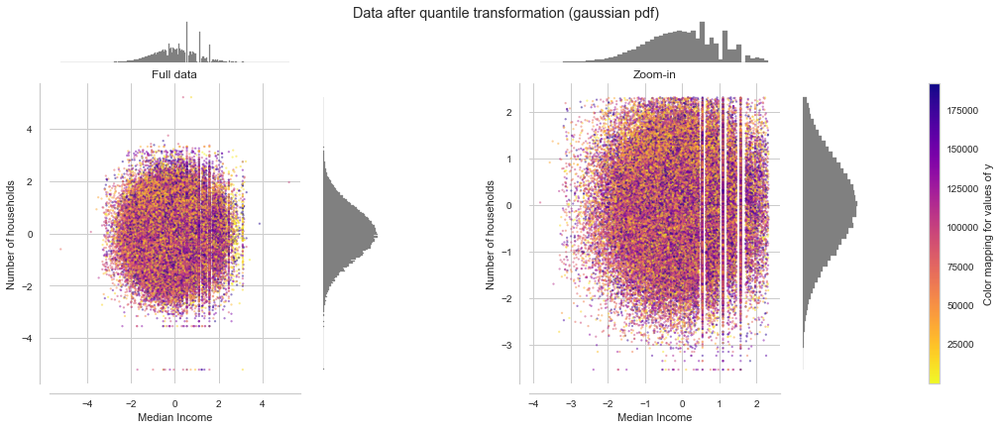

In [46]:
make_plot(5)

In [47]:
#from sklearn.preprocessing import MinMaxScaler   #fazer com o outro  ROBUSTSCALER E DEPOIS OUTLIERS
scaler = QuantileTransformer(output_distribution='normal')
std_data[numeric_data] = pd.DataFrame(scaler.fit_transform(std_data[numeric_data]), columns = numeric_data)
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,0.333524,0,-5.199338,-0.003764,-5.199338,-5.199338,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,95515,5.199338,-0.873515,0.0,0.0,1.0,0.0,0.0,0.0
1,-0.941700,1,1.340200,1.171890,0.651824,1.593219,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0.516356,0.819656,0.240671,-0.161281,0.468203,-5.199338,1.004131,1.456896,0.317650,1.505747,-0.461215,1.562721,-0.189310,-0.823172,-1.307063,-1.095556,-5.199338,-0.143512,-0.207223,0.018820,-0.257495,-1.197193,-0.2

In [48]:
std_data.set_index(['CONTROLN'],inplace=True) #unique number 

#meter no df_ depois dos outliers tambem
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.333524,0,-5.199338,-0.003764,-5.199338,-5.199338,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,5.199338,-0.873515,0.0,0.0,1.0,0.0,0.0,0.0
148535,-0.941700,1,1.340200,1.171890,0.651824,1.593219,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0

In [49]:
std_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92900 entries, 95515 to 185114
Data columns (total 210 columns):
AGE             92900 non-null float64
HOMEOWNR        92900 non-null int64
NUMCHLD         92900 non-null float64
INCOME          92900 non-null float64
GENDER          92900 non-null float64
HIT             92900 non-null float64
MAJOR           92900 non-null int64
COLLECT1        92900 non-null int64
VETERANS        92900 non-null int64
BIBLE           92900 non-null int64
CATLG           92900 non-null int64
HOMEE           92900 non-null int64
PETS            92900 non-null int64
CDPLAY          92900 non-null int64
STEREO          92900 non-null int64
PCOWNERS        92900 non-null int64
PHOTO           92900 non-null int64
CRAFTS          92900 non-null int64
FISHER          92900 non-null int64
GARDENIN        92900 non-null int64
BOATS           92900 non-null int64
WALKER          92900 non-null int64
KIDSTUFF        92900 non-null int64
CARDS           92900 no

In [50]:
std_data.shape[0]/data.shape[0] 

0.9736720747914308

In [51]:
std_data.describe(include='all')

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
count,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.00000,92900.000000,92900.000000,92900.000000
mean,0.021206,0.554241,-4.3049

<a class="anchor" id="out_remove">
    
<font size="6"><span style='color: LightSkyBlue'> **2.9. Outlier Removal**  </span></font>
    
</a>



In [52]:
bools,numeric_data,categorical_data = update_dtypes(std_data)

std_data[numeric_data]

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.333524,-5.199338,-0.003764,-5.199338,-5.199338,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,5.199338,-0.873515
148535,-0.941700,1.340200,1.171890,0.651824,1.593219,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0.516356,0.819656,0.240671,-0.161281,0.468203,-5.199338,1.004131,1.456896,0.317650,1.505747,-0.461215,1.562721,-0.189310,-0.823172,-1.307063,-1.095556,-5.199338,-0.143512,-0.207223,0.018820,-0.257495,-1.197193,-0.205941,1.228607,0.273089,0.979511,-0.134645,0.154930,1.371657,0.624145,-0.064027,1.164444,-1.132898,-0.134645,-0.506348,-0.582009,1.4

<a class="anchor" id="out_iqr">
    
<font size="4"><span style='color: PowderBlue'> **2.9.1 IQR**  </span></font>
    
</a>


In [53]:
df_outliers2 = std_data[numeric_data].copy()

q25 = df_outliers2.quantile(.25)
q75 = df_outliers2.quantile(.75)
iqr = (q75 - q25) * 2.5

upper_lim = q75 + 7 * iqr
lower_lim = q25 - 7 * iqr

filters = []
for metric in std_data[numeric_data]:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(df_outliers2[metric].between(llim, ulim, inclusive=True))

df_outliers3 = df_outliers2[np.all(filters, 0)]
print('Percentage of data kept after removing outliers:', np.round(df_outliers3.shape[0] / data.shape[0], 4))

#too much data lost

Percentage of data kept after removing outliers: 0.1855


<a class="anchor" id="z_scores">
    
<font size="4"><span style='color: PowderBlue'> **2.9.2. Z-scores**  </span></font>
    
</a>


In [54]:
z_scores = stats.zscore(df_outliers2)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 4.7).all(axis=1)
new_df = df_outliers2[filtered_entries]

print('Percentage of data kept after removing outliers:', np.round(new_df.shape[0] / data.shape[0], 4))

new_df

Percentage of data kept after removing outliers: 0.9022


,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.333524,-5.199338,-0.003764,-5.199338,-5.199338,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,5.199338,-0.873515
148535,-0.941700,1.340200,1.171890,0.651824,1.593219,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0.516356,0.819656,0.240671,-0.161281,0.468203,-5.199338,1.004131,1.456896,0.317650,1.505747,-0.461215,1.562721,-0.189310,-0.823172,-1.307063,-1.095556,-5.199338,-0.143512,-0.207223,0.018820,-0.257495,-1.197193,-0.205941,1.228607,0.273089,0.979511,-0.134645,0.154930,1.371657,0.624145,-0.064027,1.164444,-1.132898,-0.134645,-0.506348,-0.582009,1.4

In [55]:
df_outliers2[filtered_entries == False]

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
190166,-0.012546,-5.199338,-0.003764,5.199338,-5.199338,0.214920,-0.273089,-5.199338,0.734798,-0.067799,-0.203379,-5.199338,-5.199338,-1.132898,0.734798,-0.716839,0.045180,-0.546700,-0.003764,1.865852,0.548158,0.297918,-0.700711,-0.334851,0.336178,1.798663,-0.580524,-0.589456,-1.169401,-0.901416,0.008782,-5.199338,-5.199338,-5.199338,-5.199338,0.157469,1.210137,1.629992,0.914679,-0.458426,-0.514923,0.234219,-0.523537,0.653377,-5.199338,-0.610484,0.293986,-0.066541,-0.370902,-5.199338,-0.312376,0.100535,0.721714,-5.199338,1.212751,0.098868,0.325577,-0.392492,0.628724,-0.633317,-5.199338,2.687115,1.902873,-0.797044,-5.199338,-5.199338,-0.691121,-5.199338,0.109365,-0.037646,0.270485,1.374878,-0.802226,0.322932,-0.161281,0.396560,0.023839,0.175278,0.074087,0.317650,1.368450,0.337506,-5.199338,1.349498,0.041413,-0.055229,-0.734798,-0.202098,-0.963423,-0.207223,0.995858,-0.754664,0.071571,0.301855,-0.012546,1.934489,-0.279606,-0.134645,0.154930,-5.199338,0.388430,-0.348150,-0.241963,0.882739,1.244778,-0.116941,-0.071571,-0.271787,-0.144780,0.455640,-0.641002,0.459820,0.903301,0.305796,-0.415634,-0.312376,0.148584,0.662724,-1.171890,0.868016,-1.154615,0.027604,0.545244,1.166919,-0.945616,-0.212353,0.658043,1.140077,0.642543,0.304482,0.369558,0.265284,-5.199338,-5.199338,0.497809,1.571286,-5.199338,1.192071,-5.199338,-5.199338,-5.199338,-5.199338,1.798663,-1.716415,0.015055,-5.199338,1.464186,0.333524,0.802226,-0.028859,-2.183092,2.673318,5.199338,-5.199338,-5.199338,-5.199338,5.199338,-5.199338,-5.199338,-5.199338,5.199338,5.199338,5.199338,0.058999,-0.358833,0.520661,1.880352,2.877846,-2.289988,-2.806711,0.035135,-0.504922,1.902873,-0.120731,1.362078,0.057742,1.571286,1.280981,-0.504922,-1.384628,1.773922,-5.199338,5.199338
190313,-0.012546,-5.199338,-0.003764,0.651824,-5.199338,0.103057,5.199338,-5.199338,-5.199338,-0.067799,0.070314,-5.199338,-5.199338,-0.543789,-0.965420,-1.002056,1.494155,1.926403,0.280911,-1.541796,0.548158,1.545927,-0.419741,-0.334851,-1.231280,-1.588771,1.016672,-1.509656,-2.289988,-0.901416,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-2.063775,-0.519225,-0.223916,2.408550,-2.432017,-0.514923,-0.880888,-1.858747,-1.606755,0.720087,-5.199338,1.767903,2.074445,-0.370902,-5.199338,-1.312981,-5.199338,-5.199338,-5.199338,5.199338,0.846345,-1.994971,-5.199338,1.255743,-0.864365,-1.494155,1.250242,1.404533,-0.608973,-5.199338,-0.731515,-0.218773,0.205941,2.511791,2.273052,2.119668,0.437620,2.806711,1.012474,0.156199,0.748009,-5.199338,1.959536,1.355761,0.317650,-0.425228,-0.675277,-5.199338,0.429351,-0.162552,-1.307063,-1.095556,-0.955471,-5.199338,-5.199338,-1.258508,0.839121,0.432104,-0.205941,-0.012546,-1.700222,0.412900,1.174387,-5.199338,1.048748,0.624145,0.198258,0.800496,0.096753,0.414267,-0.939747,0.903301,-0

<a class="anchor" id="out_pca">
    
<font size="4"><span style='color: PowderBlue '> **2.9.3. Using PCA**  </span></font>
    
</a>


In [56]:
df_pca1 = std_data[numeric_data].copy()
df_pca1

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.333524,-5.199338,-0.003764,-5.199338,-5.199338,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,5.199338,-0.873515
148535,-0.941700,1.340200,1.171890,0.651824,1.593219,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0.516356,0.819656,0.240671,-0.161281,0.468203,-5.199338,1.004131,1.456896,0.317650,1.505747,-0.461215,1.562721,-0.189310,-0.823172,-1.307063,-1.095556,-5.199338,-0.143512,-0.207223,0.018820,-0.257495,-1.197193,-0.205941,1.228607,0.273089,0.979511,-0.134645,0.154930,1.371657,0.624145,-0.064027,1.164444,-1.132898,-0.134645,-0.506348,-0.582009,1.4

In [57]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca1)
pca_feat  

array([[ 5.45794723e+00, -2.47421751e+00,  3.55908751e+00, ...,
        -2.24523333e-01,  1.83892903e-01,  6.39310152e-02],
       [-1.44323033e+01, -1.40267338e+01,  1.36302084e+00, ...,
        -3.60319139e-02, -1.41610351e-01,  3.10374328e-01],
       [ 1.67445163e+01,  2.93916772e+00,  2.29083517e-01, ...,
        -5.75357557e-02, -1.44031895e-01,  5.46269790e-02],
       ...,
       [-7.91814454e+00,  6.49102514e+00,  7.66014492e+00, ...,
         4.37317179e-01, -2.67052574e-03,  5.72564476e-02],
       [-1.20500798e+01, -5.56844706e+00, -6.07608402e-01, ...,
        -4.47216261e-01,  1.80749788e-01,  2.03066044e-01],
       [-2.96520550e+00, -1.18055481e+01, -1.24883769e+00, ...,
         1.75969795e-01, -1.40138752e-01,  6.83164104e-02]])

In [58]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,94.981234,0.000000,0.140954,0.140954
2,45.088233,-49.893002,0.066912,0.207866
3,32.458846,-12.629386,0.048170,0.256036
4,24.952313,-7.506533,0.037030,0.293066
5,18.262075,-6.690238,0.027101,0.320167
6,16.083803,-2.178272,0.023869,0.344036
7,14.972961,-1.110842,0.022220,0.366256
8,14.737623,-0.235338,0.021871,0.388127
9,13.978420,-0.759204,0.020744,0.408872
10,11.724209,-2.254211,0.017399,0.426271


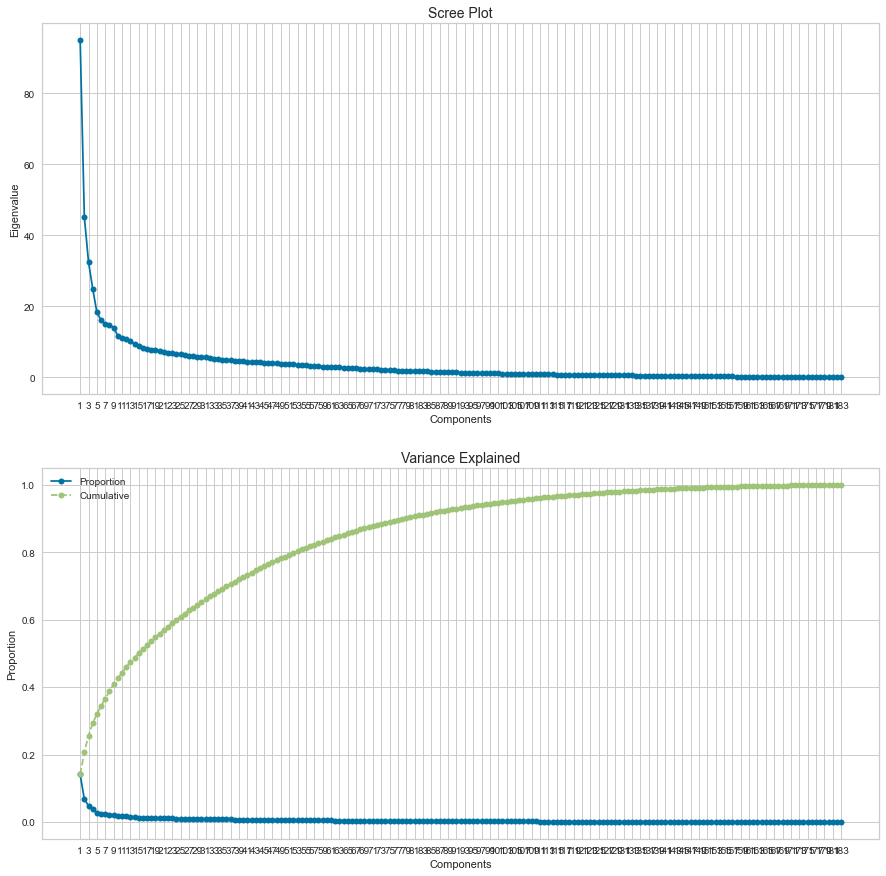

In [58]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()


In [59]:
pca = PCA(n_components=12)
pca_feat = pca.fit_transform(df_pca1)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca1.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,5.457947,-2.474213,3.558967,4.332667,-6.877819,-6.816322,-5.497928,1.095343,-3.618093,2.271883,-1.943945,1.543788
148535,-14.432303,-14.026737,1.363144,-5.692737,2.205518,-2.375839,-3.560998,7.711142,-3.386677,-1.814075,1.989944,-4.136371
15078,16.744516,2.939165,0.229172,2.687938,-5.964395,-0.587682,-6.187013,-0.424417,-1.417128,0.276610,3.414887,3.083461
172556,10.159836,7.085941,4.416240,2.098123,-1.904131,-0.410247,-2.670465,17.505170,1.490053,-4.082731,-2.561603,4.541229
7112,-1.724430,4.262398,8.564939,-7.014607,-2.720168,2.754594,-2.266742,-1.010899,-4.798795,2.501641,-3.802860,-5.907183
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-1.943427,1.725499,-10.155934,-5.872899,3.512680,-1.653290,6.512139,-5.765329,5.049792,1.980196,2.735552,0.995513
122706,2.033782,-9.610097,0.925616,-4.369977,4.048543,-1.954751,-1.089394,-2.242588,-0.109091,-2.329700,2.749095,2.488712
189641,-7.918145,6.491025,7.660067,-3.405265,-4.105840,-2.141485,0.458864,-0.782773,1.751693,0.299044,3.556246,1.962960


In [60]:
# Reassigning df to contain pca variables
df_pca1 = pd.concat([df_pca1, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca1.head()

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.333524,-5.199338,-0.003764,-5.199338,-5.199338,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,5.199338,-0.873515,5.457947,-2.474213,3.558967,4.332667,-6.877819,-6.816322,-5.497928,1.095343,-3.618093,2.271883,-1.943945,1.543788
148535,-0.941700,1.340200,1.171890,0.651824,1.593219,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0.516356,0.819656,0.240671,-0.161281,0.468203,-5.199338,1.004131,1.456896,0.317650,1.505747,-0.461215,1.562721,-0.189310,-0.823172,-1.307063,-1.095556,-5.199338,-0.143512

In [61]:
metric_features = numeric_data

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca1[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
AGE,-0.00796687,0.0530272,-0.00199597,0.168224,-0.0582274,0.0227201,0.0271352,0.0450275,0.0113024,0.0520304,0.0229258,-0.0780123
NUMCHLD,-0.015698,-0.0516503,0.0894116,-0.114384,-0.0183687,-0.0746304,-0.0357318,-0.0778805,0.00719568,-0.0257287,-0.0469443,0.0288822
INCOME,-0.137163,-0.30536,-0.0637521,-0.0663543,0.105299,-0.0855838,-0.11059,0.0547342,-0.0545958,-0.107275,0.0306966,0.0344271
GENDER,0.014619,-0.0609468,-0.0314274,0.00885682,0.100295,0.00349093,0.00417047,0.0356106,0.00883104,0.0502387,0.982301,-0.0723
HIT,-0.160953,-0.0611734,0.162375,0.0963137,-0.0742752,-0.121308,0.00360753,-0.145142,0.0777564,-0.0132291,-0.0635639,-0.0431841
POP903,0.163727,-0.00822378,-0.640074,-0.184756,-0.0724675,0.0400914,-0.214494,-0.20357,-0.0932151,0.0353381,-0.00053317,-0.160485
POP90C1,-0.881138,0.0824169,-0.0277603,-0.166714,-0.0438779,0.259397,0.0580991,-0.111028,-0.0629346,0.163421,0.00454555,0.0851903
POP90C2,0.339798,0.17671,0.00579351,0.305875,0.014733,-0.598768,-0.247409,0.0488061,0.270722,-0.161615,0.0070947,-0.22569
POP90C3,0.862679,-0.232494,-0.00873523,-0.032151,0.0391706,0.0964436,0.0817979,0.0839404,-0.125572,-0.0800602,-0.00936933,0.0515827
POP90C5,-0.18502,0.232804,0.0459783,0.387843,-0.00783485,0.04194,-0.168,-0.130597,-0.0238632,0.0730919,-0.0489595,-0.179334


In [62]:
df = df_pca1.copy()
df_pca2 = pd.concat([df_pca1, std_data[categorical_data]], axis=1)   
df_pca2

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.333524,-5.199338,-0.003764,-5.199338,-5.199338,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,5.199338,-0.873515,5.457947,-2.474213,3.558967,4.332667,-6.877819,-6.816322,-5.497928,1.095343,-3.618093,2.271883,-1.943945,1.543788
148535,-0.941700,1.340200,1.171890,0.651824,1.593219,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0.516356,0.819656,0.240671,-0.161281,0.468203,-5.199338,1.004131,1.456896,0.317650,1.505747,-0.461215,1.562721,-0.189310,-0.823172,-1.307063,-1.095556,-5.199338,-0.143512

In [64]:
pc_features = df_pca2.columns[df_pca2.columns.str.startswith('PC')]#.drop(['PCOWNERS'])
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,5.457947,-2.474213,3.558967,4.332667,-6.877819,-6.816322,-5.497928,1.095343,-3.618093,2.271883,-1.943945,1.543788
148535,-14.432303,-14.026737,1.363144,-5.692737,2.205518,-2.375839,-3.560998,7.711142,-3.386677,-1.814075,1.989944,-4.136371
15078,16.744516,2.939165,0.229172,2.687938,-5.964395,-0.587682,-6.187013,-0.424417,-1.417128,0.276610,3.414887,3.083461
172556,10.159836,7.085941,4.416240,2.098123,-1.904131,-0.410247,-2.670465,17.505170,1.490053,-4.082731,-2.561603,4.541229
7112,-1.724430,4.262398,8.564939,-7.014607,-2.720168,2.754594,-2.266742,-1.010899,-4.798795,2.501641,-3.802860,-5.907183
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-1.943427,1.725499,-10.155934,-5.872899,3.512680,-1.653290,6.512139,-5.765329,5.049792,1.980196,2.735552,0.995513
122706,2.033782,-9.610097,0.925616,-4.369977,4.048543,-1.954751,-1.089394,-2.242588,-0.109091,-2.329700,2.749095,2.488712
189641,-7.918145,6.491025,7.660067,-3.405265,-4.105840,-2.141485,0.458864,-0.782773,1.751693,0.299044,3.556246,1.962960


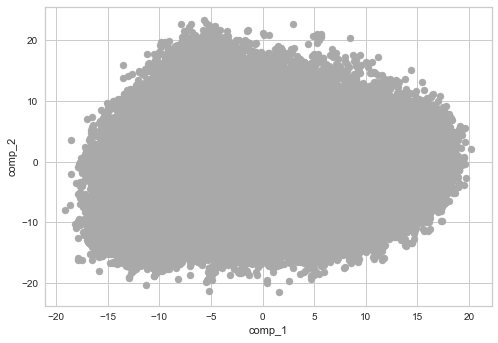

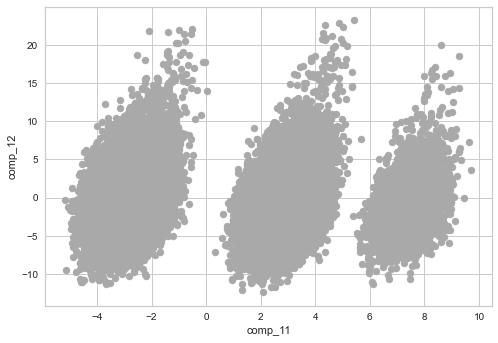

In [65]:
df9 = pd.DataFrame(pca_feat, columns=['comp_'+str(j+1) for j in range(12)])
first_two = df9.plot(kind='scatter', x='comp_1', y='comp_2', c='DarkGrey', s=50)
last_two = df9.plot(kind='scatter', x='comp_11', y='comp_12', c='DarkGrey', s=50)

Not used, 12x12


In [67]:
#outlying = (pca_feat[:,-1] < 1.4) & (pca_feat[:,-4] < 1.3)
#df[outlying]

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
148535,-0.941700,1.340200,1.171890,0.651824,1.593219,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0.516356,0.819656,0.240671,-0.161281,0.468203,-5.199338,1.004131,1.456896,0.317650,1.505747,-0.461215,1.562721,-0.189310,-0.823172,-1.307063,-1.095556,-5.199338,-0.143512,-0.207223,0.018820,-0.257495,-1.197193,-0.205941,1.228607,0.273089,0.979511,-0.134645,0.154930,1.371657,0.624145,-0.064027,1.164444,-1.132898,-0.134645,-0.506348,-0.582009,1.411293,-0.243255,-0.124523,-0.231641,-1.031509,-1.639539,0.013801,0.203379,1.381364,1.513589,2.156675,0.244548,1.428482,1.199766,1.029375,-1.700222,-5.199338,1.611333,-0.935852,-1.428482,-5.199338,-5.199338,-0.846279,-5.199338,-1.149742,1.407905,1.391202,-0.908975,0.832006,0.705530,0.313694,-5.199338,1.851734,-5.199338,-5.199338,-5.199338,-0.832006,0.832006,2.365248,2.053336,5.199338,2.144011,2.575483,-0.270485,0.421111,1.236652,-5.199338,1.460531,-5.199338,-1.037937,-5.199338,-5.199338,-5.199338,5.199338,5.199338,5.199338,2.325972,1.634747,0.113152,-0.267884,-5.199338,0.516356,0.393847,-0.512061,-1.059682,0.664287,-0.051460,0.912774,-0.738089,1.118711,0.002509,-1.081940,1.521525,0.694311,0.275694,5.199338,-14.432303,-14.026737,1.363144,-5.692737,2.205518,-2.375839,-3.560998,7.711142,-3.386677,-1.814075,1.989944,-4.136371
7112,1.176890,1.340200,-0.592444,-5.199338,3.043713,0.292676,5.199338,-5.199338,-5.199338,1.057485,-2.408550,-5.199338,-5.199338,1.040090,0.490721,0.630254,-0.124523,-1.525529,0.280911,1.865852,-0.805692,-0.472407,0.553999,-0.334851,1.149742,-1.212751,1.942703,1.337127,0.584984,1.236652,1.384628,-5.199338,-5.199338,-5.199338,-5.199338,-1.088723,-0.851675,-5.199338,-0.743040,-1.050924,1.247505,1.831224,-0.778225,-1.606755,-5.199338,-0.144780,-0.120731,0.930036,1.554270,-5.199338,-0.148584,-5.199338,-5.199338,-5.199338,-0.144780,-0.982129,0.716839,0.644086,-2.043115,0.602943,2.273052,-0.959440,-0.579039,1.343287,0.266584,0.101796,-0.691121,0.700711,-1.349498,0.877196,-0.280911,0.967422,-0.589456,-0.414267,1.159515,-1.142483,0.751333,0.513491,-0.592444,-0.613509,-1.355761,-0.040157,1.968165,2.131682,1.710968,-0.400635,-5.199338,1.014571,-0.543789,

In [66]:
df

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.333524,-5.199338,-0.003764,-5.199338,-5.199338,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,5.199338,-0.873515,5.457947,-2.474213,3.558967,4.332667,-6.877819,-6.816322,-5.497928,1.095343,-3.618093,2.271883,-1.943945,1.543788
148535,-0.941700,1.340200,1.171890,0.651824,1.593219,0.537014,5.199338,-5.199338,-5.199338,-0.565738,-1.159515,-5.199338,1.761948,1.780005,-0.018820,0.387078,-1.244778,1.817968,1.902873,-0.519225,-1.401177,-0.077862,1.197193,0.571638,0.020074,-1.831224,1.497997,-1.873053,-1.169401,0.408805,5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-1.837975,-0.851675,0.346817,2.408550,-1.798663,-0.514923,-0.880888,-1.858747,-0.880888,2.432017,-5.199338,1.844811,2.325972,0.689529,-5.199338,-1.070745,-5.199338,-5.199338,-5.199338,0.500651,1.913835,-1.851734,-0.726606,1.312981,-0.864365,-0.552537,-0.075345,0.146048,0.276998,-5.199338,-5.199338,1.079690,-5.199338,-1.100140,0.877196,1.295363,0.516356,0.819656,0.240671,-0.161281,0.468203,-5.199338,1.004131,1.456896,0.317650,1.505747,-0.461215,1.562721,-0.189310,-0.823172,-1.307063,-1.095556,-5.199338,-0.143512

<a class="anchor" id="out_dbscan">
    
<font size="4"><span style='color: PowderBlue '> **2.9.4. DBSCAN**  </span></font>
    
</a>


In [68]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=7.3, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_pca2[pc_features])
Counter(dbscan_labels)


#5618 com 6
#3634 com 7
#3225 com 7.3

Counter({-1: 17852, 0: 75009, 1: 29, 2: 10})

In [69]:
(92900-4645)/data.shape[0]

0.9249884710518593

In [70]:
df_pca2[dbscan_labels==-1]

,AGE,NUMCHLD,INCOME,GENDER,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.333524,-5.199338,-0.003764,-5.199338,-5.199338,-0.924252,-5.199338,0.997920,0.731515,0.743040,-0.121995,-5.199338,-5.199338,0.771450,1.371657,-0.147316,-1.244778,-0.546700,0.805692,0.330873,-1.114032,-1.780005,0.553999,1.446104,0.905189,-0.087933,0.412900,-0.882739,1.144896,-0.434861,1.097845,0.336178,1.479004,1.664082,-5.199338,-0.726606,-0.519225,0.198258,0.661162,0.235509,0.451469,-0.084155,-0.778225,-0.333524,-5.199338,-0.610484,0.839121,0.464007,-0.370902,-5.199338,0.576075,-0.429351,-5.199338,-5.199338,-0.466803,-0.179810,0.165095,-0.119468,0.457033,-1.513589,0.065284,-1.212751,1.244778,-0.797044,-5.199338,-5.199338,0.564267,0.205941,0.109365,-0.920412,-0.645631,-0.916587,-0.659602,-0.805692,-0.316330,0.181652,-5.199338,-0.589456,-1.733071,1.629992,0.209787,-1.318946,-5.199338,0.947580,-0.162552,0.653377,1.727466,0.436240,0.226489,0.530745,-0.920412,1.968165,-1.197193,-5.199338,0.961429,-0.734798,-0.025094,0.248427,-5.199338,1.371657,0.388430,-0.939747,-1.644369,-0.270485,0.869846,-0.506348,-0.582009,-0.025094,0.751333,-1.233962,0.983573,-0.269184,1.012474,0.013801,0.493553,-1.244778,-0.571638,0.662724,-0.411534,0.868016,0.218773,-0.634851,0.839121,-5.199338,0.303168,0.668987,-0.949547,0.699108,0.642543,-0.234219,-5.199338,1.494155,-5.199338,-5.199338,0.184203,-0.072829,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,1.236652,-5.199338,0.613509,0.912774,-5.199338,0.568686,0.113152,0.871679,-0.028859,1.394512,1.035790,-0.089192,0.399276,0.893908,-5.199338,-0.485069,-5.199338,-5.199338,1.337127,-0.749670,5.199338,5.199338,-0.654930,-0.358833,1.453280,0.447305,-5.199338,0.516356,0.961429,1.497997,1.629992,-0.085414,0.257495,-0.819656,0.855287,-0.802226,0.002509,0.602943,-0.676854,-0.825479,5.199338,-0.873515,5.457947,-2.474213,3.558967,4.332667,-6.877819,-6.816322,-5.497928,1.095343,-3.618093,2.271883,-1.943945,1.543788
172556,0.684763,-5.199338,-5.199338,-5.199338,0.512061,-1.634747,-5.199338,0.910873,0.844485,-2.013671,-1.292465,-5.199338,1.761948,-0.953493,-0.266584,0.844485,0.487893,-0.774833,0.805692,0.032625,0.933910,0.297918,-0.700711,-1.533612,1.149742,-1.077446,1.371657,-0.311059,-0.139710,0.275694,0.513491,0.592444,0.895780,-5.199338,1.597698,1.053106,0.146048,0.111890,-0.036391,0.235509,1.247505,-0.880888,1.192071,0.074087,1.123415,1.456896,-0.558392,0.464007,0.689529,0.500651,2.611712,0.275694,-5.199338,1.247505,-1.414698,0.224025,-0.297918,1.337127,-1.010382,1.064091,0.065284,-1.212751,-1.571286,2.575483,-5.199338,0.842694,-5.199338,-5.199338,0.303168,-1.109378,-5.199338,-0.999986,-0.365531,-0.731515,-1.873053,-1.142483,1.606755,0.513491,-1.733071,-5.199338,-1.355761,-1.902873,-5.199338,-5.199338,0.589456,0.120731,-5.199338,-5.199338,-5.199338,2.8

<a class="anchor" id="out_lof">
    
<font size="4"><span style='color: PowderBlue '> **2.9.5. Local Outlier Factor**  </span></font>
    
</a>

In [71]:
lof = LocalOutlierFactor(n_neighbors=20, contamination=.05)
lof_labels = lof.fit_predict(df_pca2[pc_features])
Counter(lof_labels)

Counter({1: 88255, -1: 4645})

In [72]:
outliers = df_pca2[lof_labels==-1].merge(df_pca2[dbscan_labels==-1], on='CONTROLN')
outliers_ = outliers.merge(df_pca2[filtered_entries == False], on='CONTROLN')
outliers_.index

Int64Index([190166, 137726,  35239,  54795,  87813, 183367,  42329,  29968,
              3583, 158174,
            ...
             67865,  80493,   6176, 159707, 115016, 108257,   6569,   6648,
            151446,  98019],
           dtype='int64', name='CONTROLN', length=769)

In [73]:
(92900-len(outliers_.index))/data.shape[0]  #percentage of data prevailed after taking outliers

0.9656122919548904

In [74]:
#save the outliers in the dataframe

df_outliers = df_.loc[outliers_.index.to_list(),:]
df_outliers   

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
190166,NaN,0,0.0,NaN,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,706,34,0,66,51,91,0,0,34,24,9,22,18,14,20,18,17,30,19,16,49,2,8,3,17,72,0,0,0,0,27,18,65,73,11,1,6,10,6,0,1,56,14,4,0,8,3,16,0,98,14378,30,3,54,4,0,61,92,8,0,0,1,0,13,19,5,80,62,58,64,56,4,14,12,4,20,17,0,4,10,11,2,3,1,1,10,9,4,3,4,30,5,4,3,0,9,6,5,7,12,3,2,6,70,7,3,16,38,23,5,9,6,5,14,3,10,6,36,3,18,16,43,22,1,6,1,10,0,0,6,6,0,3,0,0,0,0,1,17,2,0,9,97,76,19,1,43,99,0,0,0,99,0,0,0,99,99,99,8,2,7,13,395.0,2,4,80.0,2,25.0,1491.0,30.0,944.0,30.0,944.0,1491.0,2.0,26.666667,1,3,0.0,1.0,0.0,0.0,0.0,0.0
137726,NaN,0,0.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,860,99,0,0,29,54,1,0,41,18,61,26,11,1,0,10,11,24,11,44,13,10,6,0,59,5,29,64,1,63,99,2,0,86,64,2,8,2,0,0,0,56,23,7,0,34,51,14,0,63,8380,4,2,31,9,6,86,23,12,8,53,3,4,1,12,1,35,97,76,52,40,5,17,8,7,13,18,0,1,23,4,2,0,2,1,2,3,1,3,0,22,6,2,6,8,20,11,4,10,3,7,37,0,51,3,1,4,23,41,14,12,6,2,22,1,12,10,4,8,20,0,0,80,1,2,1,9,0,0,5,1,0,1,0,0,0,0,0,9,7,2,3,96,59,10,1,0,0,0,71,1,27,1,1,0,99,99,96,0,0,0,0,333.0,5,11,23.0,1,23.0,730.0,23.0,730.0,23.0,730.0,NaN,NaN,23.000000,1,2,0.0,0.0,0.0,0.0,1.0,0.0
35239,44.0,0,2.0,5.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,82,99,0,0,53,95,0,0,34,19,14,23,18,13,11,14,20,31,11,24,27,2,14,11,29,76,2,0,0,0,34,5,0,43,24,2,7,18,7,0,2,57,13,4,0,17,10,7,0,93,19961,30,0,51,0,66,22,85,15,0,0,0,0,0,20,0,89,55,85,99,99,0,15,0,0,0,63,0,0,11,0,0,10,0,0,10,0,0,9,0,11,33,0,0,0,0,26,0,10,15,0,22,0,63,0,9,15,23,15,15,23,0,8,14,8,0,14,77,0,60,60,59,0,0,0,0,12,0,7,27,0,0,0,0,0,0,0,0,27,22,0,0,99,49,8,8,0,39,47,0,0,90,10,0,0,11,99,99,5,2,14,0,333.0,6,14,41.0,4,3.0,761.0,6.0,1005.0,6.0,761.0,1126.0,6.0,4.555556,4,0,0.0,1.0,0.0,0.0,0.0,0.0
54795,37.0,1,0.0,4.0,0,1,0,1,0,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,1,132,0,66,34,54,89,0,0,37,23,8,15,11,11,23,17,16,34,21,12,39,2,11,15,13,85,1,0,0,0,17,6,0,59,13,2,4,12,2,0,1,55,13,4,11,16,0,0,1,48,12993,42,20,11,9,70,0,88,12,0,0,0,0,0,12,0,24,43,29,29,15,0,11,0,0,31,0,0,0,0,0,28,23,8,0,9,35,14,0,6,25,0,0,0,0,11,0,0,0,9,0,0,0,91,0,22,18,44,11,4,0,0,4,17,4,13,4,42,0,19,24,41,0,0,3,0,6,0,0,20,0,0,0,0,0,3,0,2,79,0,0,2,76,46,6,10,0,15,57,87,0,0,0,7,7,93,99,87,5,2,11,22,333.0,6,11,55.0,7,3.0,1460.0,7.0,975.0,6.0,822.0,1370.0,3.0,5.500000,4,0,0.0,0.0,0.0,0.0,1.0,0.0
87813,NaN,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,99,0,0,39,99,0,0,0,33,8,36,12,8,12,33,33,0,33,1,40,0,15,4,50,99,0,18,0,18,30,9,0,40,46,0,0,30,20,0,0,66,14,3,0,30,0,0,0,67,16584,0,0,99,0,99,0,55,0,0,27,18,0,0,5,33,0,99,71,99,99,0,0,27,0,0,0,0,0,45,27,0,0,0,0,0,0,0,0,27,2


<a>
    
<font size="4"><span style='color: PowderBlue '> **Remove the outliers on standardized dataset**  </span></font>
    
</a>


In [75]:
df_.drop(outliers_.index, axis=0,inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3

In [76]:
df_.to_csv('sem_outliers.csv')

<hr>
<a class="anchor" id="quebra">
    
<font size="8"><span style='color: RED'> **QUEBRA**  </span></font>
    
</a>


In [45]:
#correr isto para importar o df sem outliers 
df_ = pd.read_csv('sem_outliers.csv')

In [46]:
df_.set_index('CONTROLN', inplace=True)

In [77]:
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3

<hr>
<a class="anchor" id="categ_div">
    
<font size="8"><span style='color: DarkTurquoise '> **3. Division of Features by Category**  </span></font>
    
</a>


In [78]:
df_.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92131 entries, 95515 to 185114
Data columns (total 210 columns):
AGE             float64
HOMEOWNR        int64
NUMCHLD         float64
INCOME          float64
GENDER          int64
HIT             int64
MAJOR           int64
COLLECT1        int64
VETERANS        int64
BIBLE           int64
CATLG           int64
HOMEE           int64
PETS            int64
CDPLAY          int64
STEREO          int64
PCOWNERS        int64
PHOTO           int64
CRAFTS          int64
FISHER          int64
GARDENIN        int64
BOATS           int64
WALKER          int64
KIDSTUFF        int64
CARDS           int64
PLATES          int64
PEPSTRFL        int64
POP903          int64
POP90C1         int64
POP90C2         int64
POP90C3         int64
POP90C5         int64
ETH1            int64
ETH3            int64
ETH7            int64
CHIL2           int64
CHIL3           int64
AGEC1           int64
AGEC2           int64
AGEC3           int64
AGEC4           int64

#demographic: 'AGE', 'NUMCHLD', 'STATE', 'HOMEOWNR', 'GENDER', 'INCOME', 'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX'


#summary:  'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR'


#census: 'POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 'ETH11', 'ETH16', 'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2'    

-PCA?


#interests:  'HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'PEPSTRFL'

In [79]:
demographic = ['AGE', 'NUMCHLD', 'HOMEOWNR', 'GENDER', 'INCOME', 
              'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX']


summary = [ 'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 
           'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 
           'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR','PEPSTRFL']


census = ['POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 
          'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 
          'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 
          'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 
          'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 
          'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 
          'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 
          'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 
          'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 
          'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 
          'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 
          'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 
          'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2']    




interests = ['HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS',
             'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES']


df_dem = df_[demographic].copy()
df_sum = df_[summary].copy()
df_cen = df_[census].copy()
df_int = df_[interests].copy()

<a class="anchor" id="add_transform">
    
<font size="6"><span style='color: LightSkyBlue'> **3.1. Additional Tranformations**  </span></font>
    
</a>


In [80]:
imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_dem[df_dem.columns])
df_dem[df_dem.columns] = df_complete

In [81]:
#arrendondar unidade
to_round = ['AGE', 'NUMCHLD', 'INCOME']

df_dem[to_round] = df_dem[to_round].apply(np.ceil).astype(int)

#, 'NEXTDATE', 'TIMELAG'

In [82]:
df_complete1 = imp_mean.fit_transform(df_sum[df_sum.columns])
df_sum[df_sum.columns] = df_complete1

In [83]:
#arrendondar unidade
to_round1 = ['NEXTDATE', 'TIMELAG']

df_sum[to_round1] = df_sum[to_round1].apply(np.ceil).astype(int)

In [84]:
#desvio padrão

sd =[] 
for col in df_cen:
    sd.append(np.std(df_cen[col]))
sd = pd.DataFrame(sd, index=df_cen.columns).sort_values([0] , ascending=False)
df_cen = df_cen[sd[sd[0]>10].index]

#only those that have a standard deviation of more than 10 are kept

<a class="anchor" id="data_scaling2">
    
<font size="6"><span style='color: LightSkyBlue'> **3.2. Scaling data**  </span></font>
    
</a>


In [85]:
df_dem.reset_index(inplace=True)
dem = df_dem.columns.to_list()
dem.remove('CONTROLN')

df_sum.reset_index(inplace=True)
sum_ = df_sum.columns.to_list()
sum_.remove('CONTROLN')

df_cen.reset_index(inplace=True)
cen = df_cen.columns.to_list()
cen.remove('CONTROLN')

df_int.reset_index(inplace=True)
int_ = df_int.columns.to_list()
int_.remove('CONTROLN')

In [86]:
bools_dem, numeric_data_dem, categorical_data_dem = update_dtypes(df_dem[dem])
scaler = StandardScaler()
df_dem[numeric_data_dem] = pd.DataFrame(scaler.fit_transform(df_dem[numeric_data_dem]), columns = numeric_data_dem)

bools_sum, numeric_data_sum, categorical_data_sum = update_dtypes(df_sum[sum_])
scaler1 = StandardScaler()
df_sum[numeric_data_sum] = pd.DataFrame(scaler1.fit_transform(df_sum[numeric_data_sum]), columns = numeric_data_sum)

bools_cen, numeric_data_cen, categorical_data_cen = update_dtypes(df_cen[cen])
scaler2 = StandardScaler()
df_cen[numeric_data_cen] = pd.DataFrame(scaler2.fit_transform(df_cen[numeric_data_cen]), columns = numeric_data_cen)

bools_int, numeric_data_int, categorical_data_int = update_dtypes(df_int[int_])
scaler3 = StandardScaler()
df_int[numeric_data_int] = pd.DataFrame(scaler3.fit_transform(df_int[numeric_data_int]), columns = numeric_data_int)

In [87]:
df_dem.set_index(['CONTROLN'],inplace=True) #unique number 
df_sum.set_index(['CONTROLN'],inplace=True)
df_cen.set_index(['CONTROLN'],inplace=True)
df_int.set_index(['CONTROLN'],inplace=True)

In [88]:
df_dem = df_dem[numeric_data_dem]
df_dem

,AGE,NUMCHLD,GENDER,INCOME
CONTROLN,,,,
95515,0.063863,-0.360505,-0.863044,-0.480438
148535,-0.961481,1.301924,0.821556,1.319856
15078,0.132219,-0.360505,0.821556,-0.480438
172556,0.679069,-0.360505,-0.863044,-1.680634
7112,1.225919,1.301924,-0.863044,-0.480438
...,...,...,...,...
184568,0.132219,-0.360505,0.821556,-0.480438
122706,-0.824768,1.301924,0.821556,1.919954
189641,-0.004493,-0.360505,0.821556,-0.480438


In [89]:
df_sum = df_sum[numeric_data_sum]
df_sum

,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A
CONTROLN,,,,,,,,,,,,,,,,
95515,-0.057848,0.542138,0.261762,1.180610,1.991466,-0.360991,0.123775,-0.319547,0.447965,-0.554997,-0.095579,0.713837,-0.552026,-0.550258,1.958750,-0.976268
148535,-0.057848,0.542138,0.039294,-0.487959,-0.895769,0.256644,-0.315819,0.206384,-0.628392,0.592903,-0.095579,-0.983859,1.229254,0.234084,0.088856,1.405044
15078,-0.057848,0.542138,0.261762,0.852084,1.991466,-0.731572,0.406519,-0.157722,1.382526,-0.937630,-0.095579,0.434088,0.465848,-0.576036,1.958750,-0.976268
172556,-0.057848,0.542138,0.261762,0.048058,0.436801,-0.731572,1.914143,-0.360003,0.008076,-0.554997,-0.095579,1.491834,0.084145,-0.642247,1.958750,-0.976268
7112,-0.057848,3.847145,2.708910,1.301646,0.658896,-0.608045,-0.315819,-0.198178,-0.678343,-0.172363,-0.353220,3.996782,0.720317,-0.637065,0.088856,0.214388
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-0.057848,-0.284113,-0.183174,-0.678159,-1.117864,2.109548,-1.196041,0.206384,-0.728294,0.592903,-0.610860,-1.248067,0.338614,1.157839,-0.846091,1.405044
122706,-0.057848,-1.936617,-1.073046,-0.721386,-1.117864,1.491913,-1.225966,0.004103,-0.775022,0.210270,-0.851878,-1.160302,0.211380,0.662970,-0.846091,0.214388
189641,-0.057848,1.368390,0.929166,-0.392859,-0.229484,-0.608045,-1.225966,-0.400459,-0.090214,-0.554997,-2.630426,-0.901580,-0.679261,-0.496438,1.023803,-0.976268


In [90]:
df_cen = df_cen[numeric_data_cen]
df_cen

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,HHAS3,LFC7,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,EIC4,AFC5
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352199,-0.424995,-1.247835,0.960233,1.063317,-0.925258,0.681010,0.306077,-0.717640,1.855259,1.104098,-0.372537,-0.182192,0.774132,-0.326142,-0.754884,0.326633,-0.289678,-0.358418,0.893707,-0.622906,-0.937562,0.461931,0.222990,-0.947255,0.179847,0.700300,-0.182967,-0.599137,0.219194,0.076125,-0.480421,-0.740775,-0.575132,0.165373,-0.107967,1.000753,-0.116110,0.443943,0.749331,-0.513089,-0.926411,2.375360,0.745053
148535,2.413624,-0.111176,0.844133,-0.658082,1.232556,0.754811,-0.437976,-1.171080,-0.932623,-0.571749,1.260389,1.388938,0.720689,-0.879682,-0.230878,-1.240352,-0.952359,-0.865989,4.836975,1.731449,-0.622906,-1.357061,1.366792,0.464392,0.629881,-0.474091,1.879593,-0.050518,-0.599137,1.702188,-1.543700,0.784462,0.275649,-0.575132,0.082164,-1.041794,0.284998,3.069983,-1.086004,-0.111822,-0.513089,-0.329196,-0.411949,-1.654202
15078,-0.507399,0.676199,-1.247835,1.781840,-1.475271,-1.580200,-0.374034,-0.175605,0.178120,2.303322,0.088208,0.004922,-1.429027,1.246650,0.197810,-0.366509,0.531271,0.129458,-0.358418,0.223513,-0.453088,-0.098564,-0.744552,0.766144,0.023290,0.702997,0.372718,0.876627,1.069103,-0.204519,0.076125,-0.033992,0.197463,-0.078088,-0.250669,-0.277754,-0.251819,0.820976,-0.321030,0.366596,0.922396,-0.428732,1.578986,-1.054388
172556,-0.085377,-0.478240,-1.247835,1.632457,-0.205977,-1.437821,-0.182208,0.595086,-0.466828,2.303322,0.635226,-0.162838,-1.858971,0.443369,-0.373774,1.089897,-1.259317,-0.080110,0.194283,-1.005177,-0.622906,-0.158493,-1.046172,-1.104718,-1.068574,0.179847,0.110653,-2.103481,0.026453,-1.193181,-0.365645,-0.182802,-0.662589,1.247360,2.911249,-0.107967,-1.683330,0.633559,0.443943,1.610484,1.018095,-0.926411,-1.407417,-0.854450
7112,-0.714017,-0.222850,0.844133,-0.658082,-1.221412,-1.466297,-0.437976,0.980431,1.503845,-0.534410,1.221316,-0.833876,0.247751,0.348865,-0.659565,-0.949071,-4.277737,-0.918381,-0.358418,-0.893478,-0.622906,1.159932,-1.951034,-1.104718,0.933177,1.880085,-0.675542,1.009076,-0.599137,-1.546275,0.591524,-0.406016,-0.349843,0.584636,-0.500294,-0.787114,-0.341288,-0.209818,0.826430,-2.025495,-0.513089,-0.826876,-1.606510,-0.354605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.351250,4.147998,0.844133,-0.658082,0.950491,0.726335,-0.437976,-0.882071,-0.645980,-0.310379,-1.123046,0.382381,0.849672,-1.493956,-0.516669,0.701522,-0.389603,-0.865989,-0.358418,-0.055735,0.056366,-1.357061,1.608089,0.464392,0.508563,-0.931847,-0.216928,0.280605,0.304493,1.207857,-1.322815,0.933271,1.213887,-0.492291,-0.250669,-0.023074,-0.072880,-0.116110,1.304538,-1.068658,-0.417390,1.462449,-1.307870,0.345177
122706,1.269272,-0.411330,0.780740,-0.558494,0.837665,-0.156413,-0.437976,-0.978408,-0.502658,0.585747,0.830589,2.814893,0.075774,-0.312660,-0.659565,-0.851977,0.275473,-0.813597,-0.082067,1.284653,-0.622906,-0.877634,1.065172,-0.380514,0.023290,-2.239723,1.683044,-1.110112,0.095963,0.854763,-1.396443,1.230891,-0.115283,-0.409451,-0.250669,-1.126687,0.284998,0.820976,0.348322,0.749331,-0.513089,2.358272,-0.810136,-0.054699
189641,-0.435914,-0.484837,0.844133,-0.658082,1.260763,0.754811,-0.437976,2.008018,-1.075945,-0.571749,1.104098,-0.959695,0.591706,1.152147,-0.183246,0.216054,-0.184964,0.339025,-0.358418,-1.061026,-0.622906,-0.817705,-1.046172,-1.527171,0.508563,0.376028,-1.068640,0.810402,-0.599137,1.066619,-1.249186,-0.033992,1.213887,-0.575132,-0.084252,0.231606,0.553406,-0.772070,0.826430,-1.738444,-0.130293,-0.926411,-0.312402,-1.354295


In [91]:
df_int = df_int[numeric_data_int]
df_int

,HIT
CONTROLN,
95515,-0.358565
148535,1.350262
15078,-0.144961
172556,-0.144961
7112,6.049537
...,...
184568,-0.358565
122706,-0.251763
189641,-0.358565


For the clusterings, we will only work with metric features. Thus, since the interest segment only has 1 numeric variable it won't be taken into account.

<a class="anchor" id="feat_corr">
    
<font size="6"><span style='color: LightSkyBlue'> **3.3. Feature Correlations**  </span></font>
    
</a>


Loaded backend module://ipykernel.pylab.backend_inline version unknown.
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A98FD66588>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A98FD66588> on colorbar
Setting pcolormesh


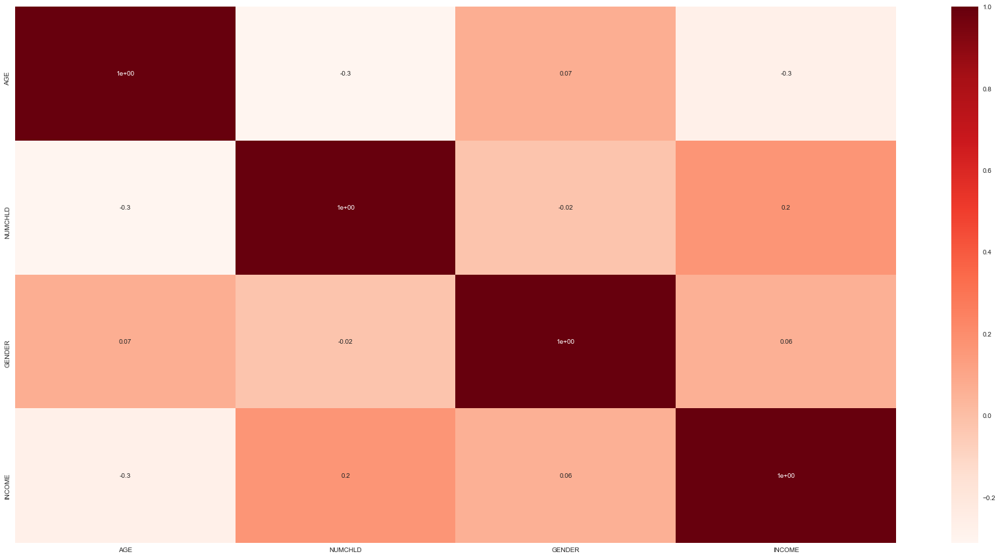

In [94]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_dem.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [92]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor

def corr_rf(df):
    feature_table = pd.DataFrame(index=df.columns)
    i=0
    for col in df:
        embeded_rf_selector = SelectFromModel(RandomForestRegressor(n_estimators=100), max_features=len(df.columns)-1)
        embeded_rf_selector.fit(df.drop(col,axis=1), df[col])
        embeded_rf_support = embeded_rf_selector.get_support()
        embeded_rf_support = list(embeded_rf_support)
        embeded_rf_support.insert(i,True)
        i+=1

        feature_table[col]=embeded_rf_support
    feature_table['Total'] = np.sum(feature_table, axis=1)
    feature_table = feature_table.sort_values(['Total'] , ascending=False)
    return feature_table

corr_rf(df_dem)

,AGE,NUMCHLD,GENDER,INCOME,Total
AGE,True,True,True,True,4
NUMCHLD,True,True,False,False,2
INCOME,False,False,True,True,2
GENDER,False,False,True,False,1


Loaded backend module://ipykernel.pylab.backend_inline version unknown.
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A98FDB4588>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A98FDB4588> on colorbar
Setting pcolormesh


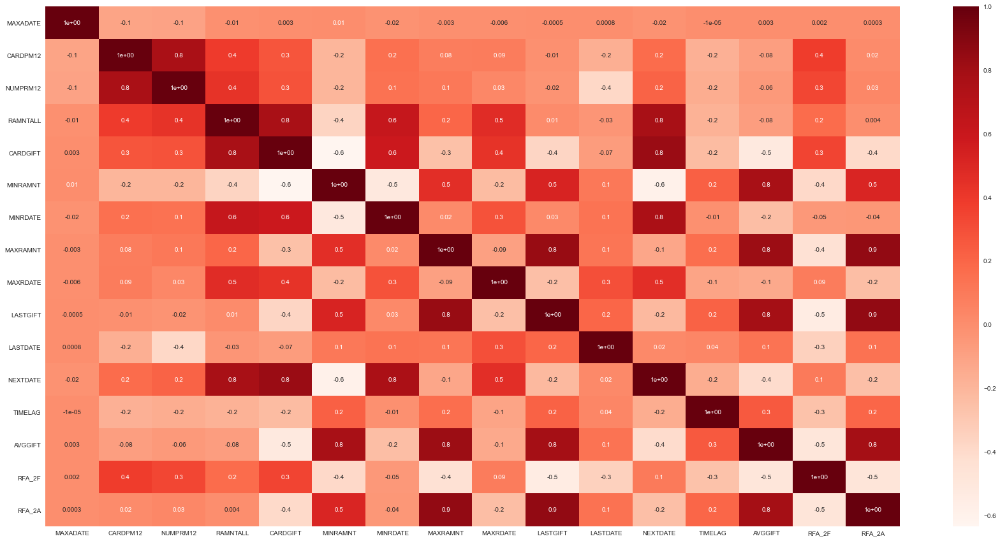

In [95]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_sum.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [96]:
df_sum.drop(['MAXADATE'], axis=1, inplace=True)  #no correlation

Loaded backend module://ipykernel.pylab.backend_inline version unknown.
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A9BE5B4B48>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A9BE5B4B48> on colorbar
Setting pcolormesh


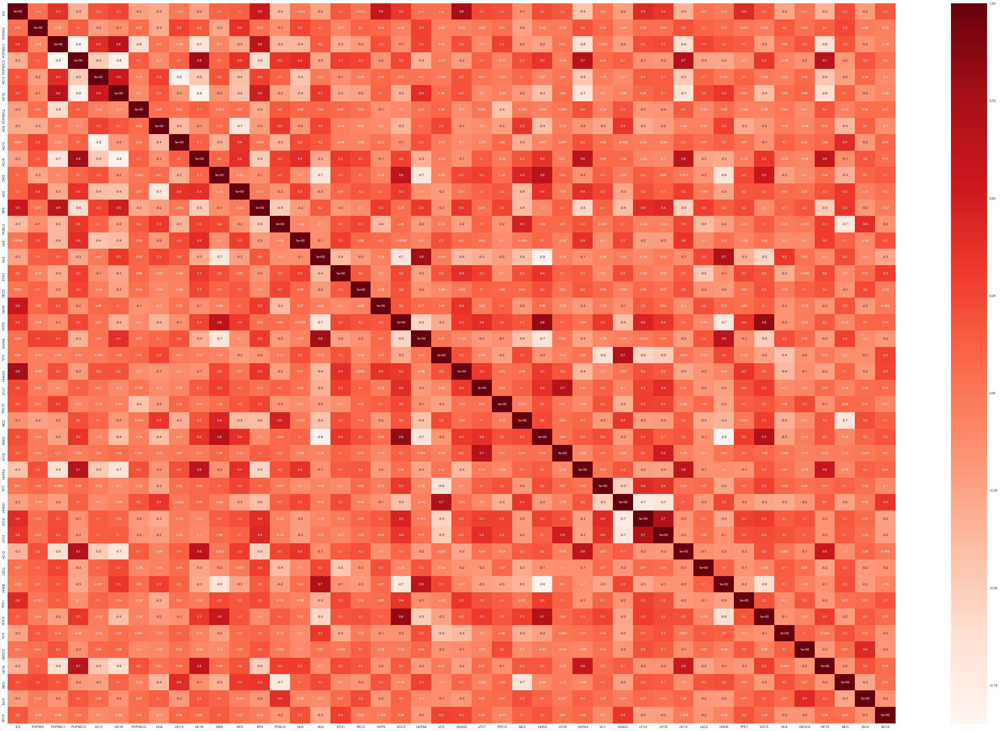

In [97]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(60,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_cen.corr(method ='spearman')
cor_heatmap(cor_spearman)

<a class="anchor" id="pca_census">
    
<font size="6"><span style='color: LightSkyBlue'> **3.4. PCA for census category**  </span></font>
    
</a>


In [103]:
#It was a try to see if it was good for the project. But as can be seen below, it was not good as using all of them 

In [98]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_cen)
pca_feat  

# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,7.930630,0.000000,0.180240,0.180240
2,5.968689,-1.961942,0.135651,0.315890
3,4.199328,-1.769361,0.095438,0.411328
4,3.936499,-0.262828,0.089465,0.500793
5,2.112336,-1.824164,0.048007,0.548800
6,1.884840,-0.227496,0.042837,0.591637
7,1.680594,-0.204246,0.038195,0.629832
8,1.396484,-0.284110,0.031738,0.661570
9,1.114014,-0.282471,0.025318,0.686888
10,1.018506,-0.095507,0.023148,0.710036


Loaded backend module://ipykernel.pylab.backend_inline version unknown.
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=14.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 

findfont: score(<Font 'Segoe UI Emoji' (seguiemj.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.

findfont: score(<Font 'Mistral' (MISTRAL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCKI.TTF) 

findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 

findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF

findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (ver

findfont: score(<Font 'Cambria' (cambriab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 40

findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB Demi' (BRLNSDB.TTF) normal normal 700 norm

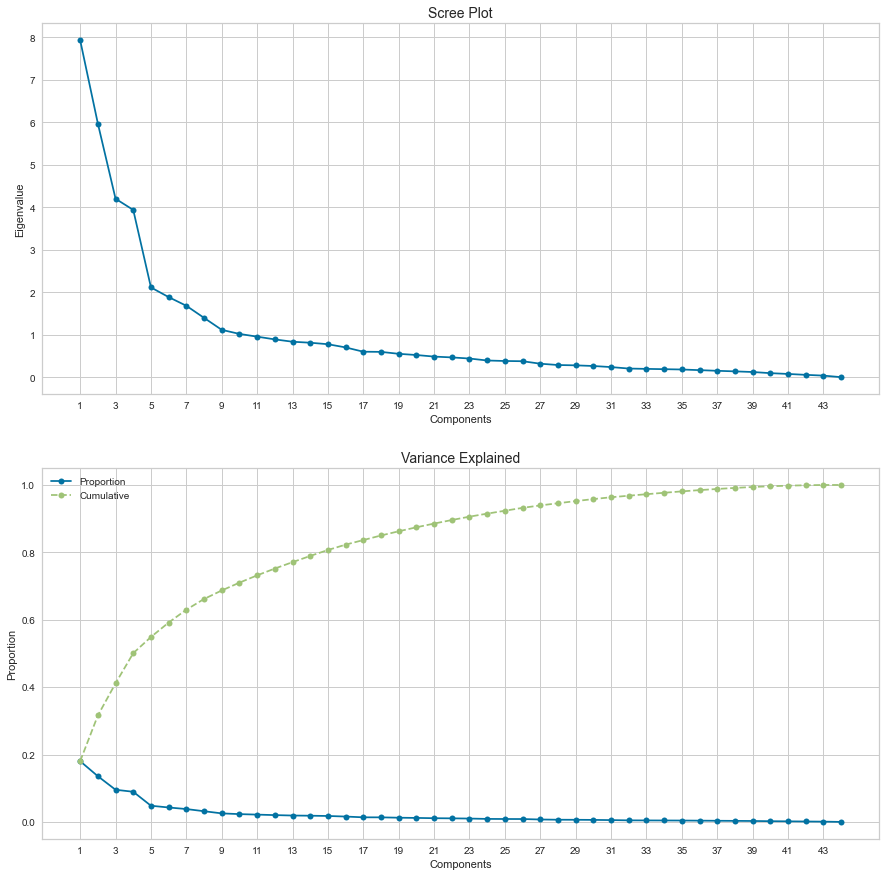

In [99]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [100]:
pca = PCA(n_components=7)
pca_feat = pca.fit_transform(df_cen)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_cen.index, columns=pca_feat_names)  
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,
95515,-2.416826,0.099477,-1.338244,-1.294030,0.444382,-1.059264,-0.808147
148535,-1.299184,-5.847388,-0.856136,0.902841,-2.473954,1.787745,3.184570
15078,-3.655295,1.690988,1.357306,-1.474251,0.659314,1.182809,-1.278317
172556,-1.134025,3.393204,0.810693,-2.458879,-2.499416,0.894091,1.876091
7112,0.461572,1.965846,-1.202201,-1.135610,-1.923329,-0.457111,1.007419
...,...,...,...,...,...,...,...
184568,2.174620,-2.909491,1.944073,0.548431,0.584913,-0.024646,1.487095
122706,-0.838927,-3.792766,1.899610,1.396300,-1.337031,-1.478929,1.601675
189641,1.561104,-0.865210,-1.595442,-3.241002,0.046645,0.159829,0.789483


In [101]:
# Reassigning df to contain pca variables
df_pca_cen = pd.concat([df_cen, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca_cen.head()

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,HHAS3,LFC7,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,EIC4,AFC5,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352199,-0.424995,-1.247835,0.960233,1.063317,-0.925258,0.681010,0.306077,-0.717640,1.855259,1.104098,-0.372537,-0.182192,0.774132,-0.326142,-0.754884,0.326633,-0.289678,-0.358418,0.893707,-0.622906,-0.937562,0.461931,0.222990,-0.947255,0.179847,0.700300,-0.182967,-0.599137,0.219194,0.076125,-0.480421,-0.740775,-0.575132,0.165373,-0.107967,1.000753,-0.116110,0.443943,0.749331,-0.513089,-0.926411,2.375360,0.745053,-2.416826,0.099477,-1.338244,-1.294030,0.444382,-1.059264,-0.808147
148535,2.413624,-0.111176,0.844133,-0.658082,1.232556,0.754811,-0.437976,-1.171080,-0.932623,-0.571749,1.260389,1.388938,0.720689,-0.879682,-0.230878,-1.240352,-0.952359,-0.865989,4.836975,1.731449,-0.622906,-1.357061,1.366792,0.464392,0.629881,-0.474091,1.879593,-0.050518,-0.599137,1.702188,-1.543700,0.784462,0.275649,-0.575132,0.082164,-1.041794,0.284998,3.069983,-1.086004,-0.111822,-0.513089,-0.329196,-0.411949,-1.654202,-1.299184,-5.847388,-0.856136,0.902841,-2.473954,1.787745,3.184570
15078,-0.507399,0.676199,-1.247835,1.781840,-1.475271,-1.580200,-0.374034,-0.175605,0.178120,2.303322,0.088208,0.004922,-1.429027,1.246650,0.197810,-0.366509,0.531271,0.129458,-0.358418,0.223513,-0.453088,-0.098564,-0.744552,0.766144,0.023290,0.702997,0.372718,0.876627,1.069103,-0.204519,0.076125,-0.033992,0.197463,-0.078088,-0.250669,-0.277754,-0.251819,0.820976,-0.321030,0.366596,0.922396,-0.428732,1.578986,-1.054388,-3.655295,1.690988,1.357306,-1.474251,0.659314,1.182809,-1.278317
172556,-0.085377,-0.478240,-1.247835,1.632457,-0.205977,-1.437821,-0.182208,0.595086,-0.466828,2.303322,0.635226,-0.162838,-1.858971,0.443369,-0.373774,1.089897,-1.259317,-0.080110,0.194283,-1.005177,-0.622906,-0.158493,-1.046172,-1.104718,-1.068574,0.179847,0.110653,-2.103481,0.026453,-1.193181,-0.365645,-0.182802,-0.662589,1.247360,2.911249,-0.107967,-1.683330,0.633559,0.443943,1.610484,1.018095,-0.926411,-1.407417,-0.854450,-1.134025,3.393204,0.810693,-2.458879,-2.499416,0.894091,1.876091
7112,-0.714017,-0.222850,0.844133,-0.658082,-1.221412,-1.466297,-0.437976,0.980431,1.503845,-0.534410,1.221316,-0.833876,0.247751,0.348865,-0.659565,-0.949071,-4.277737,-0.918381,-0.358418,-0.893478,-0.622906,1.159932,-1.951034,-1.104718,0.933177,1.880085,-0.675542,1.009076,-0.599137,-1.546275,0.591524,-0.406016,-0.349843,0.584636,-0.500294,-0.787114,-0.341288,-0.209818,0.826430,-2.025495,-0.513089,-0.826876,-1.606510,-0.354605,0.461572,1.965846,-1.202201,-1.135610,-1.923329,-0.457111,1.007419


In [102]:
metric_features = df_cen.columns.tolist()

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca_cen.corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
IC5,0.0897502,-0.460728,-0.192373,0.515433,-0.0973539,0.420183,0.08505
POP903,0.0839868,0.0281927,0.166011,0.0298369,0.00123441,-0.00763049,-0.0481216
POP90C1,0.604252,-0.496685,-0.16363,0.0954322,-0.328781,0.0871174,-0.164192
POP90C3,-0.711612,0.40376,0.3018,-0.084524,0.0105996,0.257914,0.00727956
HC11,0.295408,-0.375737,-0.612631,-0.279749,-0.0524818,-0.0678993,0.0560673
HC19,0.731214,-0.310259,-0.356556,0.0264918,0.068592,-0.206183,0.0053439
POP90C2,-0.00627248,0.227908,-0.139379,-0.0348256,0.48843,-0.466111,0.22896
HC8,0.257459,0.262197,-0.556141,-0.378951,0.0515436,0.177514,0.0170776
HC13,0.127525,0.0798864,0.554481,0.447961,0.0313165,-0.156253,-0.154372
HC18,-0.645886,0.273304,0.267715,-0.0803733,-0.0114012,0.295516,-0.0555506


In [103]:
df_pca_cen[pca_feat_names]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,
95515,-2.416826,0.099477,-1.338244,-1.294030,0.444382,-1.059264,-0.808147
148535,-1.299184,-5.847388,-0.856136,0.902841,-2.473954,1.787745,3.184570
15078,-3.655295,1.690988,1.357306,-1.474251,0.659314,1.182809,-1.278317
172556,-1.134025,3.393204,0.810693,-2.458879,-2.499416,0.894091,1.876091
7112,0.461572,1.965846,-1.202201,-1.135610,-1.923329,-0.457111,1.007419
...,...,...,...,...,...,...,...
184568,2.174620,-2.909491,1.944073,0.548431,0.584913,-0.024646,1.487095
122706,-0.838927,-3.792766,1.899610,1.396300,-1.337031,-1.478929,1.601675
189641,1.561104,-0.865210,-1.595442,-3.241002,0.046645,0.159829,0.789483


In [104]:
df_pca_cen[metric_features]

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,HHAS3,LFC7,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,EIC4,AFC5
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352199,-0.424995,-1.247835,0.960233,1.063317,-0.925258,0.681010,0.306077,-0.717640,1.855259,1.104098,-0.372537,-0.182192,0.774132,-0.326142,-0.754884,0.326633,-0.289678,-0.358418,0.893707,-0.622906,-0.937562,0.461931,0.222990,-0.947255,0.179847,0.700300,-0.182967,-0.599137,0.219194,0.076125,-0.480421,-0.740775,-0.575132,0.165373,-0.107967,1.000753,-0.116110,0.443943,0.749331,-0.513089,-0.926411,2.375360,0.745053
148535,2.413624,-0.111176,0.844133,-0.658082,1.232556,0.754811,-0.437976,-1.171080,-0.932623,-0.571749,1.260389,1.388938,0.720689,-0.879682,-0.230878,-1.240352,-0.952359,-0.865989,4.836975,1.731449,-0.622906,-1.357061,1.366792,0.464392,0.629881,-0.474091,1.879593,-0.050518,-0.599137,1.702188,-1.543700,0.784462,0.275649,-0.575132,0.082164,-1.041794,0.284998,3.069983,-1.086004,-0.111822,-0.513089,-0.329196,-0.411949,-1.654202
15078,-0.507399,0.676199,-1.247835,1.781840,-1.475271,-1.580200,-0.374034,-0.175605,0.178120,2.303322,0.088208,0.004922,-1.429027,1.246650,0.197810,-0.366509,0.531271,0.129458,-0.358418,0.223513,-0.453088,-0.098564,-0.744552,0.766144,0.023290,0.702997,0.372718,0.876627,1.069103,-0.204519,0.076125,-0.033992,0.197463,-0.078088,-0.250669,-0.277754,-0.251819,0.820976,-0.321030,0.366596,0.922396,-0.428732,1.578986,-1.054388
172556,-0.085377,-0.478240,-1.247835,1.632457,-0.205977,-1.437821,-0.182208,0.595086,-0.466828,2.303322,0.635226,-0.162838,-1.858971,0.443369,-0.373774,1.089897,-1.259317,-0.080110,0.194283,-1.005177,-0.622906,-0.158493,-1.046172,-1.104718,-1.068574,0.179847,0.110653,-2.103481,0.026453,-1.193181,-0.365645,-0.182802,-0.662589,1.247360,2.911249,-0.107967,-1.683330,0.633559,0.443943,1.610484,1.018095,-0.926411,-1.407417,-0.854450
7112,-0.714017,-0.222850,0.844133,-0.658082,-1.221412,-1.466297,-0.437976,0.980431,1.503845,-0.534410,1.221316,-0.833876,0.247751,0.348865,-0.659565,-0.949071,-4.277737,-0.918381,-0.358418,-0.893478,-0.622906,1.159932,-1.951034,-1.104718,0.933177,1.880085,-0.675542,1.009076,-0.599137,-1.546275,0.591524,-0.406016,-0.349843,0.584636,-0.500294,-0.787114,-0.341288,-0.209818,0.826430,-2.025495,-0.513089,-0.826876,-1.606510,-0.354605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.351250,4.147998,0.844133,-0.658082,0.950491,0.726335,-0.437976,-0.882071,-0.645980,-0.310379,-1.123046,0.382381,0.849672,-1.493956,-0.516669,0.701522,-0.389603,-0.865989,-0.358418,-0.055735,0.056366,-1.357061,1.608089,0.464392,0.508563,-0.931847,-0.216928,0.280605,0.304493,1.207857,-1.322815,0.933271,1.213887,-0.492291,-0.250669,-0.023074,-0.072880,-0.116110,1.304538,-1.068658,-0.417390,1.462449,-1.307870,0.345177
122706,1.269272,-0.411330,0.780740,-0.558494,0.837665,-0.156413,-0.437976,-0.978408,-0.502658,0.585747,0.830589,2.814893,0.075774,-0.312660,-0.659565,-0.851977,0.275473,-0.813597,-0.082067,1.284653,-0.622906,-0.877634,1.065172,-0.380514,0.023290,-2.239723,1.683044,-1.110112,0.095963,0.854763,-1.396443,1.230891,-0.115283,-0.409451,-0.250669,-1.126687,0.284998,0.820976,0.348322,0.749331,-0.513089,2.358272,-0.810136,-0.054699
189641,-0.435914,-0.484837,0.844133,-0.658082,1.260763,0.754811,-0.437976,2.008018,-1.075945,-0.571749,1.104098,-0.959695,0.591706,1.152147,-0.183246,0.216054,-0.184964,0.339025,-0.358418,-1.061026,-0.622906,-0.817705,-1.046172,-1.527171,0.508563,0.376028,-1.068640,0.810402,-0.599137,1.066619,-1.249186,-0.033992,1.213887,-0.575132,-0.084252,0.231606,0.553406,-0.772070,0.826430,-1.738444,-0.130293,-0.926411,-0.312402,-1.354295


<hr>
<a class="anchor" id="clustering">
    
<font size="8"><span style='color: DarkTurquoise'> **4. Clustering**  </span></font>
    
</a>


In [105]:
def kelbowplots(clus_estim, data):
    """
    This function produces the k-elbow plot for a given clustering estimator according to 2 different clustering quality measures: "Distortion" and "Calinski Harabasz".
    """
    sns.set()
    fig, axes = plt.subplots(1, 2, figsize=(20,7))

    # Plot the data
    metrics = ["distortion", "calinski_harabasz"]
    ylabels = ["Distortion measure", "Calinski Harabasz measure"]
    titles = ["Distortion measure plot", "Calinski Harabasz measure plot"]
    for ax, m, yl, tl in zip(axes.flatten(), metrics, ylabels, titles):
        # KElbowVisualizer produces the elbow plot for several quality measures
        KElbowVisualizer(clus_estim, metric=m, timings=False, locate_elbow=False, ax=ax).fit(data)
        ax.invert_xaxis()
        ax.set_ylabel(yl, fontsize=13)
        ax.set_xlabel("Number of clusters", fontsize=13)
        ax.set_title(tl, fontsize=13)

    # Set figure
    plt.suptitle("K-Elbow Plots", fontsize=23)

    plt.show()

In [106]:
#K means Clustering 
def clus_Kmeans(df, nclust):
    model = KMeans(nclust, random_state=0)
    model.fit(df)
    clust_labels = model.predict(df)
    cent = model.cluster_centers_
    return (clust_labels, cent)

In [243]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [108]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [109]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [110]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(s=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

<a class="anchor" id="sample">
    
<font size="6"><span style='color: LightSkyBlue'> **4.1. Dataframe Sample**  </span></font>
    
</a>


https://datascience.stackexchange.com/questions/47889/how-to-run-agglomerativeclustering-on-a-big-data-in-python

In [111]:
df_sample = df_.sample(n=20000)
df_dem_sample = df_dem.sample(n=20000)
df_sum_sample = df_sum.sample(n=20000)
df_cen_sample = df_cen.sample(n=20000)

df_pca_sample = df_pca_cen[pca_feat_names].sample(n=20000)

#we've runned this cell and the ones below 4x times we got the same final results




<a class="anchor" id="opt_clust">
    
<font size="6"><span style='color: LightSkyBlue'> **4.2. Optimal Clusterers**  </span></font>
    
</a>


<a class="anchor" id="oc_dem">
    
<font size="4"><span style='color: PowderBlue '> **4.2.1. Demographic Features**  </span></font>
    
</a>


In [112]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_dem_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:  #hierarchical
    r2_scores[linkage] = get_r2_scores(
        df_dem_sample, hierarchical.set_params(linkage=linkage)
    )
    
pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,0.229715,0.048197,0.001619,0.001619,0.185075
3,0.413418,0.164105,0.185492,0.002163,0.340590
4,0.520678,0.247608,0.185835,0.003071,0.470404
5,0.586603,0.252025,0.196087,0.221720,0.538517
6,0.638328,0.395599,0.218511,0.222790,0.598174
7,0.670905,0.407892,0.218630,0.255932,0.638514
8,0.697853,0.460114,0.219378,0.258084,0.672065
9,0.722496,0.460567,0.224367,0.258927,0.696215


findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=21.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bol

findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) no

findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) norm

findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal

findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Britannic Bold' (BRITANI

findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Myanmar Text' (mmrtext

findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 n

findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB Demi' (BRLNSDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi' (FRADMIT.TTF) italic normal 400 normal>

findfont: score(<Font 'Microsoft New Tai Lue' (ntailu.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe Print' (segoepr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCBI____.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' 

findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Berlin Sans FB' (BRLNSR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi' (FRADMIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gloucester 

findfont: score(<Font 'Segoe Script' (segoescb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.535
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Comic Sans MS' (comici.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Medium' (framdit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Candara' (Candarab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Consolas' (consolab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Fax' (LFAX

findfont: score(<Font 'Trebuchet MS' (trebucit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal 900 normal>) = 0.525
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Dubai' (DUBAI-MEDIUM.TTF) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Segoe UI' (segoeuil.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'P

findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Tw Cen MT Condensed' (TCCB____.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Algerian' (ALGER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ARIALNB.TTF) normal normal 700 condensed>) = 0.5349999999999999
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Vivaldi' (VIVALDII.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bodoni MT' (BOD_CB.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Garamond' (GARA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisbi.ttf)

findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe Print' (segoeprb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Calibri' (calibrili.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Footlight MT Light' (FTLTLT.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Rockwell' (ROCK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Tahoma' (tahomabd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Corbel' (corbel.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Sitka Small' (SitkaZ

findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisb.ttf) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 0.25
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothL.ttc) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Sitka Small' (Sitka.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Chiller' (CHILLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Californian FB' (CALIFR.TTF) normal normal 

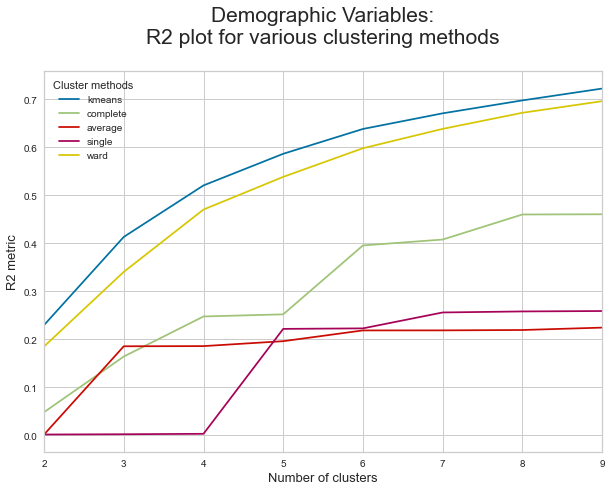

In [113]:
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

#kmeans seems to be the best option, 5 clusters

<a class="anchor" id="oc_sum">
    
<font size="4"><span style='color: PowderBlue '> **4.2.2. Summary Features**  </span></font>
    
</a>

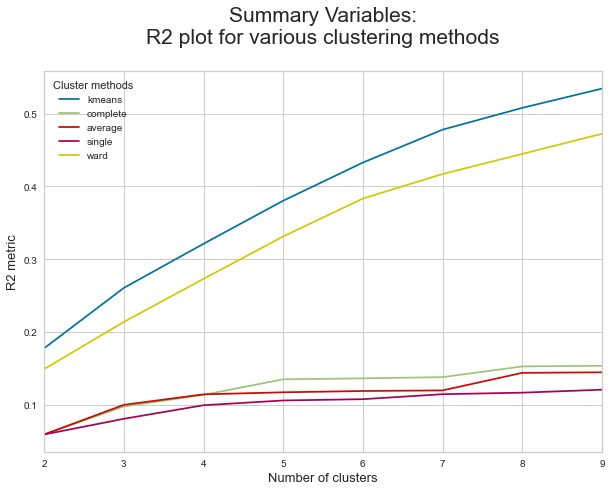

In [114]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_sum_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_sum_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Summary Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow



<a class="anchor" id="oc_cen">
   
<font size="4"><span style='color: PowderBlue '> **4.2.3. Census Features**  </span></font>
    
</a>

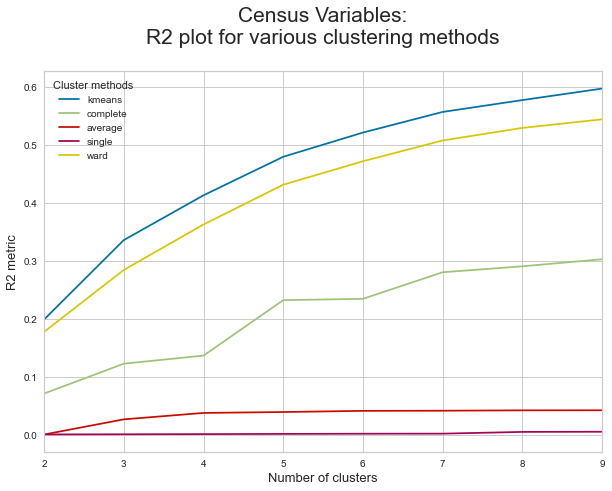

In [115]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_pca_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_pca_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Census Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

#pca

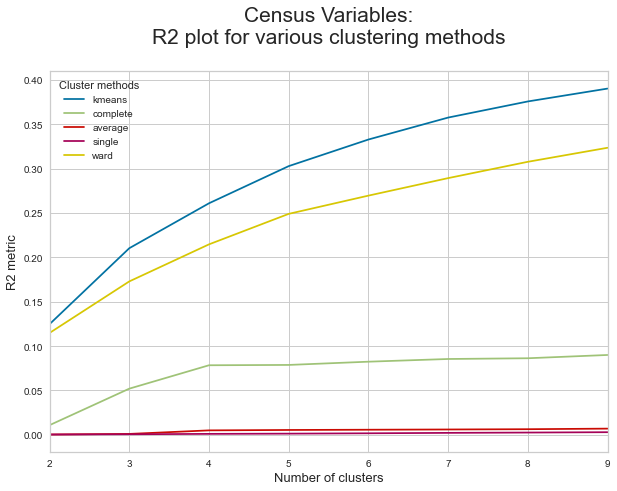

In [116]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_cen_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_cen_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Census Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

For our dataset, none of he hierarchical clusters seems to be as good as k-means, so we won't be testing with the hierarchical clustering.

<a class="anchor" id="num_clust">
   
<font size="6"><span style='color: LightSkyBlue'> **4.3. Defining the number of clusters**  </span></font>
    
</a>

In [117]:
range_clusters = range(1, 11)

<a class="anchor" id="nc_dem">
   
<font size="4"><span style='color: PowderBlue '> **4.3.1. Demographic Features**  </span></font>
    
</a>

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=15.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bol

findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) no

findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) norm

findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal

findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Britannic Bold' (BRITANI

findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Myanmar Text' (mmrtext

findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 n

findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB Demi' (BRLNSDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi' (FRADMIT.TTF) italic normal 400 normal>

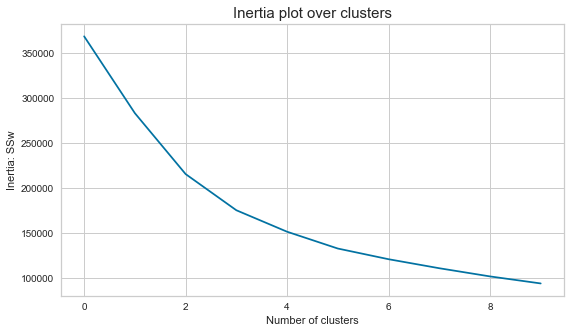

In [118]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_dem)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

#3

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=11.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold

findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) no

findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) norm

findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal

findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Britannic Bold' (BRITANI

findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Myanmar Text' (mmrtext

findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 n

findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB Demi' (BRLNSDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi' (FRADMIT.TTF) italic normal 400 normal>

findfont: score(<Font 'Microsoft New Tai Lue' (ntailu.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe Print' (segoepr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCBI____.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' 

findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Berlin Sans FB' (BRLNSR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi' (FRADMIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gloucester 

findfont: score(<Font 'Segoe Script' (segoescb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.535
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Comic Sans MS' (comici.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Medium' (framdit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Candara' (Candarab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Consolas' (consolab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Fax' (LFAX

findfont: score(<Font 'Trebuchet MS' (trebucit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal 900 normal>) = 0.525
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Verdana' (verdanai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Dubai' (DUBAI-MEDIUM.TTF) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Segoe UI' (segoeuil.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'P

findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft YaHei' (msyh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Tw Cen MT Condensed' (TCCB____.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Algerian' (ALGER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ARIALNB.TTF) normal normal 700 condensed>) = 0.5349999999999999
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Vivaldi' (VIVALDII.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bodoni MT' (BOD_CB.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Garamond' (GARA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisbi.ttf)

findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe Print' (segoeprb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Calibri' (calibrili.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Gill Sans MT' (GIL_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Footlight MT Light' (FTLTLT.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Rockwell' (ROCK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Tahoma' (tahomabd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Corbel' (corbel.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Sitka Small' (SitkaZ

findfont: score(<Font 'Papyrus' (PAPYRUS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisb.ttf) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 0.25
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothL.ttc) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Sitka Small' (Sitka.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Chiller' (CHILLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-BOLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Californian FB' (CALIFR.TTF) normal normal 

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=23.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold

findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) no

findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) norm

findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal

findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Britannic Bold' (BRITANI

findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Myanmar Text' (mmrtext

findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 n

findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB Demi' (BRLNSDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi' (FRADMIT.TTF) italic normal 400 normal>

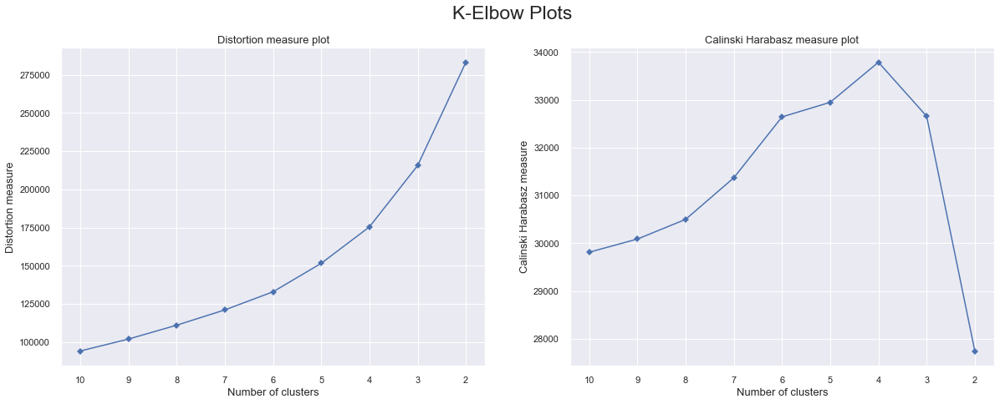

In [119]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_dem)
#4

For n_clusters = 2, the average silhouette_score is : 0.27094949246942474
For n_clusters = 3, the average silhouette_score is : 0.31235444350506236
For n_clusters = 4, the average silhouette_score is : 0.3046177531951075
For n_clusters = 5, the average silhouette_score is : 0.3073556549206811
For n_clusters = 6, the average silhouette_score is : 0.2944994526863919
For n_clusters = 7, the average silhouette_score is : 0.30282462871210497
For n_clusters = 8, the average silhouette_score is : 0.32360095975133707
For n_clusters = 9, the average silhouette_score is : 0.32289031119510225
For n_clusters = 10, the average silhouette_score is : 0.3339512564834154


findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold

findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) no

findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) norm

findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal

findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Britannic Bold' (BRITANI

findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Myanmar Text' (mmrtext

findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 n

findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB Demi' (BRLNSDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi' (FRADMIT.TTF) italic normal 400 normal>

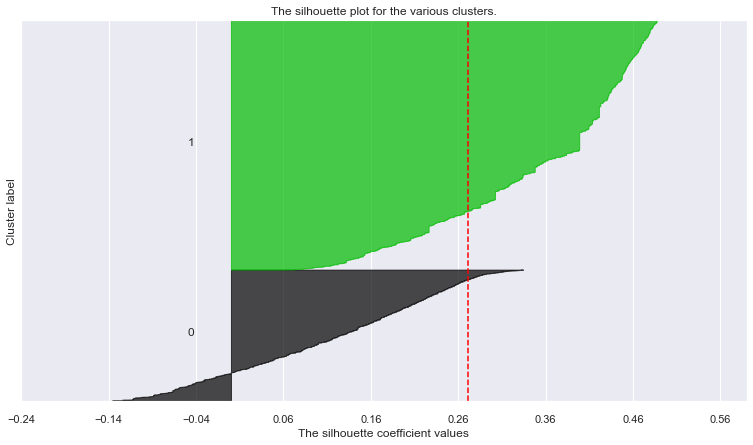

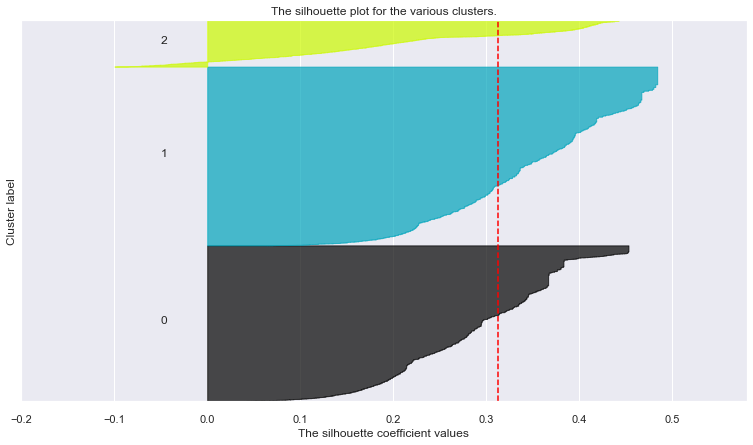

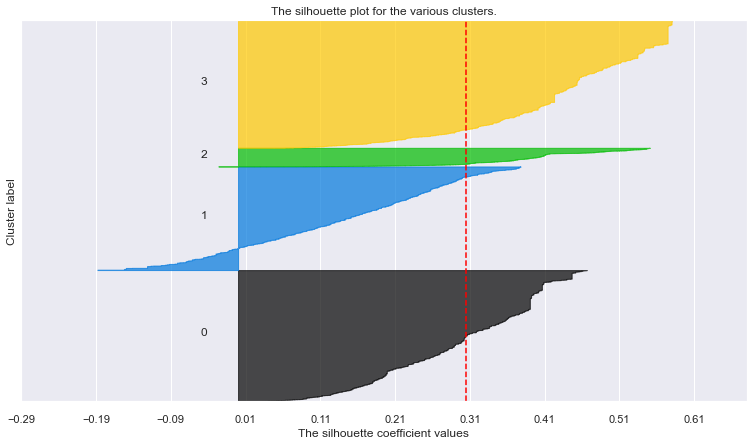

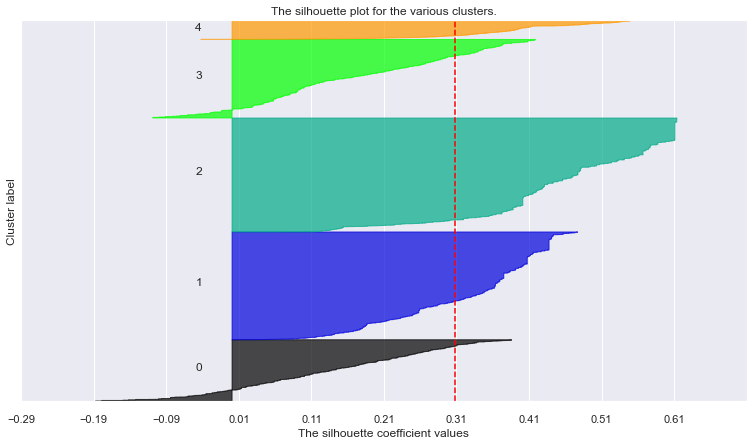

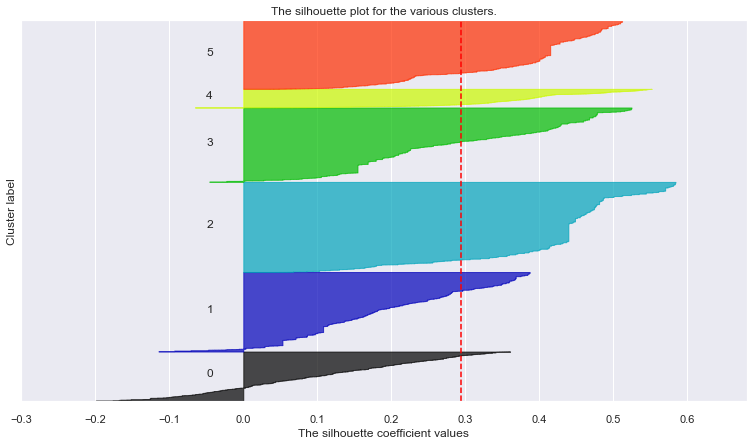

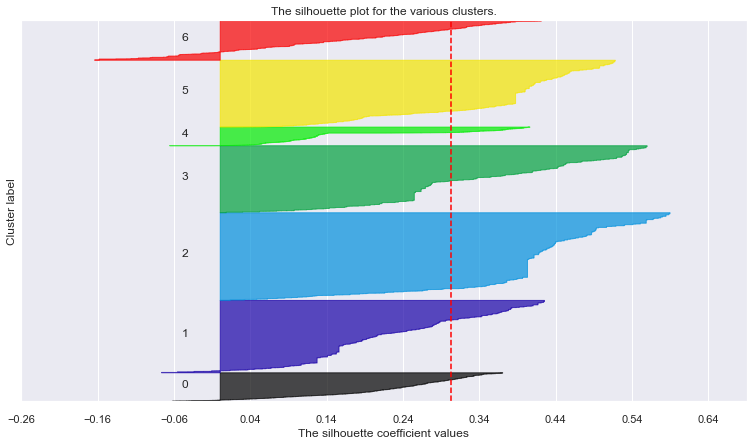

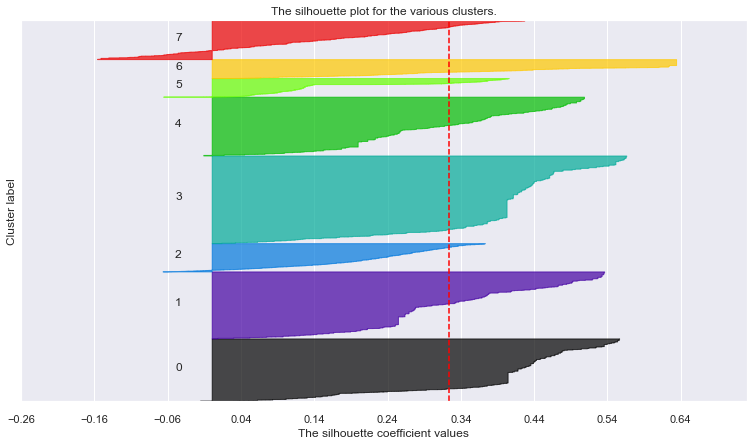

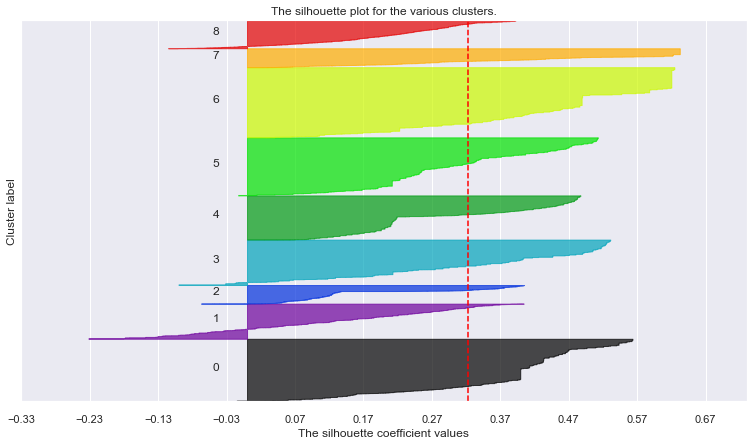

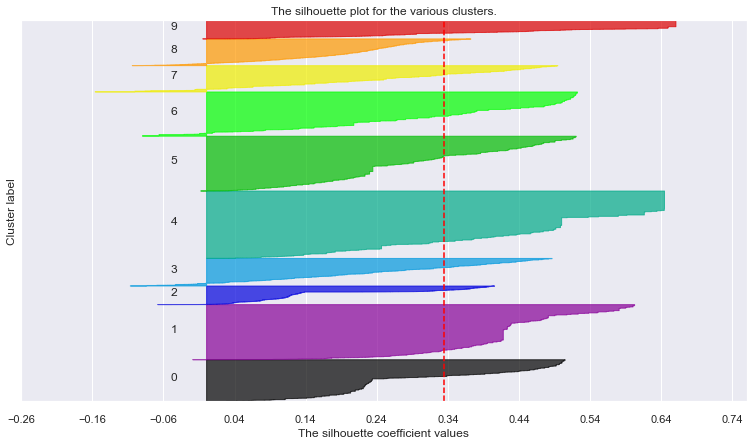

In [120]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_dem)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_dem, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_dem, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_dem) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=15.0.
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold

findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) no

findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Symbol' (seguisym.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) norm

findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal

findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'French Script MT' (FRSCRIPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Webdings' (webdings.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Britannic Bold' (BRITANI

findfont: score(<Font 'Lucida Bright' (LBRITEI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Myanmar Text' (mmrtext

findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft JhengHei' (msjh.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Imprint MT Shadow' (IMPRISHA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ravie' (RAVIE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 n

findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKVILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB Demi' (BRLNSDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi' (FRADMIT.TTF) italic normal 400 normal>

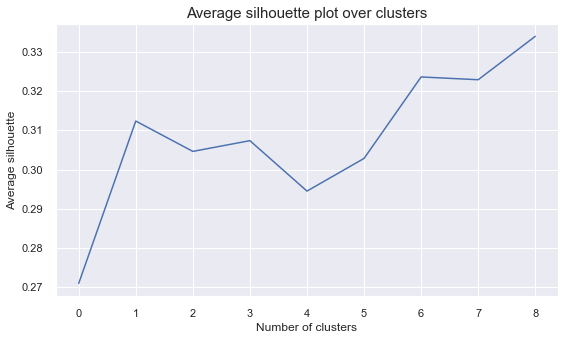

In [121]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#devia ser 4?

From the graphs above, the optimal number of clusters for the demographic segmentation is 5.

In [133]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_dem,3)
kmeans_dem_df = df_dem.copy()
kmeans_dem_df["kmeans_dem_labels"] = clust_labels

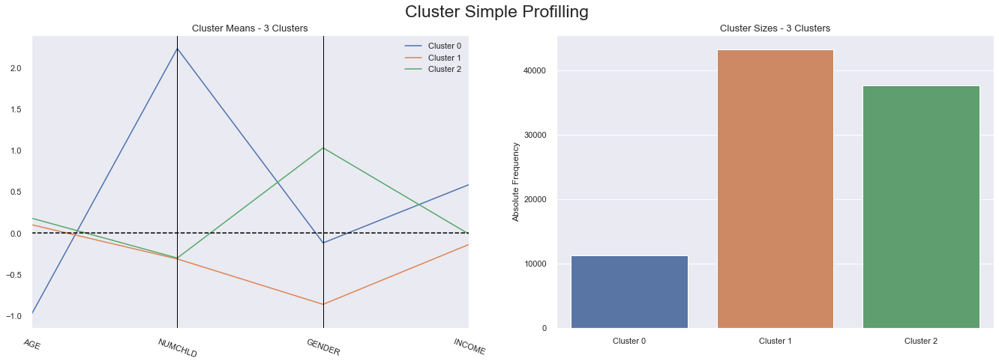

In [134]:
cluster_profiles(kmeans_dem_df, ["kmeans_dem_labels"], figsize=(23, 7))

In [135]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_dem_df, ['kmeans_dem_labels']).drop('kmeans_dem_labels').sort_values()

INCOME     0.050730
AGE        0.135925
NUMCHLD    0.689224
GENDER     0.783533
dtype: float64

In [136]:
#R2 score

r2(kmeans_dem_df, ["kmeans_dem_labels"])

0.473793664509504

<a class="anchor" id="nc_sum">
   
<font size="4"><span style='color: PowderBlue '> **4.3.2. Summary Features**  </span></font>
    
</a>

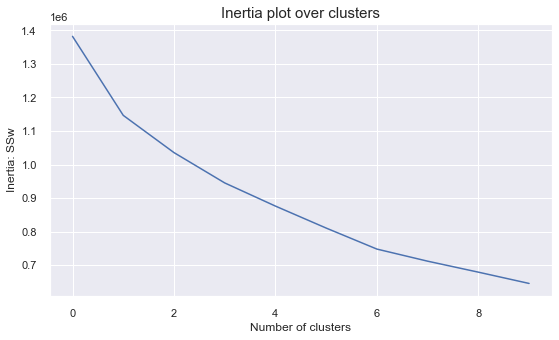

In [137]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_sum)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

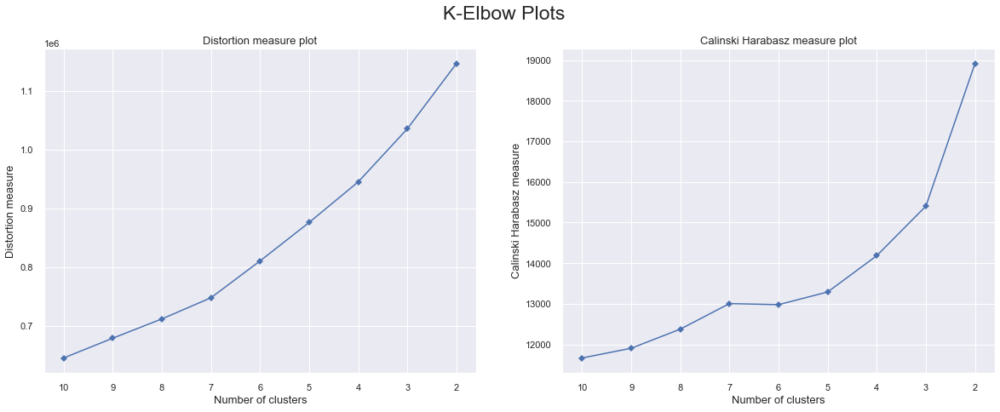

In [138]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_sum)

For n_clusters = 2, the average silhouette_score is : 0.22740710341440676
For n_clusters = 3, the average silhouette_score is : 0.19725213182805373
For n_clusters = 4, the average silhouette_score is : 0.20753925291313655
For n_clusters = 5, the average silhouette_score is : 0.2058274771278054
For n_clusters = 6, the average silhouette_score is : 0.1915185528830975
For n_clusters = 7, the average silhouette_score is : 0.19171554189035284
For n_clusters = 8, the average silhouette_score is : 0.16623088275418263
For n_clusters = 9, the average silhouette_score is : 0.16532799219125893
For n_clusters = 10, the average silhouette_score is : 0.16487846871409145


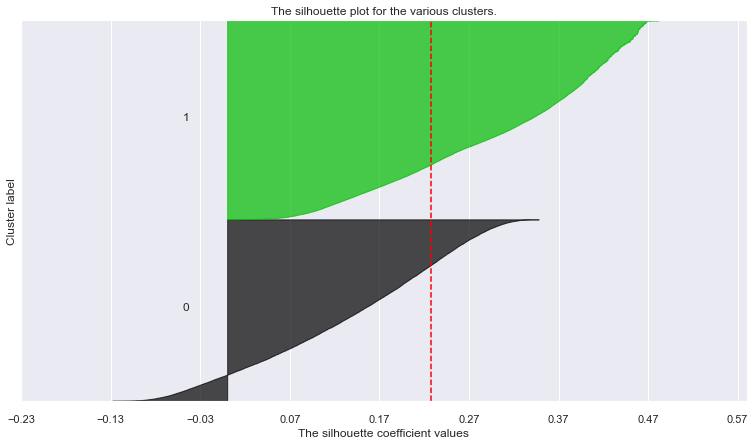

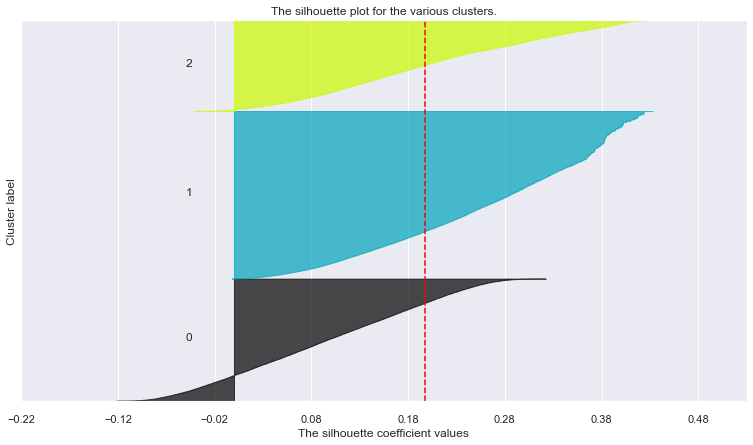

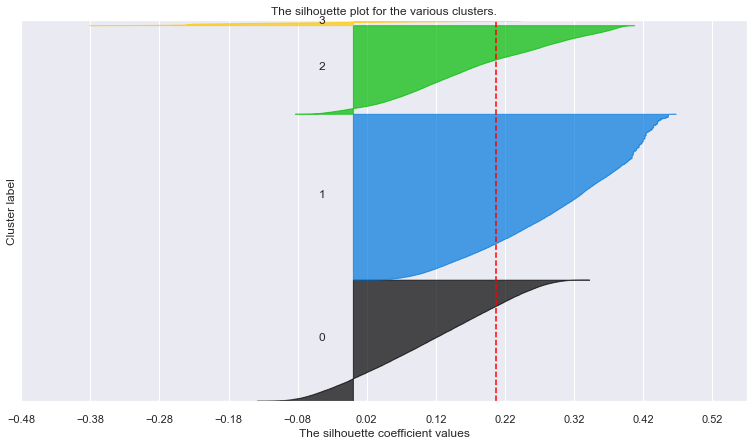

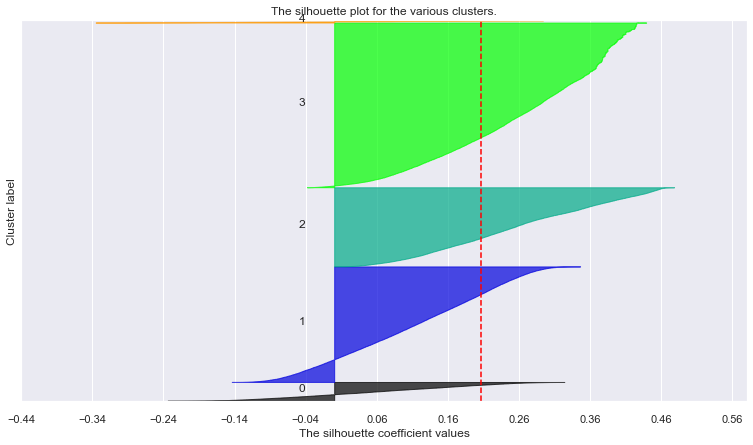

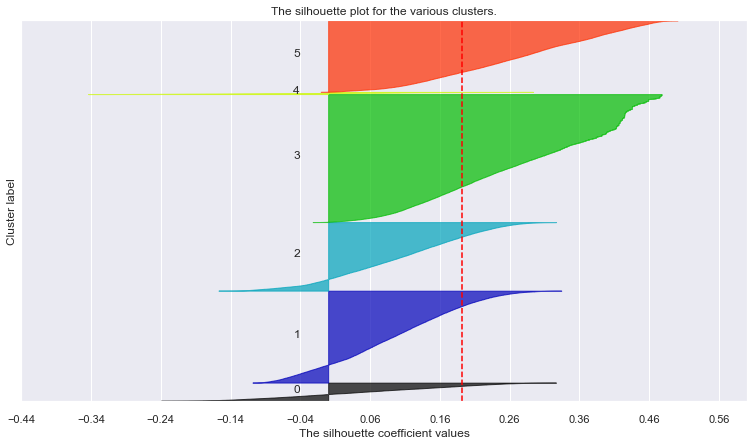

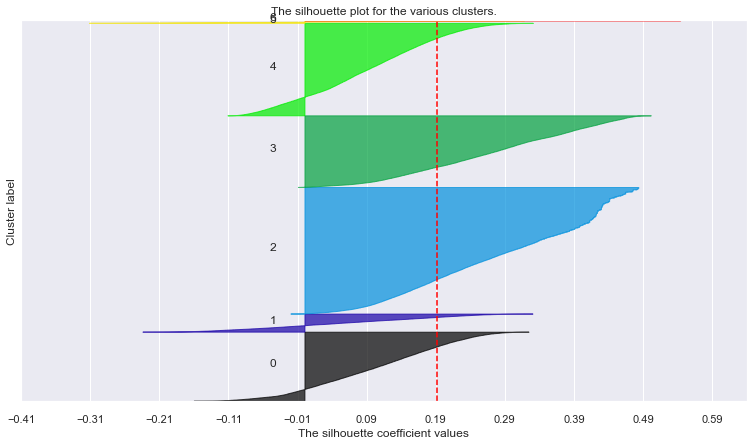

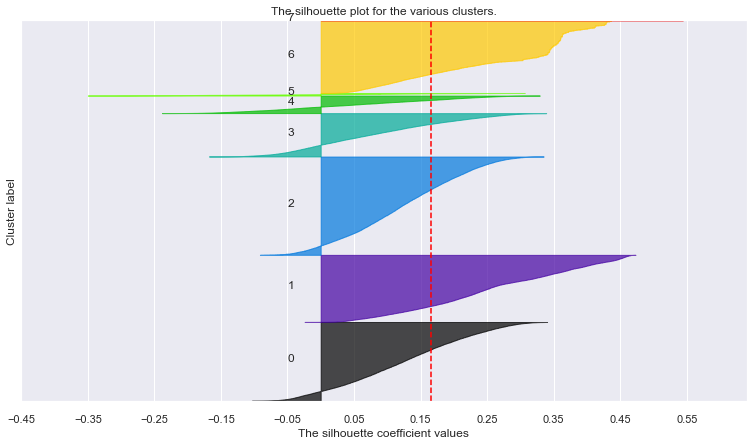

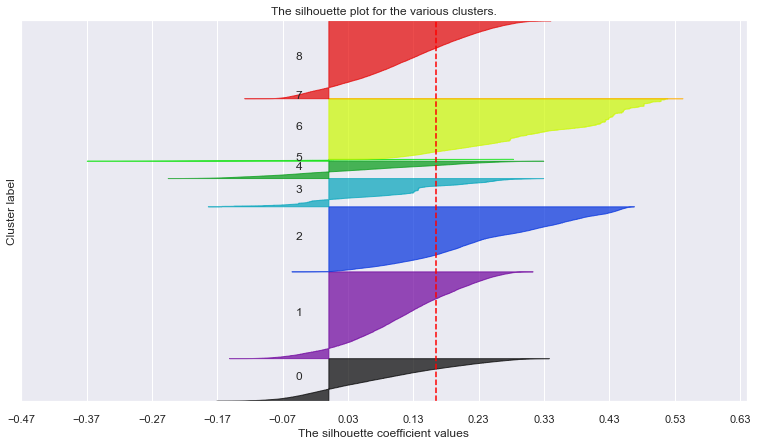

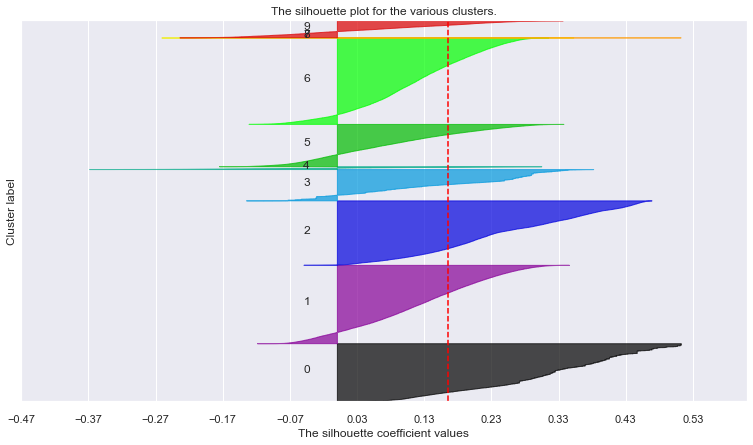

In [140]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_sum)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_sum, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_sum, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_sum) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

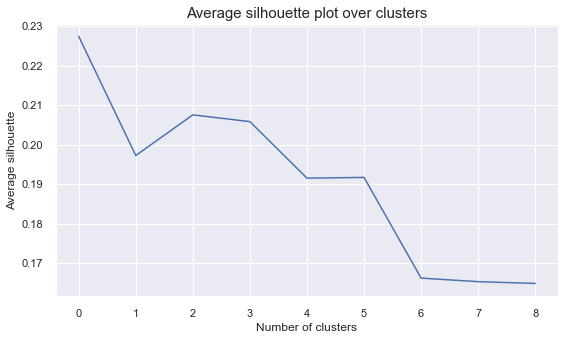

In [141]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()


From the graphs above, the optimal number of clusters for the demographic segmentation is 3. However, we have negative silhouette samples and for this reason, the clustering approach can be improved.

In [139]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum, 3)
kmeans_sum_df = df_sum.copy()
kmeans_sum_df["kmeans_sum_labels"] = clust_labels

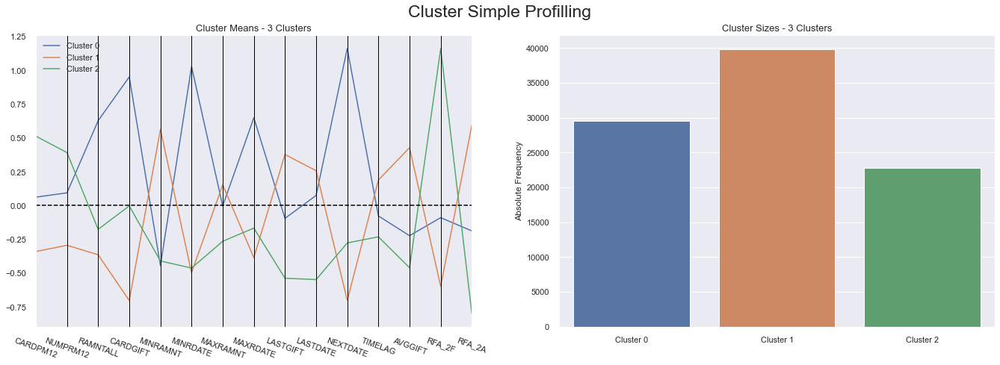

In [140]:
cluster_profiles(kmeans_sum_df, ["kmeans_sum_labels"], figsize=(23, 7))

In [141]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_sum_df, ['kmeans_sum_labels']).drop('kmeans_sum_labels').sort_values()

#before

MAXRAMNT    0.027514
TIMELAG     0.030623
NUMPRM12    0.078252
LASTDATE    0.104751
CARDPM12    0.116512
LASTGIFT    0.136112
AVGGIFT     0.147685
RAMNTALL    0.190896
MAXRDATE    0.206023
MINRAMNT    0.241721
RFA_2A      0.322350
RFA_2F      0.491193
MINRDATE    0.497893
CARDGIFT    0.503488
NEXTDATE    0.664301
dtype: float64

In [142]:
#R2 score

r2(kmeans_sum_df, ["kmeans_sum_labels"])

0.2776942572738419

With this cluster we were able to see the most important variables for summary segmentation. We will only keep the variables the top 7 variables with the highest scores. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [143]:
summ = r2_variables(kmeans_sum_df, ['kmeans_sum_labels']).drop('kmeans_sum_labels').sort_values().tail(7).index.to_list()

#it was 8 before, number outliers decreased

In [144]:
summ

['MAXRDATE',
 'MINRAMNT',
 'RFA_2A',
 'RFA_2F',
 'MINRDATE',
 'CARDGIFT',
 'NEXTDATE']

<a class="anchor" id="nc_cen_pca">
   
<font size="4"><span style='color: PowderBlue '> **4.3.3. Census Features with pca**  </span></font>
    
</a>

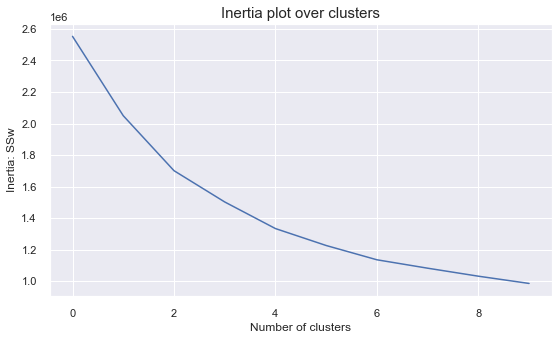

In [148]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_pca_cen[pca_feat_names])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

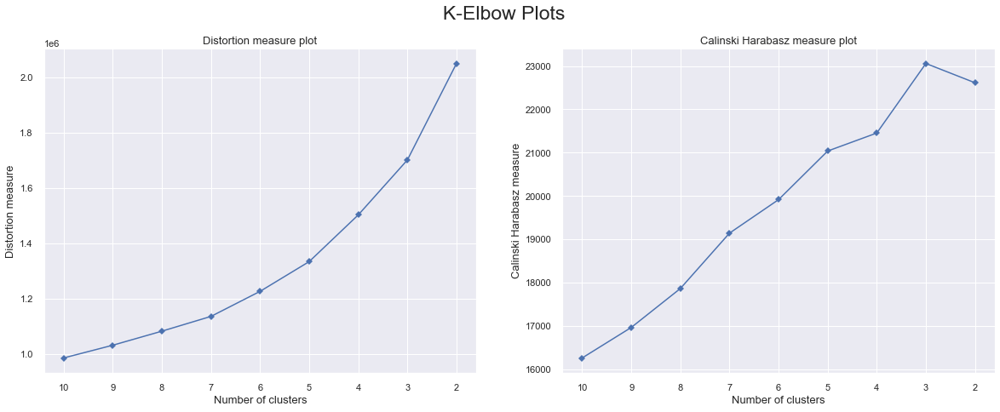

In [149]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_pca_cen[pca_feat_names])

For n_clusters = 2, the average silhouette_score is : 0.20403763828281843
For n_clusters = 3, the average silhouette_score is : 0.20998732927634167
For n_clusters = 4, the average silhouette_score is : 0.20726195575023906
For n_clusters = 5, the average silhouette_score is : 0.21818525290849966
For n_clusters = 6, the average silhouette_score is : 0.2071206696375697
For n_clusters = 7, the average silhouette_score is : 0.2139799530227037
For n_clusters = 8, the average silhouette_score is : 0.20156450012751748
For n_clusters = 9, the average silhouette_score is : 0.176061742503682
For n_clusters = 10, the average silhouette_score is : 0.17613194214440595


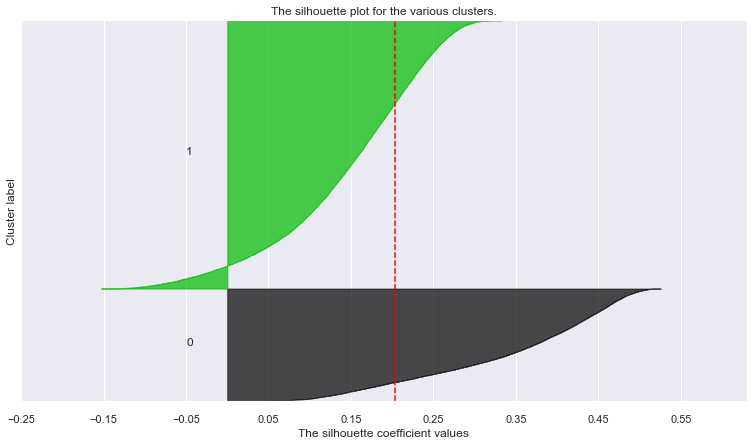

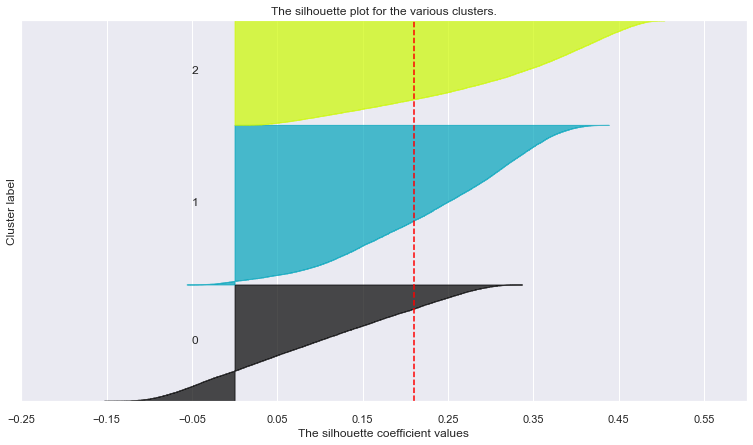

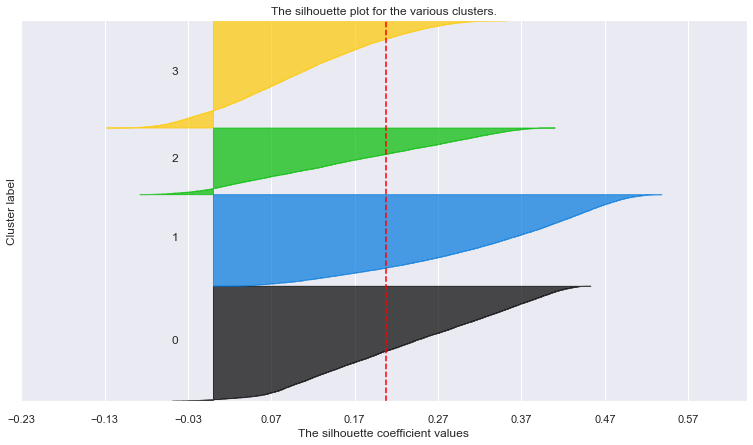

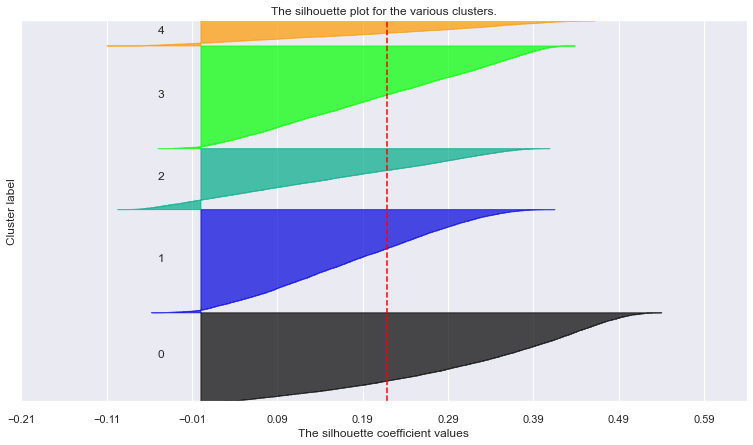

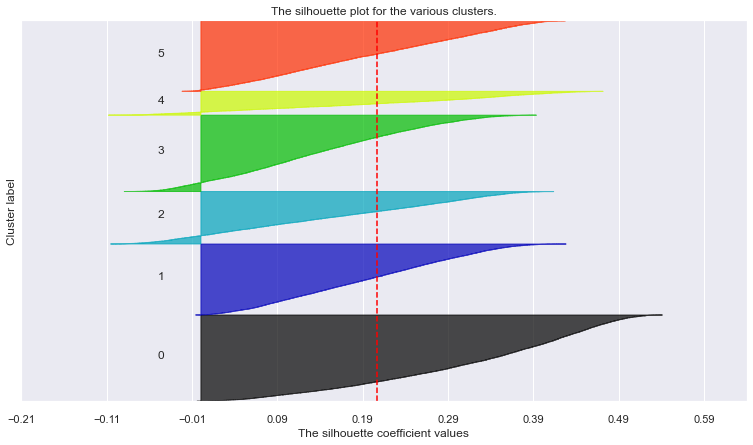

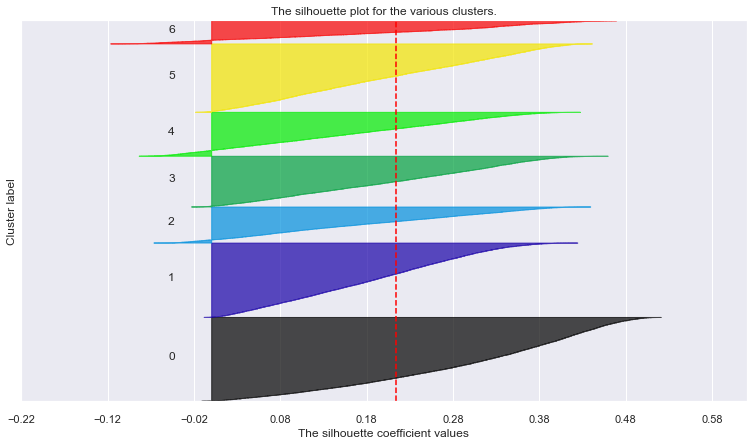

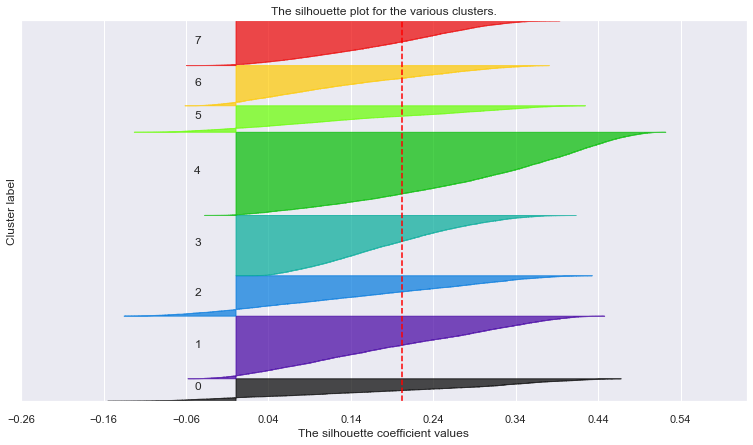

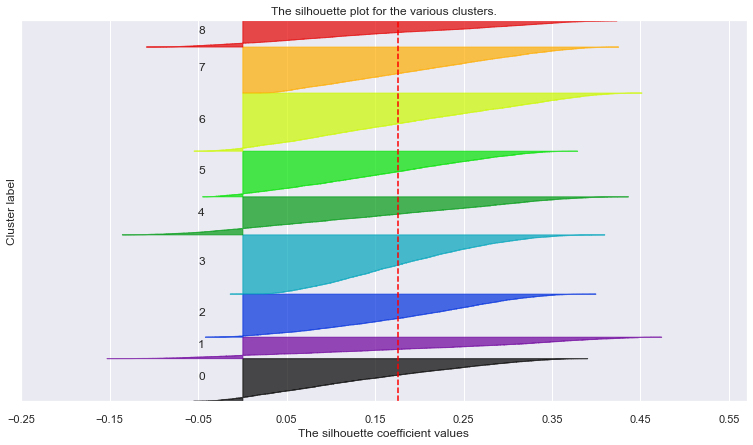

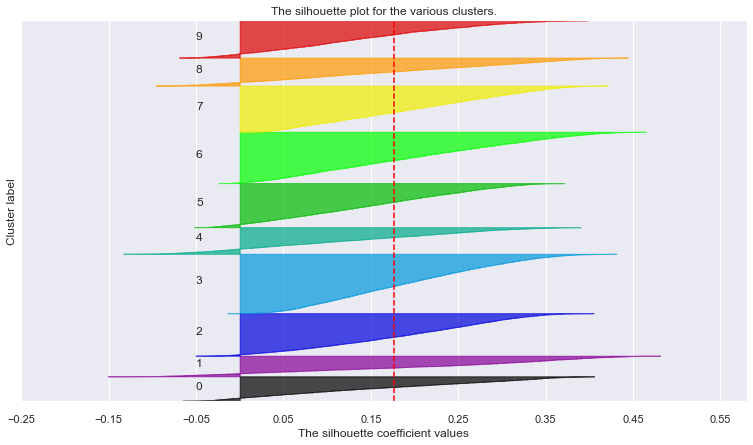

In [150]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_pca_cen[pca_feat_names])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_pca_cen[pca_feat_names], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca_cen[pca_feat_names], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_pca_cen[pca_feat_names]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

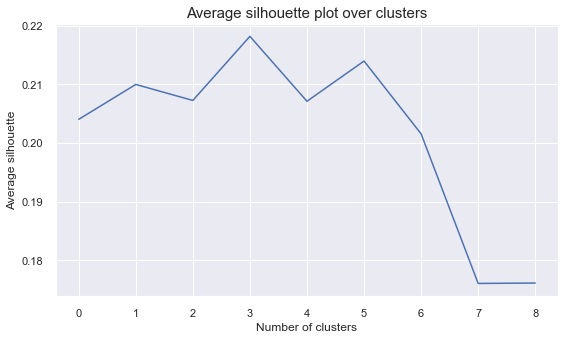

In [151]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [75]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_pca_cen[pca_feat_names], 4)
kmeans_cen_df = df_pca_cen[pca_feat_names].copy()
kmeans_cen_df["kmeans_cen_labels"] = clust_labels

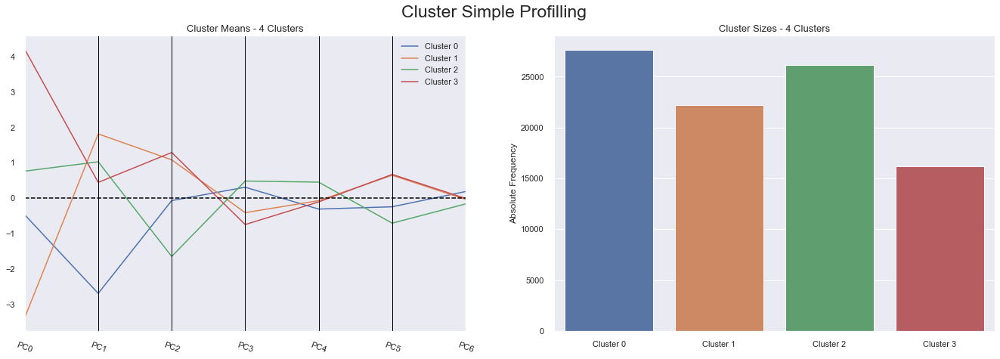

In [76]:
cluster_profiles(kmeans_cen_df, ["kmeans_cen_labels"], figsize=(23, 7))

In [77]:
#only PC0 AND PC1 worth keepin

In [78]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values()

PC6    0.010905
PC4    0.042396
PC3    0.059106
PC5    0.179685
PC2    0.319867
PC1    0.552318
PC0    0.766510
dtype: float64

<a class="anchor" id="nc_cen">
   
<font size="4"><span style='color: PowderBlue '> **4.3.4. Census Features**  </span></font>
    
</a>

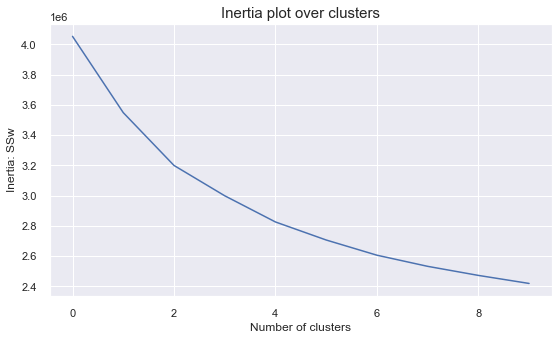

In [145]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_cen)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

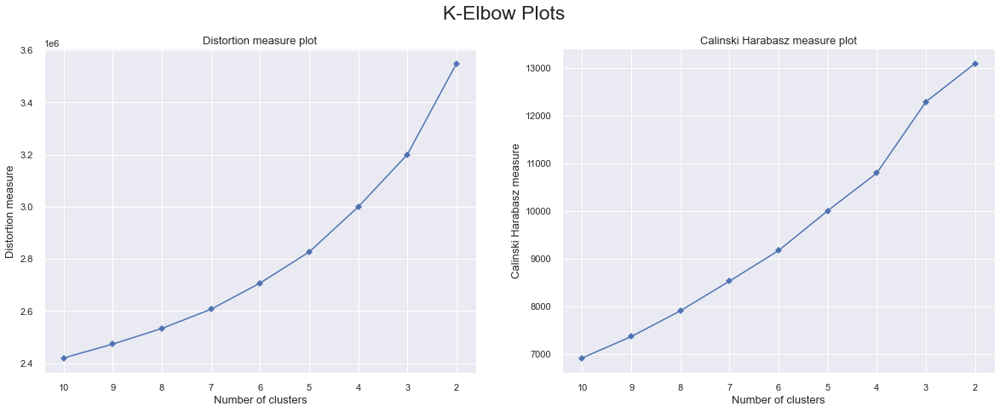

In [146]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen)

For n_clusters = 2, the average silhouette_score is : 0.1269703114180724
For n_clusters = 3, the average silhouette_score is : 0.12304975870477386
For n_clusters = 4, the average silhouette_score is : 0.11802074281303991
For n_clusters = 5, the average silhouette_score is : 0.12135399360148397
For n_clusters = 6, the average silhouette_score is : 0.11509083243588618
For n_clusters = 7, the average silhouette_score is : 0.1175829959660248
For n_clusters = 8, the average silhouette_score is : 0.11624118938260651
For n_clusters = 9, the average silhouette_score is : 0.10158143183043411
For n_clusters = 10, the average silhouette_score is : 0.09319253415473035


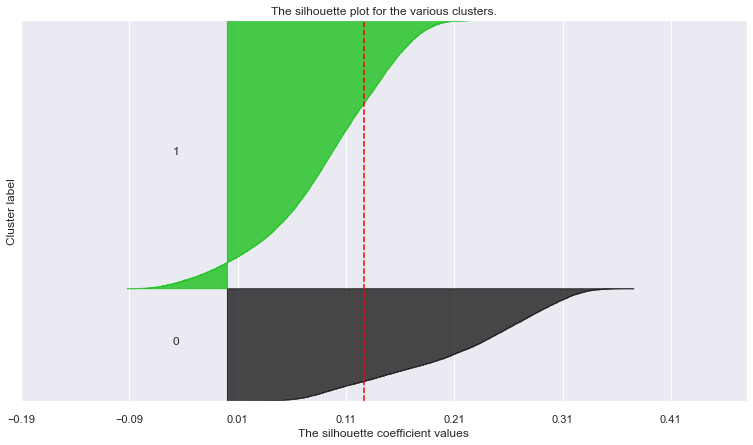

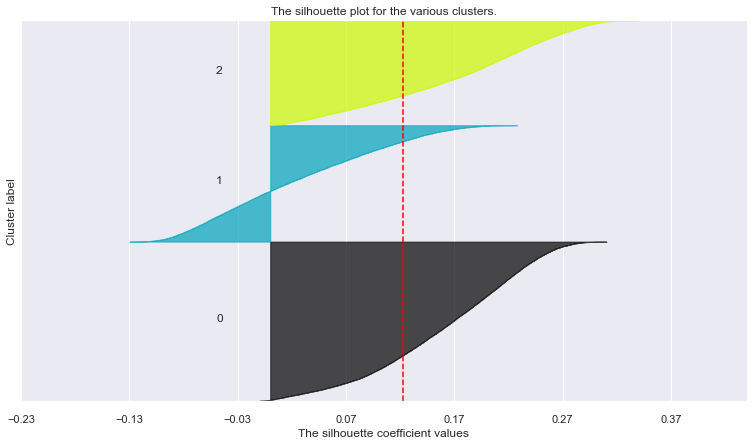

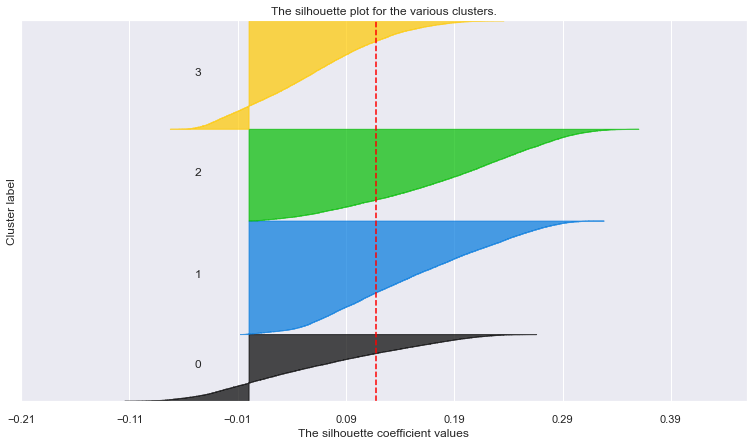

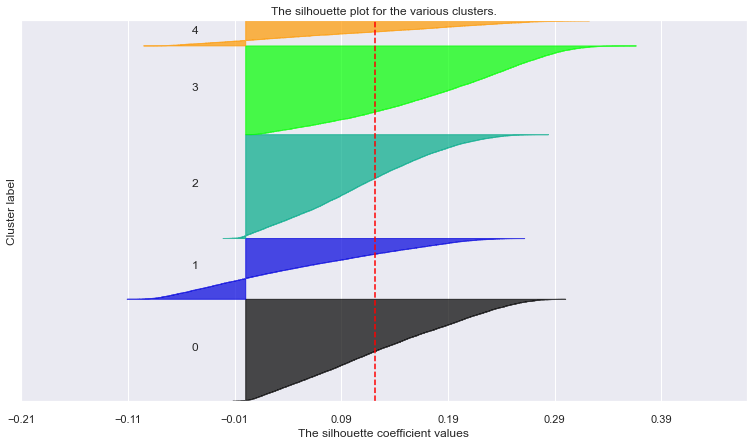

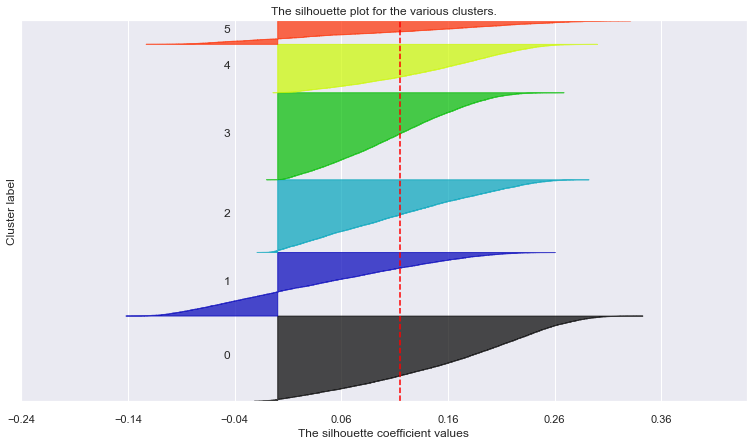

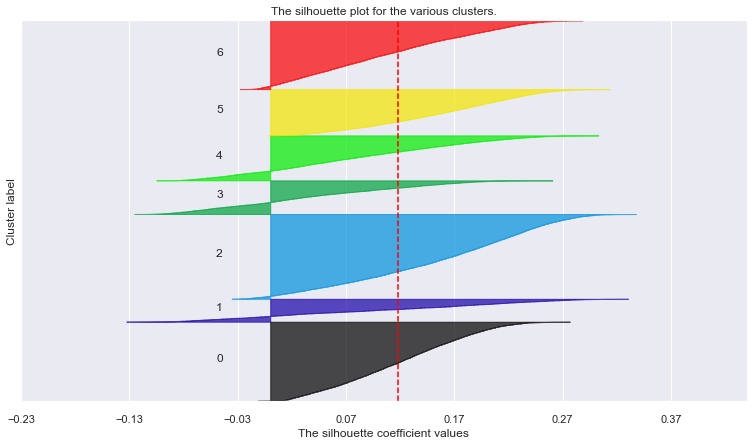

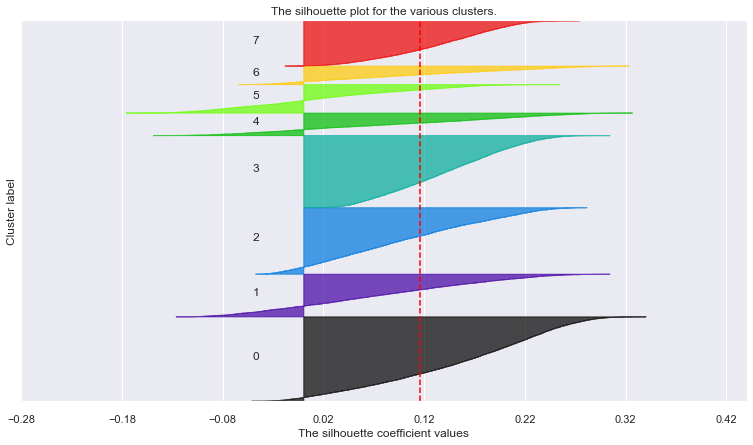

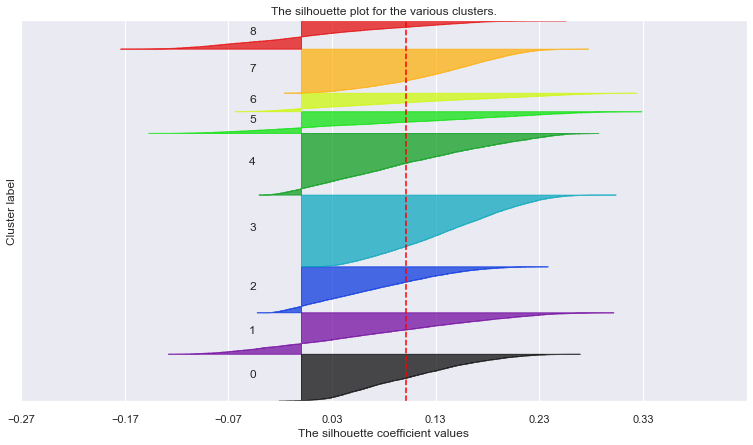

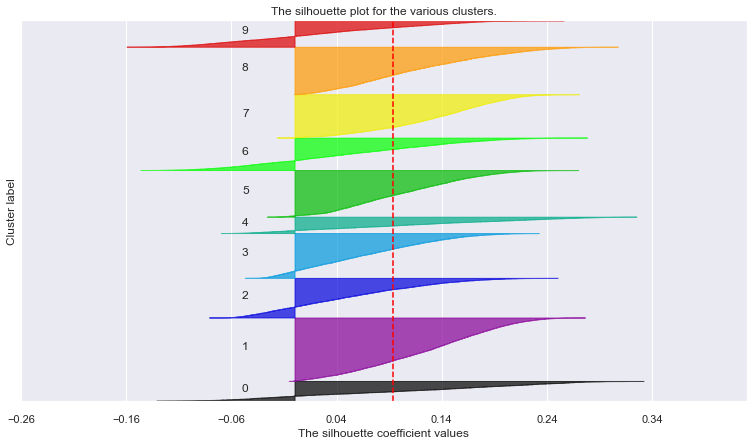

In [147]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_cen)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_cen, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_cen, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_cen) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

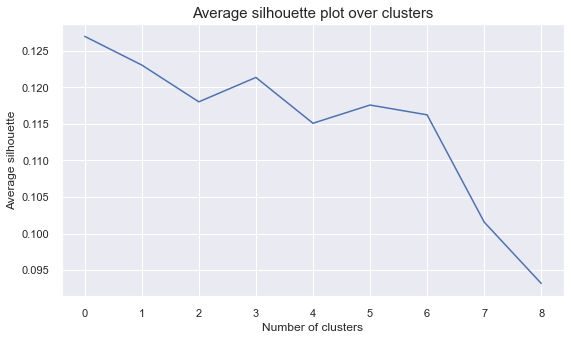

In [148]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#3-5

In [149]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_cen,3)
kmeans_cen_df = df_cen.copy()
kmeans_cen_df["kmeans_cen_labels"] = clust_labels

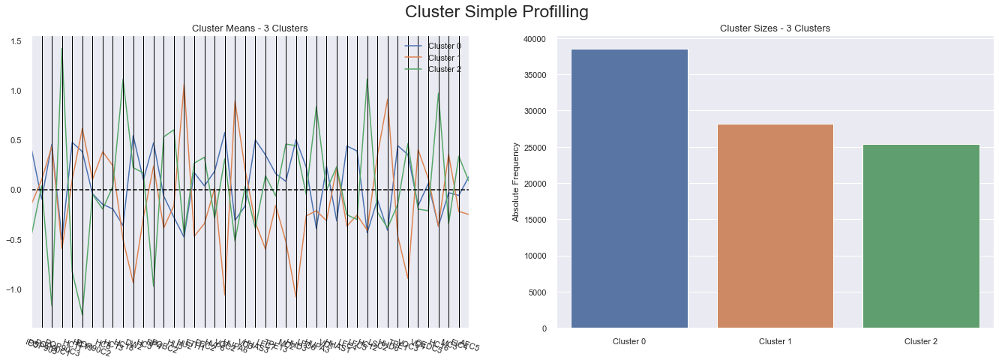

In [150]:
cluster_profiles(kmeans_cen_df, ["kmeans_cen_labels"], figsize=(23, 7))

In [151]:
#R2 score

r2(kmeans_cen_df, ["kmeans_cen_labels"])

0.22250945770435626

In [152]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values()

POP90C2    0.004530
POP903     0.007169
OEDC5      0.017790
TPE13      0.019734
VC3        0.023568
AFC5       0.028202
HC13       0.033661
HC5        0.035913
HVP6       0.036676
LFC6       0.043721
EIC4       0.047449
VC1        0.053110
LSC2       0.054261
HC8        0.064382
PEC2       0.065613
MC3        0.071145
VC4        0.071191
HHAS1      0.071544
ETH1       0.098994
LFC5       0.108053
POBC2      0.124921
IC5        0.134850
LFC4       0.139155
HU5        0.139916
MC2        0.143785
TPE1       0.154175
LFC7       0.166017
HHAS3      0.179379
HUPA3      0.269856
HC11       0.283883
VOC3       0.356207
HC16       0.357371
HUPA6      0.358980
HHD6       0.363534
RP4        0.370685
DW2        0.403609
HC12       0.470592
HC18       0.472597
HU2        0.494442
VOC2       0.508220
HHD3       0.516305
POP90C1    0.520212
HC19       0.613182
POP90C3    0.768229
dtype: float64

With this cluster we were able to see the most important variables for census segmentation. We will only keep the variables that have an R2 score above 0.45. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [282]:
census = r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values().tail(8).index.to_list()

In [283]:
census    

['HC12', 'HC18', 'HU2', 'VOC2', 'HHD3', 'POP90C1', 'HC19', 'POP90C3']


<a class="anchor" id="most_imp_cl">
   
<font size="6"><span style='color: LightSkyBlue  '> **4.4. Clustering with the most important features**  </span></font>
    
</a>

In [155]:
df_dem

,AGE,NUMCHLD,GENDER,INCOME
CONTROLN,,,,
95515,0.063863,-0.360505,-0.863044,-0.480438
148535,-0.961481,1.301924,0.821556,1.319856
15078,0.132219,-0.360505,0.821556,-0.480438
172556,0.679069,-0.360505,-0.863044,-1.680634
7112,1.225919,1.301924,-0.863044,-0.480438
...,...,...,...,...
184568,0.132219,-0.360505,0.821556,-0.480438
122706,-0.824768,1.301924,0.821556,1.919954
189641,-0.004493,-0.360505,0.821556,-0.480438


In [236]:
#will only keep the most interesting variables for our analysis
census1 = ['POP90C1', 'HU2','HHD3','VOC2']
df_cen2 = df_cen[census1] 
df_cen2

,POP90C1,HU2,HHD3,VOC2
CONTROLN,,,,
95515,-1.247835,-0.754884,0.700300,0.893707
148535,0.844133,-1.240352,1.879593,1.731449
15078,-1.247835,-0.366509,0.372718,0.223513
172556,-1.247835,1.089897,0.110653,-1.005177
7112,0.844133,-0.949071,-0.675542,-0.893478
...,...,...,...,...
184568,0.844133,0.701522,-0.216928,-0.055735
122706,0.780740,-0.851977,1.683044,1.284653
189641,0.844133,0.216054,-1.068640,-1.061026


In [157]:
df_sum2= df_sum[summ]
df_sum2

,MAXRDATE,MINRAMNT,RFA_2A,RFA_2F,MINRDATE,CARDGIFT,NEXTDATE
CONTROLN,,,,,,,
95515,0.447965,-0.360991,-0.976268,1.958750,0.123775,1.991466,0.713837
148535,-0.628392,0.256644,1.405044,0.088856,-0.315819,-0.895769,-0.983859
15078,1.382526,-0.731572,-0.976268,1.958750,0.406519,1.991466,0.434088
172556,0.008076,-0.731572,-0.976268,1.958750,1.914143,0.436801,1.491834
7112,-0.678343,-0.608045,0.214388,0.088856,-0.315819,0.658896,3.996782
...,...,...,...,...,...,...,...
184568,-0.728294,2.109548,1.405044,-0.846091,-1.196041,-1.117864,-1.248067
122706,-0.775022,1.491913,0.214388,-0.846091,-1.225966,-1.117864,-1.160302
189641,-0.090214,-0.608045,-0.976268,1.023803,-1.225966,-0.229484,-0.901580


<hr>
<a class="anchor" id="k_means">
    
<font size="6"><span style='color: LightSkyBlue'> **4.5. K-Means**  </span></font>
    
</a>


<a class="anchor" id="k_dem">
   
<font size="4"><span style='color: PowderBlue '> **4.5.1. Demographic Features**  </span></font>
    
</a>

In [160]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_dem, 3)
kmeans_dem2_df = df_dem.copy()
kmeans_dem2_df["kmeans_dem2_labels"] = clust_labels

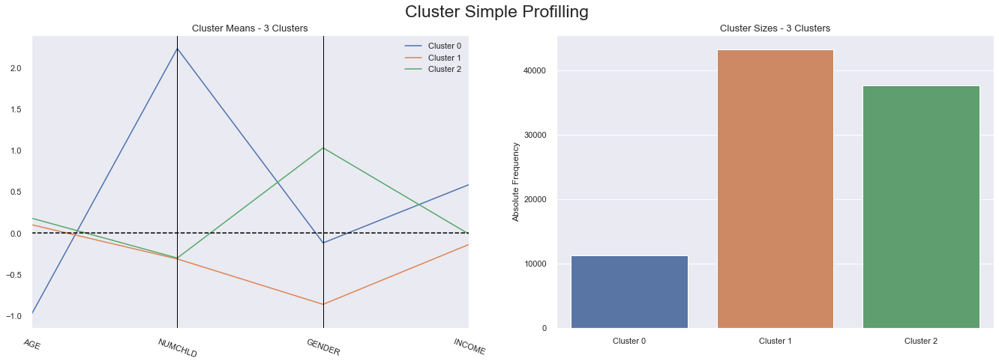

In [161]:
cluster_profiles(kmeans_dem2_df, ["kmeans_dem2_labels"], figsize=(23, 7))

Cluster 0 -> young group of people, highest number of children, mixed group of female and male people and highest bound of income 

Cluster 1 -> middle group in terms of age, mixed group of people with and without kids, female, slightly below the other groups in terms of income

Cluster 2 -> oldest group in terms of age but still a big mix in terms of age, mixed group of people with and without kids, male and has middle group in terms of income.


In [162]:
#R2 score

r2(kmeans_dem2_df, ["kmeans_dem2_labels"])

0.473793664509504

In [163]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_dem2_df, ['kmeans_dem2_labels']).drop('kmeans_dem2_labels').sort_values()

INCOME     0.050730
AGE        0.135925
NUMCHLD    0.689224
GENDER     0.783533
dtype: float64

<a class="anchor" id="k_cen">
   
<font size="4"><span style='color: PowderBlue '> **4.5.2. Census Features**  </span></font>
    
</a>

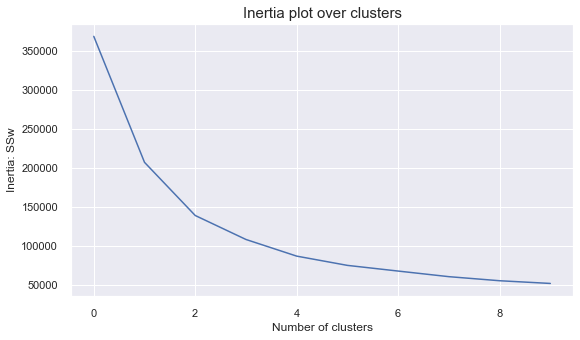

In [237]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_cen2)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

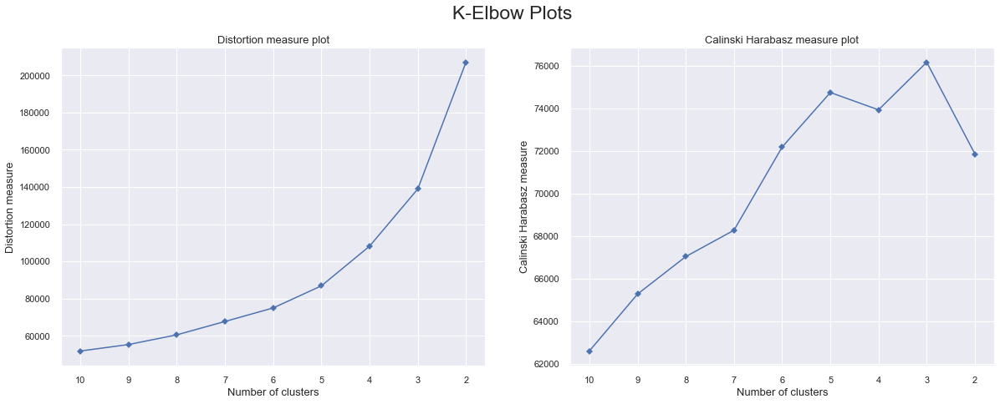

In [238]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=10, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen2)

For n_clusters = 2, the average silhouette_score is : 0.4301097323691215
For n_clusters = 3, the average silhouette_score is : 0.468008371552062
For n_clusters = 4, the average silhouette_score is : 0.5003045902272547
For n_clusters = 5, the average silhouette_score is : 0.46616100074417727


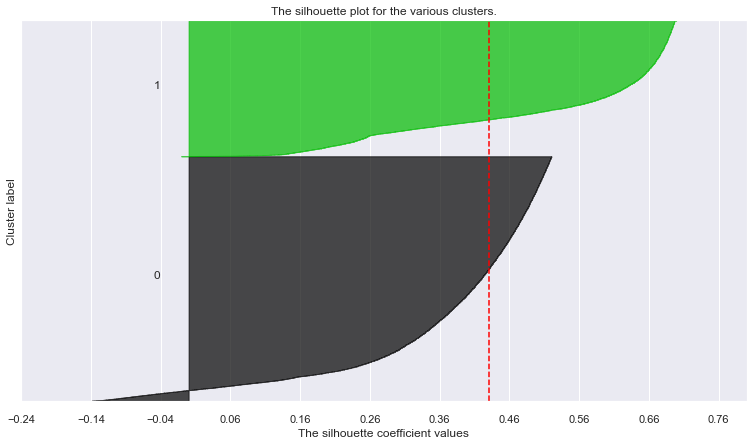

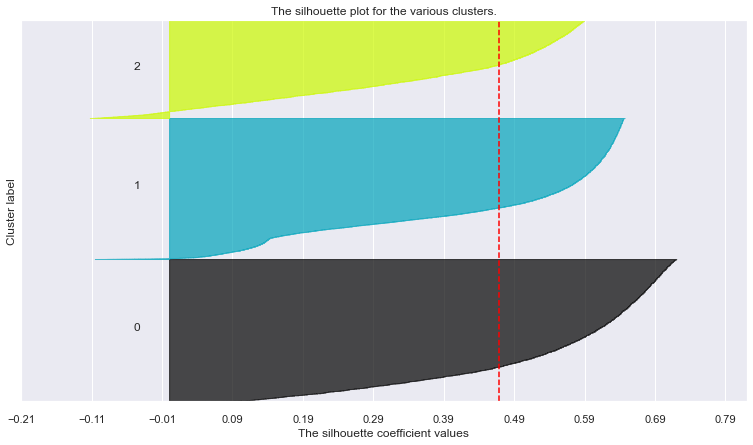

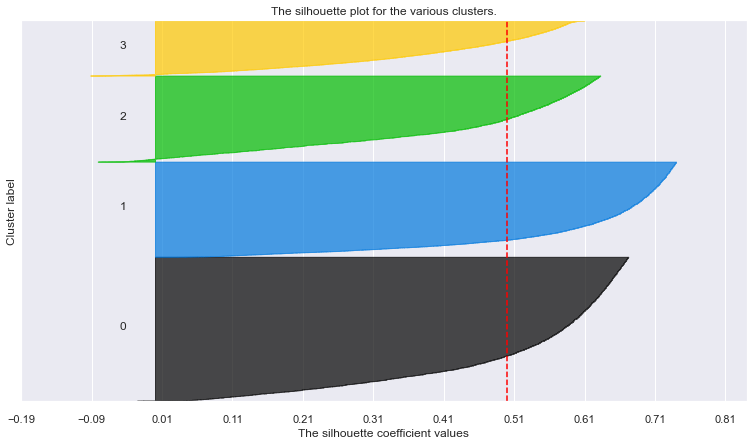

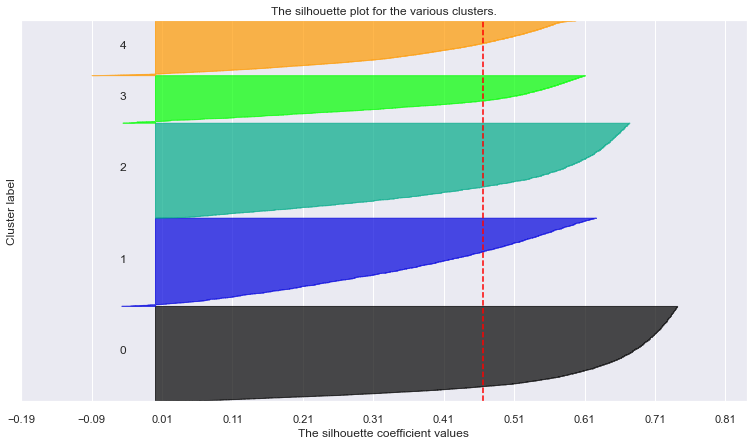

In [187]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_cen2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_cen2, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_cen2, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_cen2) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))
    
#

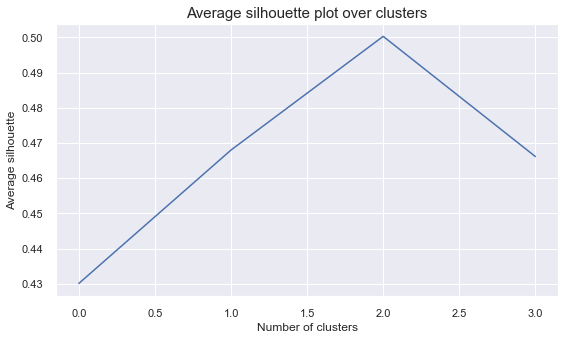

In [188]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [240]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_cen2, 3)
kmeans_cen2_df = df_cen2.copy()
kmeans_cen2_df["kmeans_cen2_labels"] = clust_labels

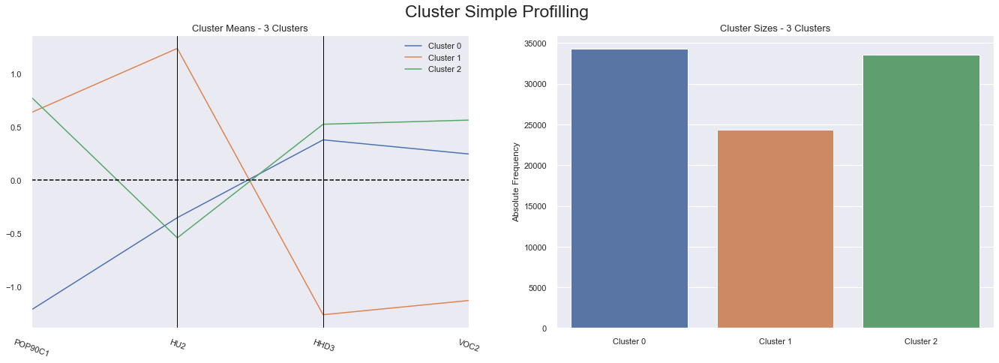

In [241]:
cluster_profiles(kmeans_cen2_df, ["kmeans_cen2_labels"], figsize=(23, 7))

Cluster 0 -> live in non urban area, low percentage of renter occupied units, a lot of Married Couple Families, live in an area where low percentage of houselholds have more than 2 cars

Cluster 2 -> live in urban area, very high percentage of renter occupied units, almost no Married Couple Families, live in an area where houselholds have less than 2 cars

Cluster 1 -> live in urban area, low percentage of renter occupied units, a lot of Married Couple Families, group in which a lot of houselholds have more than 2 cars


In [244]:
#R2 score

r2(kmeans_cen2_df, ["kmeans_cen2_labels"])

0.6817094765179972

In [245]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen2_df, ['kmeans_cen2_labels']).drop('kmeans_cen2_labels').sort_values()

VOC2       0.476594
HU2        0.558646
HHD3       0.576815
POP90C1    0.880542
dtype: float64

<a class="anchor" id="k_sum">
   
<font size="4"><span style='color: PowderBlue '> **4.5.3. Summary Features**  </span></font>
    
</a>

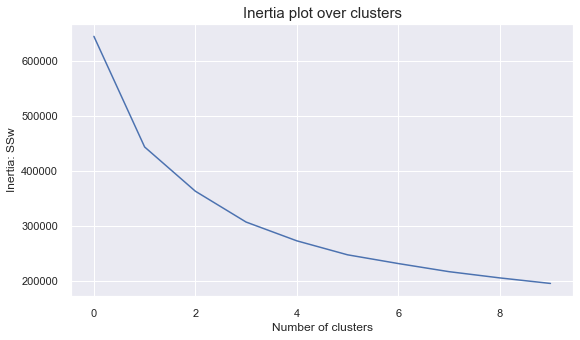

In [175]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_sum2)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

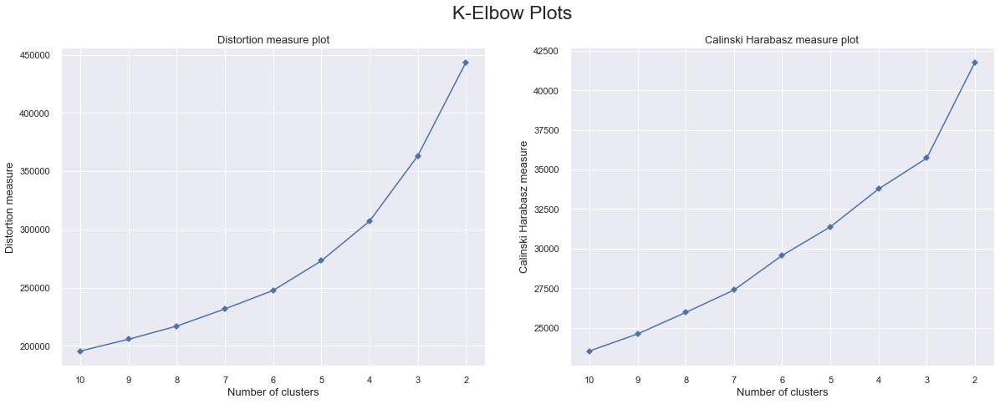

In [176]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_sum2)

For n_clusters = 2, the average silhouette_score is : 0.3681781646971131
For n_clusters = 3, the average silhouette_score is : 0.36407139515462694
For n_clusters = 4, the average silhouette_score is : 0.3343852990537593
For n_clusters = 5, the average silhouette_score is : 0.31830629200398625


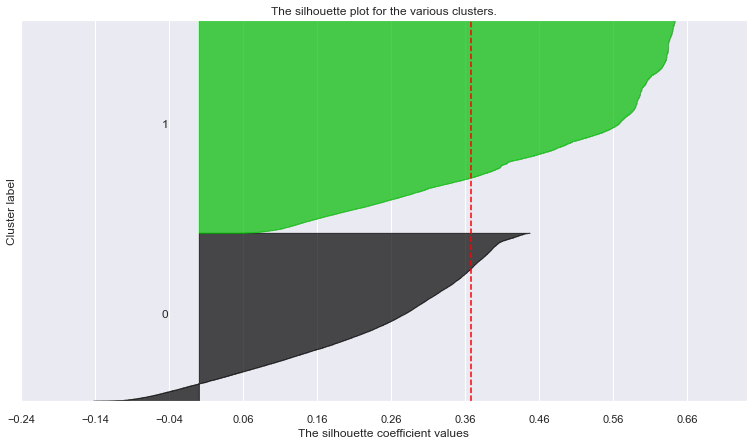

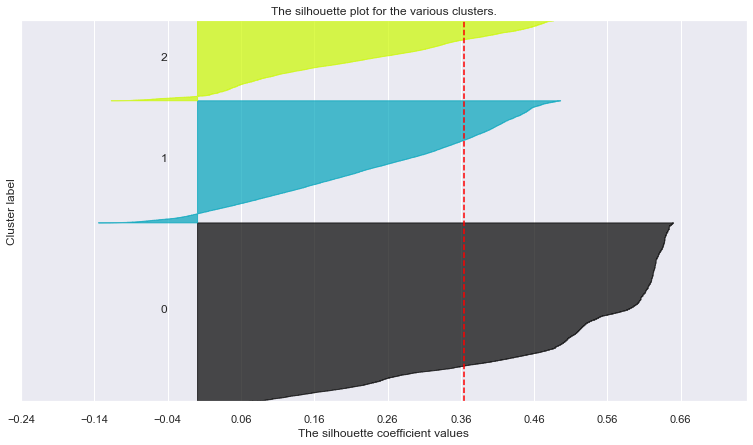

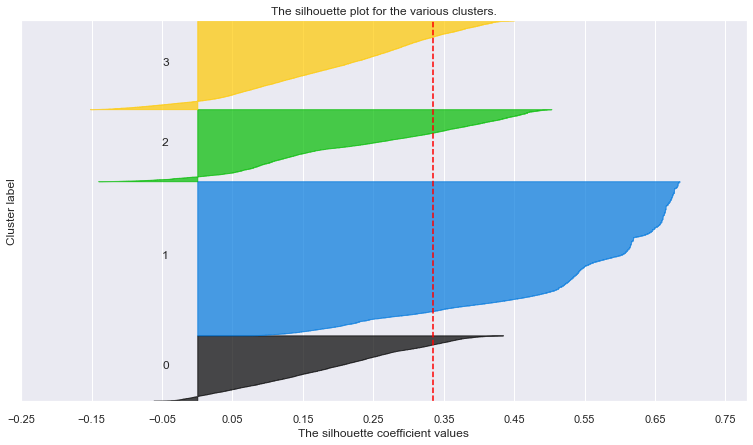

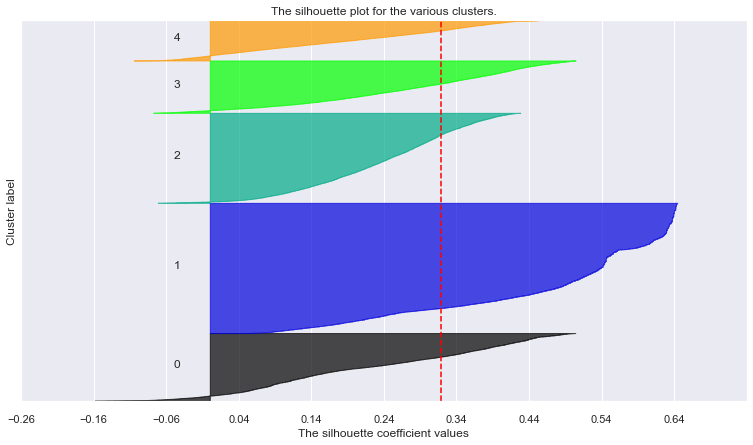

In [195]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_sum2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_sum2, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_sum2, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_sum2) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

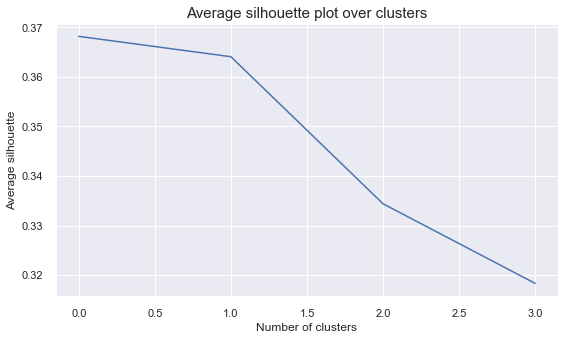

In [196]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#3 ou 4

In [183]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum2, 3)
kmeans_sum2_df = df_sum2.copy()
kmeans_sum2_df["kmeans_sum2_labels"] = clust_labels

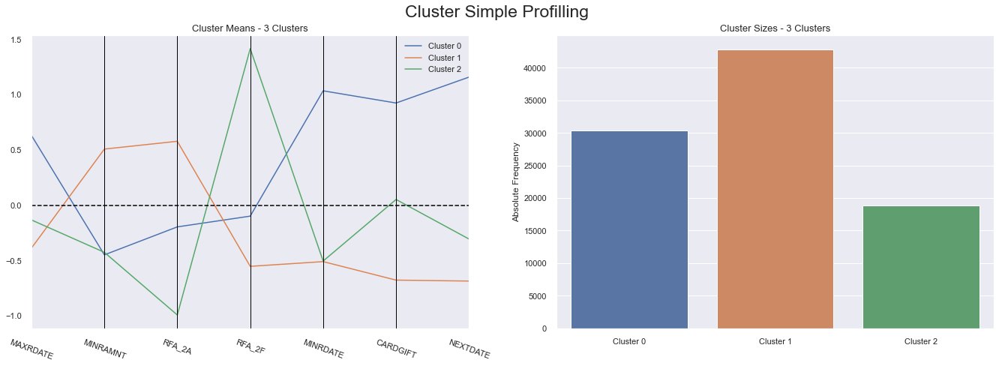

In [184]:
cluster_profiles(kmeans_sum2_df, ["kmeans_sum2_labels"], figsize=(23, 7))

Cluster 0 -> date associated with the largest gift to date done longest time ago, spent the least in the smallest gift to date,
middle group of spending in the last promotion (RFA_2), middle group of donations done in the last promotion(RFA_2), date associated with the smallest gift to date was done the longest time ago, gave the biggest number of card promotions to date, took the longest to give the second donation after the first one


ACABAR


Cluster 1 -> date associated with the largest gift to date done the most recent, spent the most in the smallest gift to date, spent the most in the last promotion (RFA_2), gave the least amount of donations in the last promotion(RFA_2), last position with the highest number of lifetime gifts to card promotions to date, group with no PEP star RFA status



Cluster 2 -> spent the most in the largest gift to date, spent the most money in the most recent gift, highest average dollar amount of gifts to date, middle group of date of second gift, second position with the highest number of lifetime gifts to card promotions to date, mixed group with PEP star RFA status

out:'spent the most money in all the lifetime gifts to date, spent the most money in the last promotion (RFA_2), '

In [179]:
#R2 score

r2(kmeans_sum2_df, ["kmeans_sum2_labels"])

0.4756498487127889

In [180]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_sum2_df, ['kmeans_sum2_labels']).drop('kmeans_sum2_labels').sort_values()

MAXRDATE    0.204869
MINRAMNT    0.223543
RFA_2A      0.369978
CARDGIFT    0.495663
MINRDATE    0.526326
RFA_2F      0.556206
NEXTDATE    0.680630
dtype: float64

<a class="anchor" id="final_cat">
   
<font size="4"><span style='color: PowderBlue '> **4.5.4. Visualize Category Final Dataframes**  </span></font>
    
</a>

In [185]:
df_dem

,AGE,NUMCHLD,GENDER,INCOME
CONTROLN,,,,
95515,0.063863,-0.360505,-0.863044,-0.480438
148535,-0.961481,1.301924,0.821556,1.319856
15078,0.132219,-0.360505,0.821556,-0.480438
172556,0.679069,-0.360505,-0.863044,-1.680634
7112,1.225919,1.301924,-0.863044,-0.480438
...,...,...,...,...
184568,0.132219,-0.360505,0.821556,-0.480438
122706,-0.824768,1.301924,0.821556,1.919954
189641,-0.004493,-0.360505,0.821556,-0.480438


In [186]:
df_sum2

,MAXRDATE,MINRAMNT,RFA_2A,RFA_2F,MINRDATE,CARDGIFT,NEXTDATE
CONTROLN,,,,,,,
95515,0.447965,-0.360991,-0.976268,1.958750,0.123775,1.991466,0.713837
148535,-0.628392,0.256644,1.405044,0.088856,-0.315819,-0.895769,-0.983859
15078,1.382526,-0.731572,-0.976268,1.958750,0.406519,1.991466,0.434088
172556,0.008076,-0.731572,-0.976268,1.958750,1.914143,0.436801,1.491834
7112,-0.678343,-0.608045,0.214388,0.088856,-0.315819,0.658896,3.996782
...,...,...,...,...,...,...,...
184568,-0.728294,2.109548,1.405044,-0.846091,-1.196041,-1.117864,-1.248067
122706,-0.775022,1.491913,0.214388,-0.846091,-1.225966,-1.117864,-1.160302
189641,-0.090214,-0.608045,-0.976268,1.023803,-1.225966,-0.229484,-0.901580


In [187]:
df_cen2

,POP90C1,HU2,HHD3,POP90C3
CONTROLN,,,,
95515,-1.247835,-0.754884,0.700300,0.960233
148535,0.844133,-1.240352,1.879593,-0.658082
15078,-1.247835,-0.366509,0.372718,1.781840
172556,-1.247835,1.089897,0.110653,1.632457
7112,0.844133,-0.949071,-0.675542,-0.658082
...,...,...,...,...
184568,0.844133,0.701522,-0.216928,-0.658082
122706,0.780740,-0.851977,1.683044,-0.558494
189641,0.844133,0.216054,-1.068640,-0.658082


<a class="anchor" id="merge_cat">
   
<font size="4"><span style='color: PowderBlue '> **4.5.5 Merge Categories**  </span></font>
    
</a>

In [246]:
dem_sum = df_dem.merge(df_sum2, on='CONTROLN') 
df_merged_ = dem_sum.merge(df_cen2, on='CONTROLN')
df_merged_

,AGE,NUMCHLD,GENDER,INCOME,MAXRDATE,MINRAMNT,RFA_2A,RFA_2F,MINRDATE,CARDGIFT,NEXTDATE,POP90C1,HU2,HHD3,VOC2
CONTROLN,,,,,,,,,,,,,,,
95515,0.063863,-0.360505,-0.863044,-0.480438,0.447965,-0.360991,-0.976268,1.958750,0.123775,1.991466,0.713837,-1.247835,-0.754884,0.700300,0.893707
148535,-0.961481,1.301924,0.821556,1.319856,-0.628392,0.256644,1.405044,0.088856,-0.315819,-0.895769,-0.983859,0.844133,-1.240352,1.879593,1.731449
15078,0.132219,-0.360505,0.821556,-0.480438,1.382526,-0.731572,-0.976268,1.958750,0.406519,1.991466,0.434088,-1.247835,-0.366509,0.372718,0.223513
172556,0.679069,-0.360505,-0.863044,-1.680634,0.008076,-0.731572,-0.976268,1.958750,1.914143,0.436801,1.491834,-1.247835,1.089897,0.110653,-1.005177
7112,1.225919,1.301924,-0.863044,-0.480438,-0.678343,-0.608045,0.214388,0.088856,-0.315819,0.658896,3.996782,0.844133,-0.949071,-0.675542,-0.893478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.132219,-0.360505,0.821556,-0.480438,-0.728294,2.109548,1.405044,-0.846091,-1.196041,-1.117864,-1.248067,0.844133,0.701522,-0.216928,-0.055735
122706,-0.824768,1.301924,0.821556,1.919954,-0.775022,1.491913,0.214388,-0.846091,-1.225966,-1.117864,-1.160302,0.780740,-0.851977,1.683044,1.284653
189641,-0.004493,-0.360505,0.821556,-0.480438,-0.090214,-0.608045,-0.976268,1.023803,-1.225966,-0.229484,-0.901580,0.844133,0.216054,-1.068640,-1.061026


In [247]:
df_merged_.drop(['GENDER'], axis=1, inplace=True) #gender does not vary much

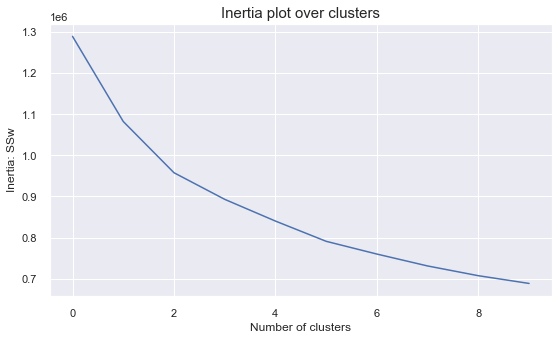

In [248]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_merged_)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

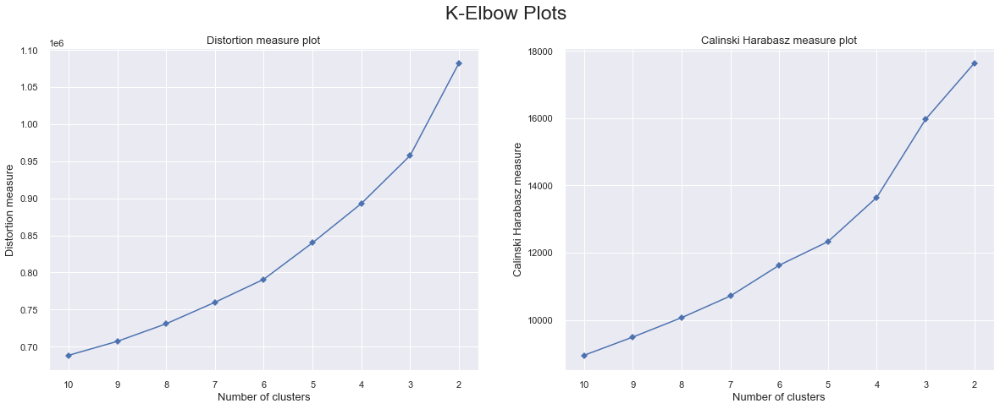

In [249]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_merged_)

For n_clusters = 2, the average silhouette_score is : 0.1247691478741888
For n_clusters = 3, the average silhouette_score is : 0.1262343323269824
For n_clusters = 4, the average silhouette_score is : 0.10091493258198787
For n_clusters = 5, the average silhouette_score is : 0.10609167314496724


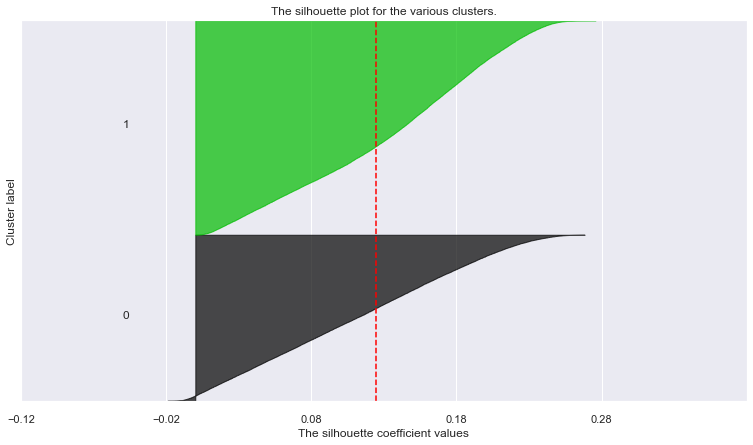

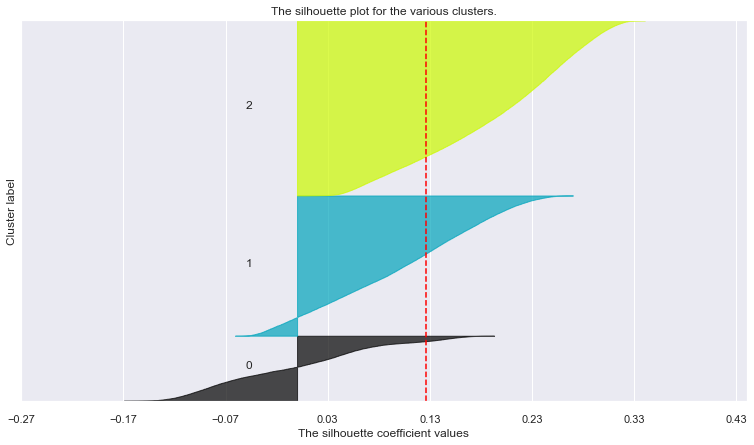

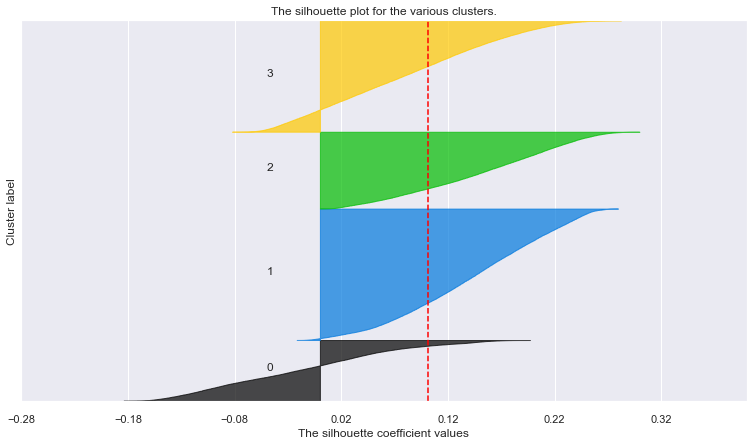

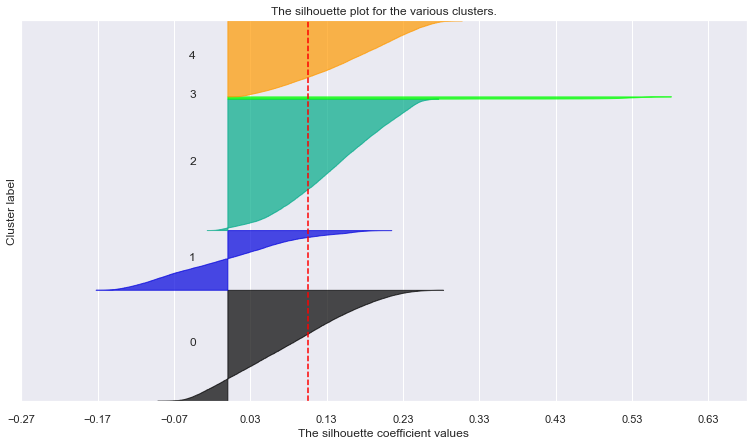

In [116]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_merged_)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_merged_, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_merged_, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_merged_) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

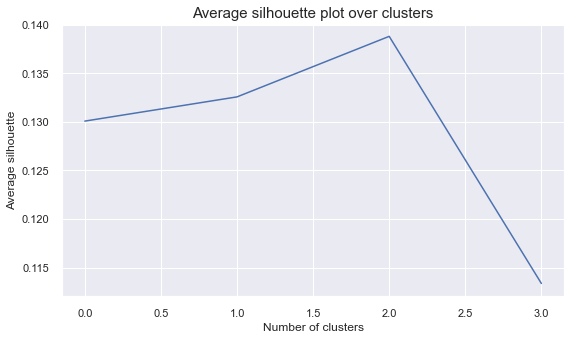

In [216]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [250]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_merged_, 3)
kmeans_merged_df = df_merged_.copy()
kmeans_merged_df["kmeans_merged_labels"] = clust_labels

#com todos do summary segment

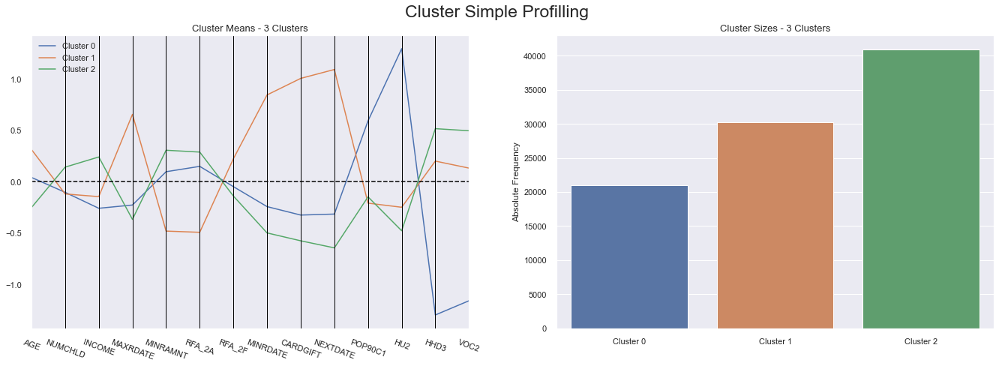

In [251]:
cluster_profiles(kmeans_merged_df, ["kmeans_merged_labels"], figsize=(23, 7))

escrever o novo

Cluster 0 -> group with people in their 30s, not many have kids, lowest bound of income, date associated with the largest gift to date done slightly recent, 


slightly older group of people, with a bit less children, mixed group of people who are homeowners and who are not, slightly comparatively below income, spent the most in all the lifetime gifts to date but spent the least in the last promotion (RFA_2) and in the largest gift to date, leastamount of most recent gift, the least Average dollar amount of gifts to date,the second gift was done the most recent, highest number of lifetime gifts to card promotions to date, every person has PEP star RFA status, most live in an Urbanized Area, mixed people in renter occupied housing units and some live Inside Rural Area, in the neighborhood there is a low Percentage of Married Couple Families.


Cluster 1 -> younger group of people, slightly less people who are homeowners, slightly comparatively below income, spent the second least in all the lifetime gifts to date and spent second the least in the last promotion (RFA_2) and in the largest gift to date, few people have the PEP star RFA status, most do not live in an Urbanized Area, most people do not live in renter occupied housing units and most live Inside Rural Area, in the neighborhood there is a higher Percentage of Married Couple Families.


(least amount of most recent gift, the least Average dollar amount of gifts to date,the second gift was done the most recent, highest number of lifetime gifts to card promotions to date, )



Cluster 2 -> younger group of people, with a bit more children, slightly more people who are homeowners, slightly above income, spent least in all the lifetime gifts to date but spent the most in the last promotion (RFA_2) and in the largest gift to date, least amount of most recent gift, the highest Average dollar amount of gifts to date,the second gift was done the most time ago, lowest number of lifetime gifts to card promotions to date, few people have the PEP star RFA status, most live in an non Urbanized Area, more people live in renter occupied housing units and many people live Inside Rural Areas, in the neighborhood there is a lower Percentage of Married Couple Families.


In all the clusters there is a mix of people from both genders.

In [252]:
#R2 score

r2(kmeans_merged_df, ["kmeans_merged_labels"])



0.28911679181953553

In [253]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_merged_df, ['kmeans_merged_labels']).drop('kmeans_merged_labels').sort_values()

NUMCHLD     0.016008
RFA_2F      0.025609
INCOME      0.047890
AGE         0.060803
POP90C1     0.103509
MINRAMNT    0.119673
RFA_2A      0.121640
MAXRDATE    0.212300
MINRDATE    0.357849
VOC2        0.420284
CARDGIFT    0.502829
HU2         0.502875
HHD3        0.514104
NEXTDATE    0.598197
dtype: float64

In the rest of the notebook, we continued the exploration of the whole dataset with the most important variables. Although, there is a better r2 score with DBSCAN, this is due to having more clusters (5 instead of 3). From all the clusters explored, we found that kmeans is the best one for our dataset. 


GMM and DBSCAN both produce worse solutions since we obtain clusters with more similar average behaviour. For example, in the GMM clustering, in terms of Percentage of Population in Urbanized Area the 3 clusters lines are more near each other in the GMM than in the K-means solution. In the DBSCAN clustering, we can see that cluster 1 and cluster 3 don't appear to have any particular behaviour, since the cluster line overlap each other in many of the variables.


By analyzing the K-means solution, we can see that the variables that provide more discriminant behaviours across the clusters are Percentage of Population in Urbanized Area, Percent Population Inside Rural Area, PEP Star RFA Status and  Number of lifetime gifts to card promotions to date, suggesting that the customers differ mainly according to the historical behaviour with donations and where they live. 




# "
Furthermore, we can see (cluster 2) that there's a clear relationship between the year_salary and the product behaviour: people that earn less, invest mainly in the LOBs household, life and work_comp (and don't spend in motor). Besides, these customers are the ones that spend the highest proportion of their salary in premiums (t_premiums_salary) and the ones that have higher customer monetary value (cmv), making them a very important segment, despite their small size.

We can also identify a segment (cluster 1) of customers that spend a lot in motor and in nothing else. Finally, cluster 0 are the customers that spend the most in health, have the highest salary and are averse to spending money in motor."

<hr>
<a class="anchor" id="dt">
    
<font size="6"><span style='color: LightSkyBlue '> **4.6. Decision Tree**  </span></font>
    
</a>


In [254]:
# Preparing the data
X = kmeans_merged_df.drop(columns=['kmeans_merged_labels'])
y = kmeans_merged_df.kmeans_merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 86.29% of the customers correctly


In [255]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

AGE         0.000000
NUMCHLD     0.000000
INCOME      0.000000
MAXRDATE    0.000000
MINRAMNT    0.000000
RFA_2A      0.000000
RFA_2F      0.000000
MINRDATE    0.000000
CARDGIFT    0.087770
NEXTDATE    0.463138
POP90C1     0.000000
HU2         0.016480
HHD3        0.432612
VOC2        0.000000
dtype: float64

run ['dot.bat', '-Tsvg']


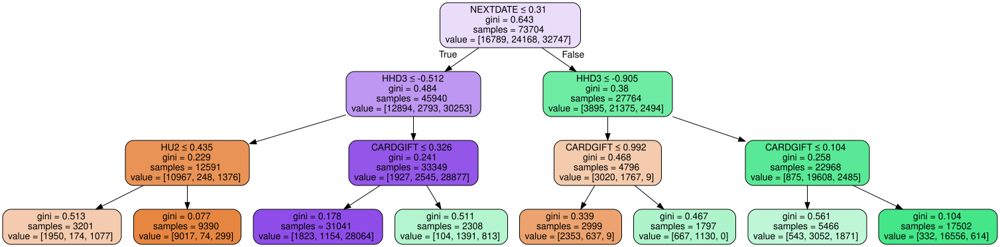

In [257]:
# Visualizing the decision tree
dot_data = export_graphviz(dt, out_file=None, 
                           feature_names=X.columns.to_list(),
                           filled=True,
                           rounded=True,
                           special_characters=True)  
graphviz.Source(dot_data)

<hr>
<a class="anchor" id="out_class">
    
<font size="6"><span style='color: LightSkyBlue '> **4.7. Classification of Outliers**  </span></font>
    
</a>
Even though we believe some of the outliers we spotted previously can be truly aberrant observations, we will proceed to classify them according to the final concatenated cluster. For this task we will resort to a simple decision tree which allows us to easily classify the outliers.

This classifier will also provide a useful tool for the future, as a set of rules can be extracted that helps understand why customers belong to a certain cluster. With this information, we can easily classify future customers by making simple queries to the database. This will allow a more personalized service to each future customer which can be dynamically adapted (a customer can belong to different clusters across time).

In [258]:
df_out= df_outliers[kmeans_merged_df.drop(columns=['kmeans_merged_labels']).columns]
df_out

#tem de se correr tudo duma vez

,AGE,NUMCHLD,INCOME,MAXRDATE,MINRAMNT,RFA_2A,RFA_2F,MINRDATE,CARDGIFT,NEXTDATE,POP90C1,HU2,HHD3,VOC2
CONTROLN,,,,,,,,,,,,,,
190166,NaN,0.0,NaN,944.0,25.0,3,1,1491.0,2,1491.0,34,27,73,76
137726,NaN,0.0,2.0,730.0,23.0,2,1,730.0,1,NaN,99,99,86,59
35239,44.0,2.0,5.0,1005.0,3.0,0,4,761.0,4,1126.0,99,34,43,49
54795,37.0,0.0,4.0,975.0,3.0,0,4,1460.0,7,1370.0,0,17,59,46
87813,NaN,0.0,NaN,822.0,15.0,2,1,822.0,0,NaN,99,30,40,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108257,56.0,0.0,5.0,944.0,3.0,2,3,1126.0,2,2191.0,99,15,51,46
6569,33.0,0.0,1.0,761.0,5.0,1,3,1825.0,7,1825.0,85,76,49,23
6648,71.0,0.0,6.0,2862.0,10.0,3,1,2283.0,4,3286.0,99,99,96,77


In [259]:
#Firstly, to be able to predict the outliers, data needs to be imputed to the nan values and, 
#then, it needs to be standardized.

imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_out[df_out.columns])
df_out[df_out.columns] = df_complete

df_out.reset_index(inplace=True)
out = df_out.columns.to_list()
out.remove('CONTROLN')

scaler = StandardScaler()
df_out[out] = pd.DataFrame(scaler.fit_transform(df_out[out]), columns = out)

df_out.set_index(['CONTROLN'],inplace=True) 

df_out

,AGE,NUMCHLD,INCOME,MAXRDATE,MINRAMNT,RFA_2A,RFA_2F,MINRDATE,CARDGIFT,NEXTDATE,POP90C1,HU2,HHD3,VOC2
CONTROLN,,,,,,,,,,,,,,
190166,-0.193988,-0.332905,0.466050,-0.355693,0.418622,1.323695,-0.955968,-0.293431,-0.702668,-0.559958,-0.462515,-0.366668,0.672029,0.816275
137726,-0.334279,-0.332905,-0.902071,-0.689533,0.364546,0.297565,-0.955968,-1.079050,-0.899374,-1.040054,0.888829,1.741719,1.201401,0.208958
35239,-1.021855,3.337442,0.835696,-0.260533,-0.176209,-1.754697,1.497222,-1.047047,-0.309256,-0.897272,0.888829,-0.161686,-0.549601,-0.148287
54795,-1.486613,-0.332905,0.256441,-0.307333,-0.176209,-1.754697,1.497222,-0.325434,0.280863,-0.671780,-1.169372,-0.659499,0.101935,-0.255461
87813,-0.299799,-0.332905,0.063434,-0.546013,0.148244,0.297565,-0.955968,-0.984074,-1.096080,-0.949579,0.888829,-0.278818,-0.671764,-0.326910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108257,-0.225127,-0.332905,0.835696,-0.355693,-0.176209,0.297565,0.679492,-0.670239,-0.702668,0.086944,0.888829,-0.718066,-0.223833,-0.255461
6569,-1.752189,-0.332905,-1.481327,-0.641173,-0.122133,-0.728566,0.679492,0.051375,0.280863,-0.251293,0.597771,1.068207,-0.305275,-1.077125
6648,0.770783,-0.332905,1.414952,2.636392,0.013055,1.323695,-0.955968,0.524192,-0.309256,1.098884,0.888829,1.741719,1.608611,0.852000


In [260]:
# Predicting the cluster labels of the outliers
df_out['merged_labels'] = dt.predict(df_out)
df_out.head()


,AGE,NUMCHLD,INCOME,MAXRDATE,MINRAMNT,RFA_2A,RFA_2F,MINRDATE,CARDGIFT,NEXTDATE,POP90C1,HU2,HHD3,VOC2,merged_labels
CONTROLN,,,,,,,,,,,,,,,
190166,-0.193988,-0.332905,0.466050,-0.355693,0.418622,1.323695,-0.955968,-0.293431,-0.702668,-0.559958,-0.462515,-0.366668,0.672029,0.816275,2
137726,-0.334279,-0.332905,-0.902071,-0.689533,0.364546,0.297565,-0.955968,-1.079050,-0.899374,-1.040054,0.888829,1.741719,1.201401,0.208958,2
35239,-1.021855,3.337442,0.835696,-0.260533,-0.176209,-1.754697,1.497222,-1.047047,-0.309256,-0.897272,0.888829,-0.161686,-0.549601,-0.148287,0
54795,-1.486613,-0.332905,0.256441,-0.307333,-0.176209,-1.754697,1.497222,-0.325434,0.280863,-0.671780,-1.169372,-0.659499,0.101935,-0.255461,2
87813,-0.299799,-0.332905,0.063434,-0.546013,0.148244,0.297565,-0.955968,-0.984074,-1.096080,-0.949579,0.888829,-0.278818,-0.671764,-0.326910,0



<hr>
<a class="anchor" id="t_sne">
    
<font size="6"><span style='color: LightSkyBlue '> **4.8. Cluster visualization using t-SNE**  </span></font>
    
</a>

Different values for perplexity were explored, finding that a value of 10 gave the best results. Below it can be seen with the default value and with the parameter fixed.

In [ ]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42, n_jobs=-1).fit_transform(kmeans_merged_df.drop(columns=['kmeans_merged_labels']))   

#-1 mais rapido 

In [279]:
kmeans_merged_df  # tiago tinha todas do ultimo census

,AGE,NUMCHLD,INCOME,MAXRDATE,MINRAMNT,RFA_2A,RFA_2F,MINRDATE,CARDGIFT,NEXTDATE,POP90C1,HU2,HHD3,VOC2,kmeans_merged_labels
CONTROLN,,,,,,,,,,,,,,,
95515,0.063863,-0.360505,-0.480438,0.447965,-0.360991,-0.976268,1.958750,0.123775,1.991466,0.713837,-1.247835,-0.754884,0.700300,0.893707,1
148535,-0.961481,1.301924,1.319856,-0.628392,0.256644,1.405044,0.088856,-0.315819,-0.895769,-0.983859,0.844133,-1.240352,1.879593,1.731449,2
15078,0.132219,-0.360505,-0.480438,1.382526,-0.731572,-0.976268,1.958750,0.406519,1.991466,0.434088,-1.247835,-0.366509,0.372718,0.223513,1
172556,0.679069,-0.360505,-1.680634,0.008076,-0.731572,-0.976268,1.958750,1.914143,0.436801,1.491834,-1.247835,1.089897,0.110653,-1.005177,1
7112,1.225919,1.301924,-0.480438,-0.678343,-0.608045,0.214388,0.088856,-0.315819,0.658896,3.996782,0.844133,-0.949071,-0.675542,-0.893478,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.132219,-0.360505,-0.480438,-0.728294,2.109548,1.405044,-0.846091,-1.196041,-1.117864,-1.248067,0.844133,0.701522,-0.216928,-0.055735,2
122706,-0.824768,1.301924,1.919954,-0.775022,1.491913,0.214388,-0.846091,-1.225966,-1.117864,-1.160302,0.780740,-0.851977,1.683044,1.284653,2
189641,-0.004493,-0.360505,-0.480438,-0.090214,-0.608045,-0.976268,1.023803,-1.225966,-0.229484,-0.901580,0.844133,0.216054,-1.068640,-1.061026,0


locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A9AA5FF748>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A9AA5FF748> on colorbar
Setting pcolormesh
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved


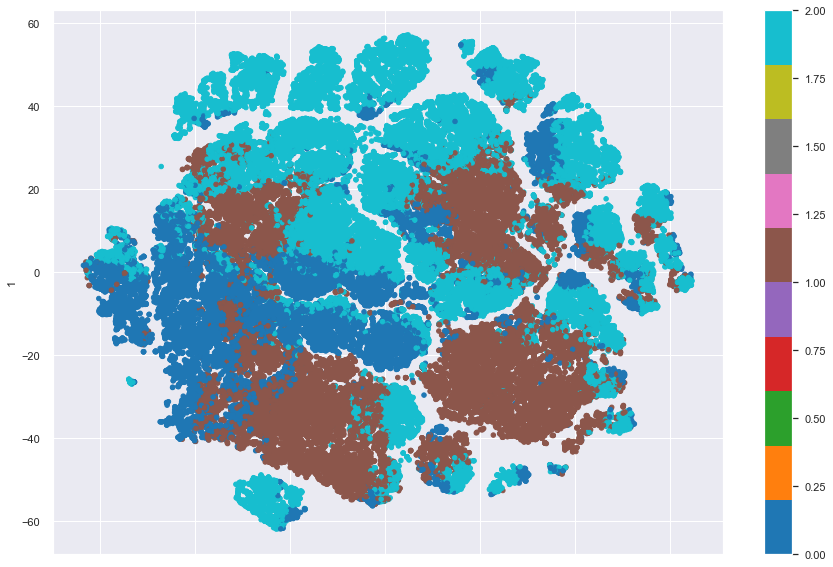

In [263]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=kmeans_merged_df['kmeans_merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

In [293]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42, n_jobs=-1, perplexity=10).fit_transform(kmeans_merged_df.drop(columns=['kmeans_merged_labels']))   

#-1 mais rapido 

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A9A7F64F88>
Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001A9A7F64F88> on colorbar
Setting pcolormesh
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved


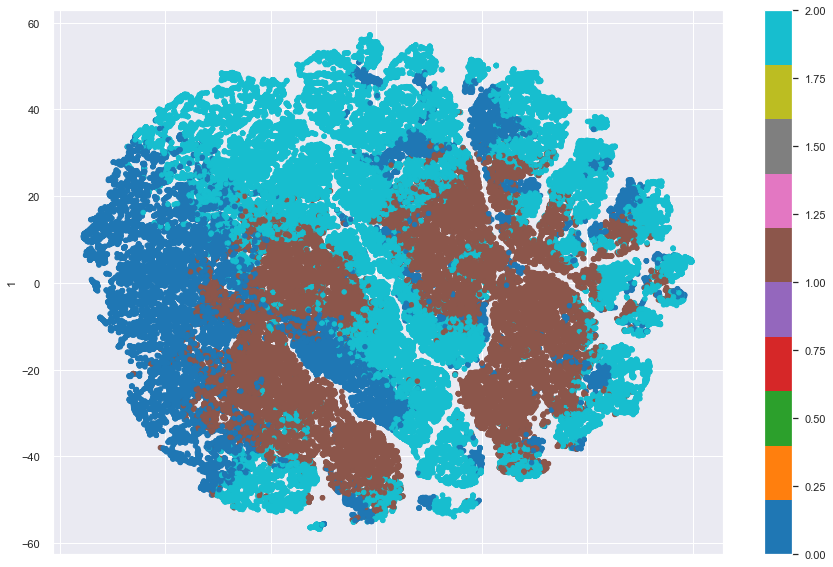

In [294]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=kmeans_merged_df['kmeans_merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

<hr>
<a class="anchor" id="dbscan_noise">
    
<font size="6"><span style='color: LightSkyBlue '> **4.9. DBSCAN (Density-based spatial clustering of applications with noise)**  </span></font>
    
</a>

We've tried with different parameters and the best results, with 3 clusters, can be seen below.

In [264]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=3, min_samples=20, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_merged_)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)



Number of estimated clusters : 3


In [265]:
# Concatenating the labels to df_merged_final
dbscan_merged_df = pd.concat([df_merged_, pd.Series(dbscan_labels, index=df_merged_.index, name="dbscan_labels")], axis=1)
dbscan_merged_df.head()

,AGE,NUMCHLD,INCOME,MAXRDATE,MINRAMNT,RFA_2A,RFA_2F,MINRDATE,CARDGIFT,NEXTDATE,POP90C1,HU2,HHD3,VOC2,dbscan_labels
CONTROLN,,,,,,,,,,,,,,,
95515,0.063863,-0.360505,-0.480438,0.447965,-0.360991,-0.976268,1.958750,0.123775,1.991466,0.713837,-1.247835,-0.754884,0.700300,0.893707,0
148535,-0.961481,1.301924,1.319856,-0.628392,0.256644,1.405044,0.088856,-0.315819,-0.895769,-0.983859,0.844133,-1.240352,1.879593,1.731449,0
15078,0.132219,-0.360505,-0.480438,1.382526,-0.731572,-0.976268,1.958750,0.406519,1.991466,0.434088,-1.247835,-0.366509,0.372718,0.223513,0
172556,0.679069,-0.360505,-1.680634,0.008076,-0.731572,-0.976268,1.958750,1.914143,0.436801,1.491834,-1.247835,1.089897,0.110653,-1.005177,0
7112,1.225919,1.301924,-0.480438,-0.678343,-0.608045,0.214388,0.088856,-0.315819,0.658896,3.996782,0.844133,-0.949071,-0.675542,-0.893478,0


In [266]:
# Computing the R^2 of the cluster solution
df_nonoise = dbscan_merged_df.loc[dbscan_merged_df['dbscan_labels'] != -1]
sst = get_ss(df_merged_)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

#60 com eps=2
#94 com eps=1
#21 com eps=3

Cluster solution with R^2 of 0.0265


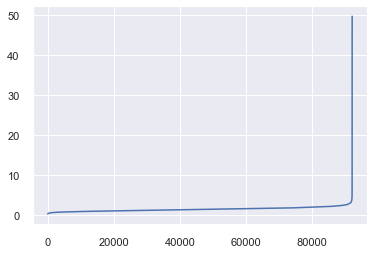

In [222]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20,n_jobs=-1)
neigh.fit(df_merged_)
distances, _ = neigh.kneighbors(df_merged_)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

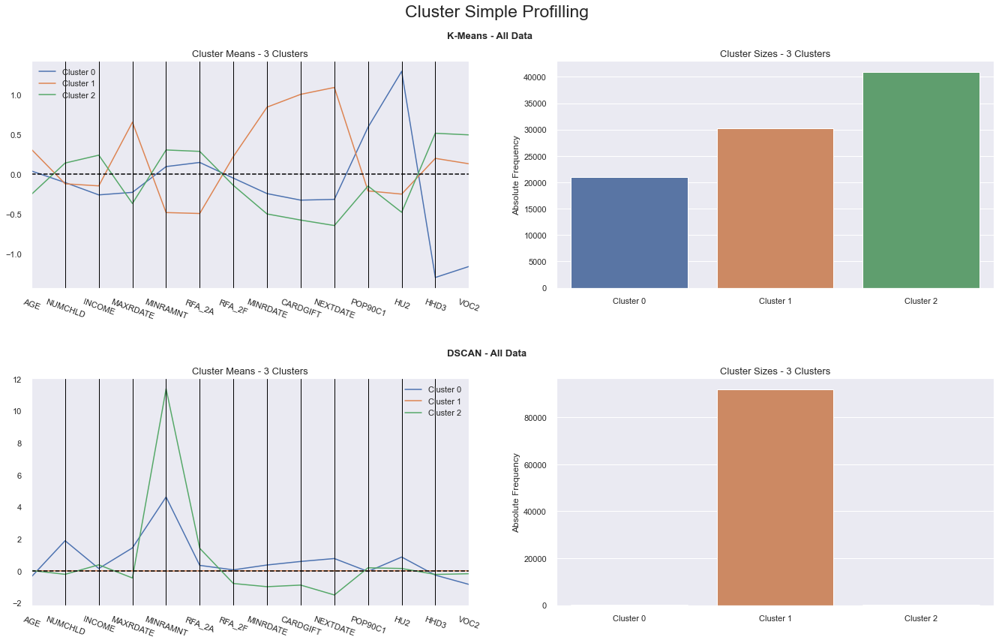

In [267]:
# Comparing both K-means and DBSCAN solutions
dbkm_complete_std_df = kmeans_merged_df.merge(dbscan_merged_df["dbscan_labels"], left_index=True, right_index=True)
cluster_profiles(dbkm_complete_std_df, ["kmeans_merged_labels", "dbscan_labels"], figsize=(23, 13), compar_titles=["K-Means - All Data", "DSCAN - All Data"])

<hr>
<a class="anchor" id="gmm">
    
<font size="6"><span style='color: LightSkyBlue '> **4.10. GMM (Gaussian Mixture Model )**  </span></font>
    
</a>

### Characteristics:
- Assumes the data is generated from a mixture of finite number of Gaussian distributions with unknown parameters
- Use the EM (Expectation Maximization algorithm) to estimate the parameters
- Provides a probability of each observation belonging to each cluster
- Advantages over K-Means:
    - Can deal with spherical and elipsoid cluster shapes
    - Number of components needs to be defined apriori



In [225]:
def comp_gmm_models(df, max_nclus, min_nclus=2):
    """
    This function produces a bar plot for each quality criteria (AIC, BIC) to asses what is the best gmm configuration
    """
    # Data
    n_components_range = range(min_nclus, max_nclus+1)
    cv_types = ['spherical', 'tied', 'diag', 'full'] #values of the covariance type parameter
    bic = np.empty((4, len(n_components_range)))
    aic = np.empty((4, len(n_components_range)))
    for r, cv_type in enumerate(cv_types):
        for c, n_components in enumerate(n_components_range):
            # Fit a Gaussian mixture with EM
            gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
            gmm.fit(df)
            # Save quality measure value
            bic[r, c] = gmm.bic(df)
            aic[r, c] = gmm.aic(df)

    # Traces
    bic = pd.DataFrame(bic, columns=n_components_range, index=cv_types)
    aic = pd.DataFrame(aic, columns=n_components_range, index=cv_types)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(23,7))
    
    sns.barplot(data=bic.reset_index().melt(id_vars="index"),
                x="variable", y="value", hue="index", ax=ax1)
    
    sns.barplot(data=aic.reset_index().melt(id_vars="index"),
                x="variable", y="value", hue="index", ax=ax2)

    # Layout
    ax1.set_xlabel('Number of Components')
    ax2.set_xlabel('Number of Components')
    ax1.set_ylabel('BIC Criteria')
    ax2.set_ylabel('AIC Criteria')
    ax1.legend(title="Covariance Type")
    ax2.legend(title="Covariance Type")
    plt.suptitle('BIC and AIC Scores per Model', fontsize=23)

    plt.show()

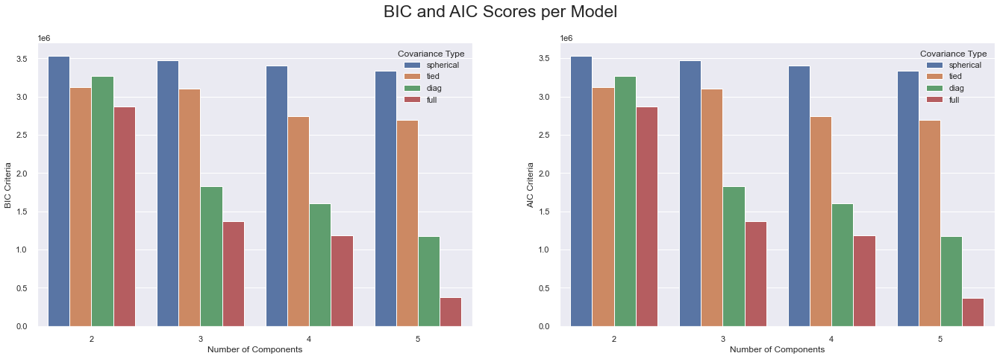

In [226]:
# Use the function built to choose the best GMM configuration
comp_gmm_models(df_merged_, 5)

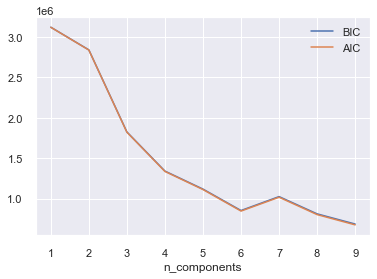

In [272]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 10)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_merged_) #, n_jobs=4
          for n in n_components]

bic_values = [m.bic(df_merged_) for m in models]
aic_values = [m.aic(df_merged_) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

The first step in GMM is to define the parameters to use, such as the number of clusters to retain and the covariancy type to use. In this case, we will do with 3 clusters, following to the graph above.

From the plot above, the covariance type "full" is the best one to use, both in terms of AIC and BIC information criteria (the lower the better), which are measures of the cluster quality. Therefore, from the plot above we conclude that we want to use the "full" Covariance Type in our GMM.

Besides, it is also possible to see how the quality varies according to the number of clusters retained. One can conclude that with more clusters, the quality increases overall, independently of the covariance type (as it would be expected). Therefore, we will perform some further investigation on how many clusters to retain.

In [268]:
#the gmm method was aggregated on a function
def doGMM(df, nclust):
    model=GaussianMixture(n_components=nclust, init_params='kmeans', random_state=0)
    model.fit(df)
    clust_labels = model.predict(df)
    return(clust_labels)

In [269]:
# Performing gmm and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels = doGMM(df_merged_, 5)
gmm_df = df_merged_.copy()
gmm_df["gmm_labels"] = clust_labels

In [270]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_merged_)  # get total sum of squares
ssw_labels = gmm_df.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.2182


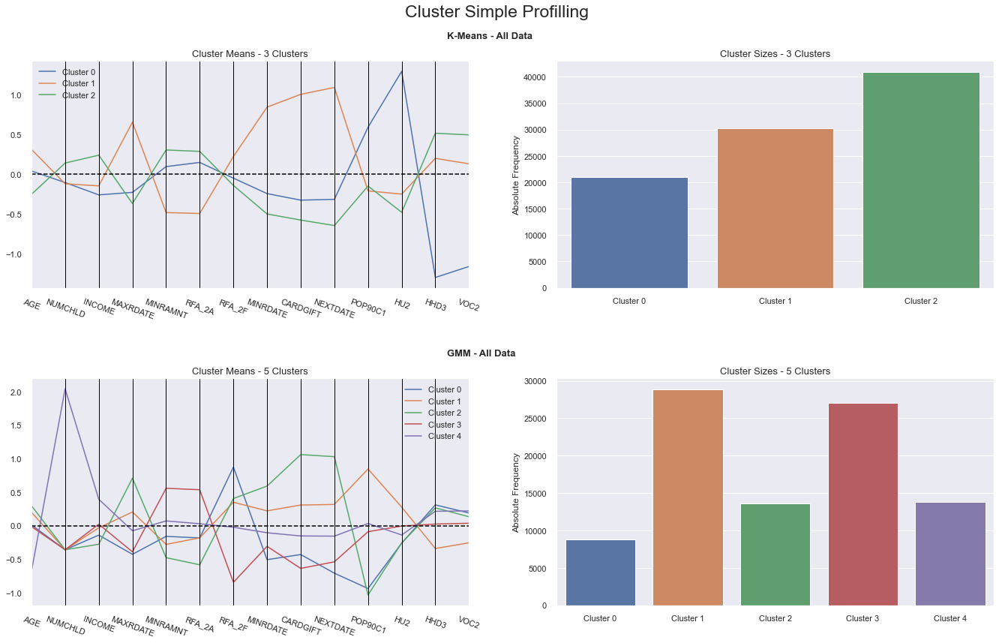

In [271]:
# Comparing both K-means and GMM solutions
comp_complete_df = kmeans_merged_df.merge(gmm_df["gmm_labels"], left_index=True, right_index=True)
cluster_profiles(comp_complete_df, ["kmeans_merged_labels", "gmm_labels"], figsize=(23, 13), compar_titles=["K-Means - All Data", "GMM - All Data"])

## References:
Deal with nan values:
https://stackoverflow.com/questions/50670080/mice-implementation-in-python
https://stackoverflow.com/questions/45321406/missing-value-imputation-in-python-using-knn
https://stackoverflow.com/questions/45239256/data-imputation-with-fancyimpute-and-pandas
https://stackoverflow.com/questions/54059964/can-not-use-mice-from-fancyimputer-python


Use mean or median:
https://www.wcc.nrcs.usda.gov/normals/median_average.htm